In [1]:
import pandas as pd
df = pd.read_csv("C:/Users/seonahryu/Desktop/urp/combined_data.csv", index_col='date')

-1~1 정규화

In [2]:
from sklearn.preprocessing import MinMaxScaler

# 데이터 정규화
features_to_scale = ['past_day_close', 'Open', 'High', 'Low', 'Volume', 'Adj Close'] # nasdaq 지수만 정규화

scaler = MinMaxScaler(feature_range=(-1,1))
df[features_to_scale] = scaler.fit_transform(df[features_to_scale])

print(df.head(10))

            vader_sentiment  roberta_sentiment  past_day_close      Open  \
date                                                                       
2009-05-05           0.7712                  0       -0.989263 -0.990806   
2009-05-08           0.6468                  1       -0.994376 -0.993383   
2009-05-12           0.0000                 -1       -0.992755 -0.992368   
2009-05-12           0.3235                  0       -0.992755 -0.992368   
2009-05-13           0.7506                  0       -0.994410 -0.997363   
2009-05-14           0.0000                  1       -1.000000 -1.000000   
2009-05-15           0.3612                  0       -0.997297 -0.998372   
2009-05-19           0.0000                  0       -0.992634 -0.994088   
2009-05-20           0.0000                  1       -0.992399 -0.992287   
2009-05-21           0.6249                  1       -0.993123 -0.995950   

                High       Low    Volume  Adj Close  
date                             

sentiment 범위 확인

In [3]:
# 최대값과 최소값 계산
vader_max = df['vader_sentiment'].max()
vader_min = df['vader_sentiment'].min()
roberta_max = df['roberta_sentiment'].max()
roberta_min = df['roberta_sentiment'].min()

# 결과 출력
print(f"VADER Sentiment - 최대값: {vader_max}, 최소값: {vader_min}")
print(f"Roberta Sentiment - 최대값: {roberta_max}, 최소값: {roberta_min}")

VADER Sentiment - 최대값: 0.9961, 최소값: -0.9963
Roberta Sentiment - 최대값: 1, 최소값: -1


In [4]:
# VADER Sentiment 정규화
min_vader = vader_min
max_vader = vader_max
# 정규화: -1에서 1 사이로 변환
df['vader_sentiment'] = 2 * ((df['vader_sentiment'] - min_vader) / (max_vader - min_vader)) - 1

# GRU

In [5]:
import numpy as np

# 데이터셋 생성 함수 정의
def create_dataset(X, y, time_step=30):
    Xs, ys = [], []
    for i in range(len(X) - time_step):
        Xs.append(X[i:(i + time_step)])
        ys.append(y[i + time_step])
    return np.array(Xs), np.array(ys)

In [6]:
from sklearn.metrics import mean_squared_error, r2_score

# 예측 및 성능 평가 함수 정의
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r_squared = r2_score(y_test, y_pred)
    return mse, rmse, r_squared

In [7]:
from keras.models import Sequential
from keras.layers import GRU, Dense, Dropout, Input
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam

# GRU 모델 정의
def create_model():
    model = Sequential()
    model.add(Input(shape=(X_train.shape[1], X_train.shape[2])))  # Input 레이어 추가
    model.add(GRU(100, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(GRU(100))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='tanh'))  # -1~1 정규화해서 출력층 tanh 함수
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# EarlyStopping 콜백 정의
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

input : VADER

In [8]:
from sklearn.model_selection import train_test_split

vader = ['vader_sentiment']

X, y = create_dataset(df[vader].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [9]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Batch Size: 32, MSE: 0.985, RMSE: 0.993, R-squared: -15.341
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Batch Size: 64, MSE: 0.959, RMSE: 0.979, R-squared: -14.905
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
Batch Size: 128, MSE: 0.871, RMSE: 0.933, R-squared: -13.440
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 256, MSE: 1.014, RMSE: 1.007, R-squared: -15.813
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Batch Size: 512, MSE: 0.981, RMSE: 0.991, R-squared: -15.270
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 1024, MSE: 0.983, RMSE: 0.992, R-squared: -15.308


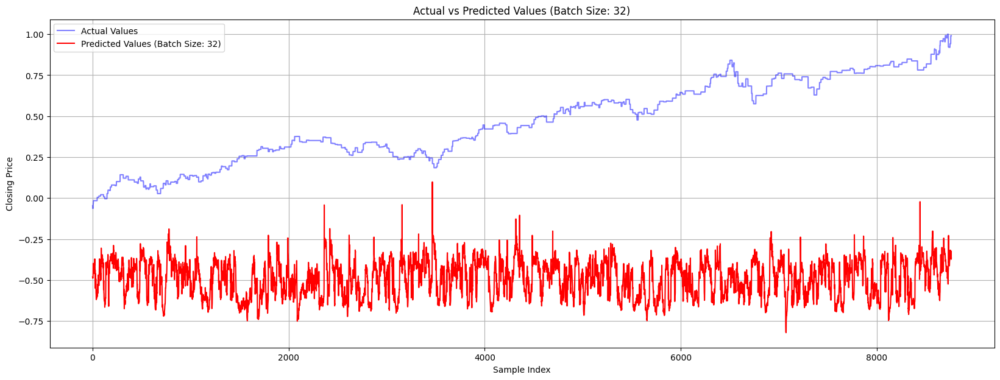

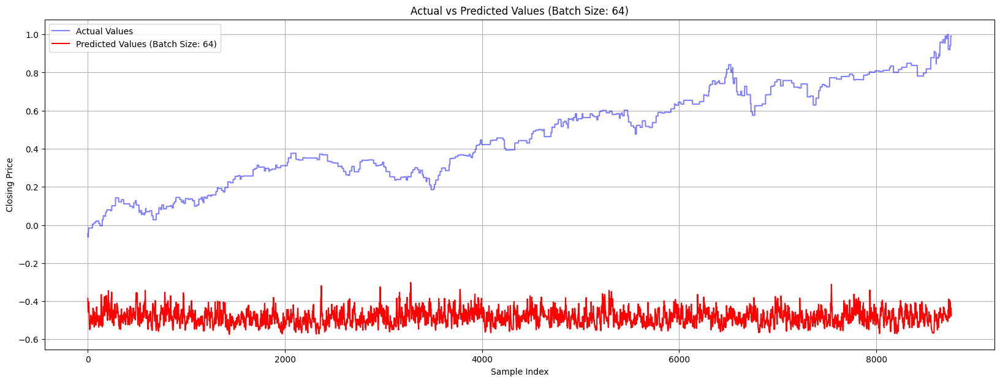

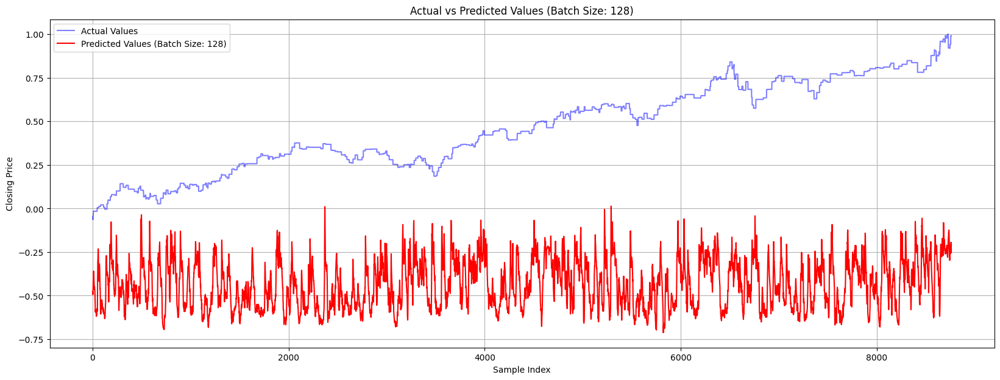

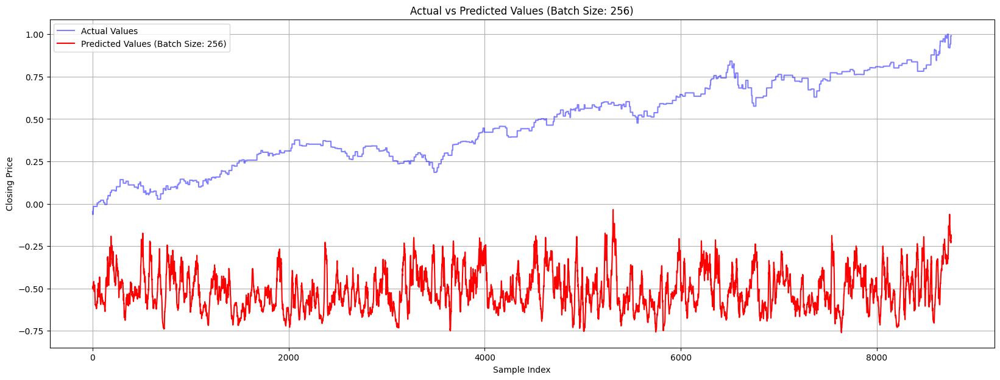

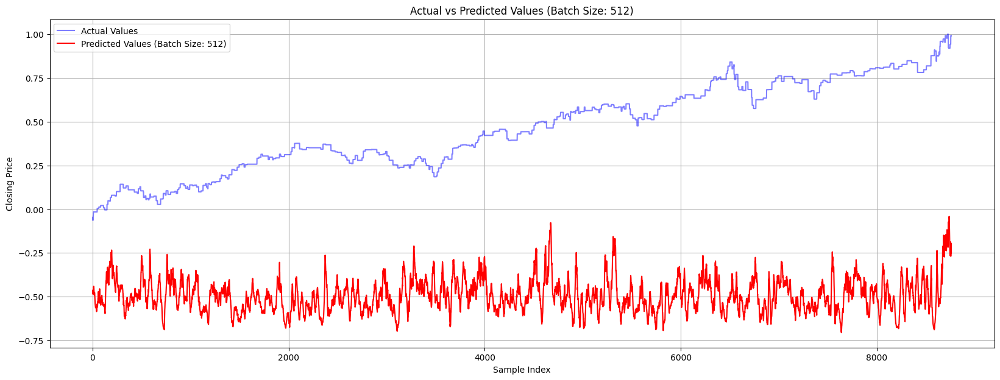

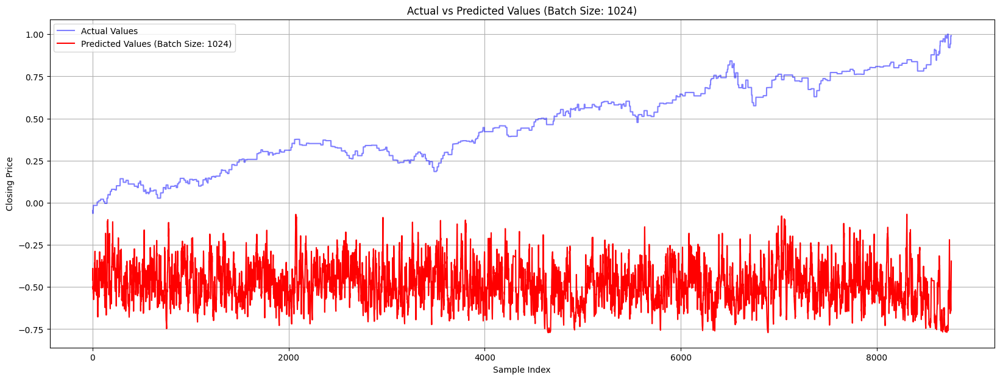

In [10]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

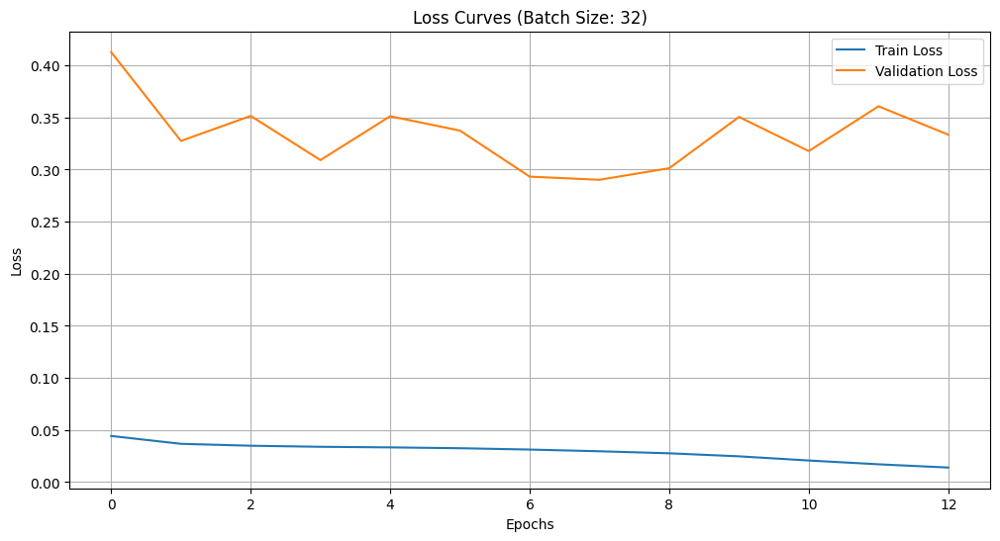

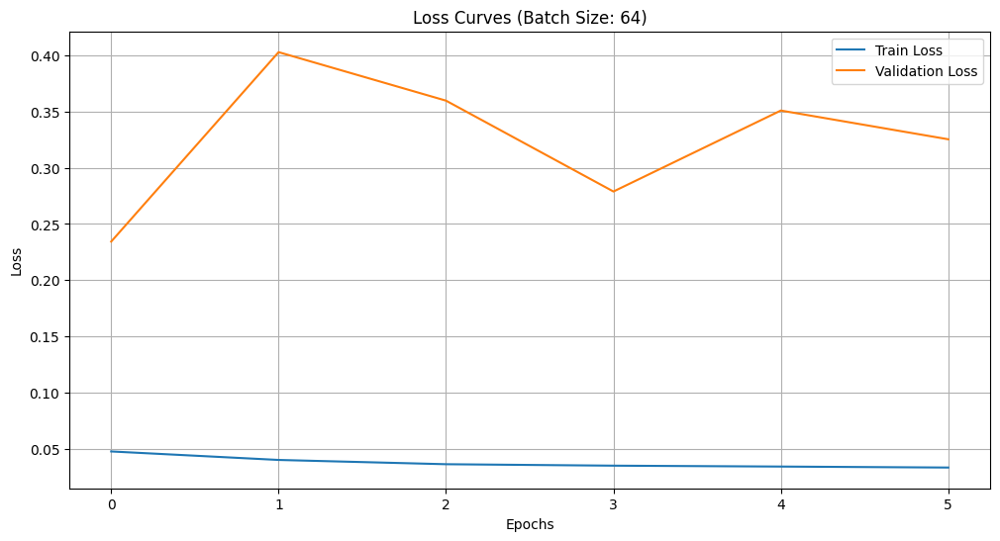

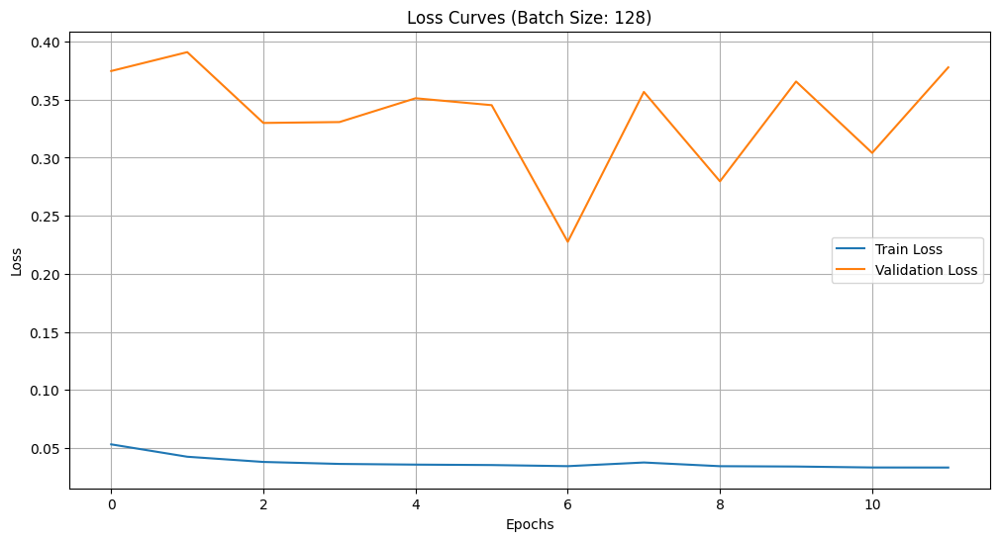

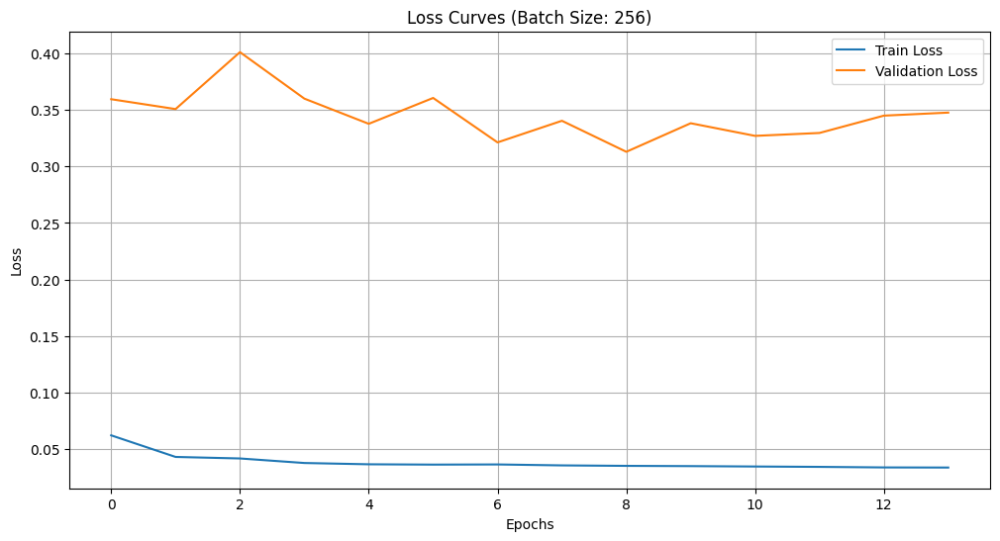

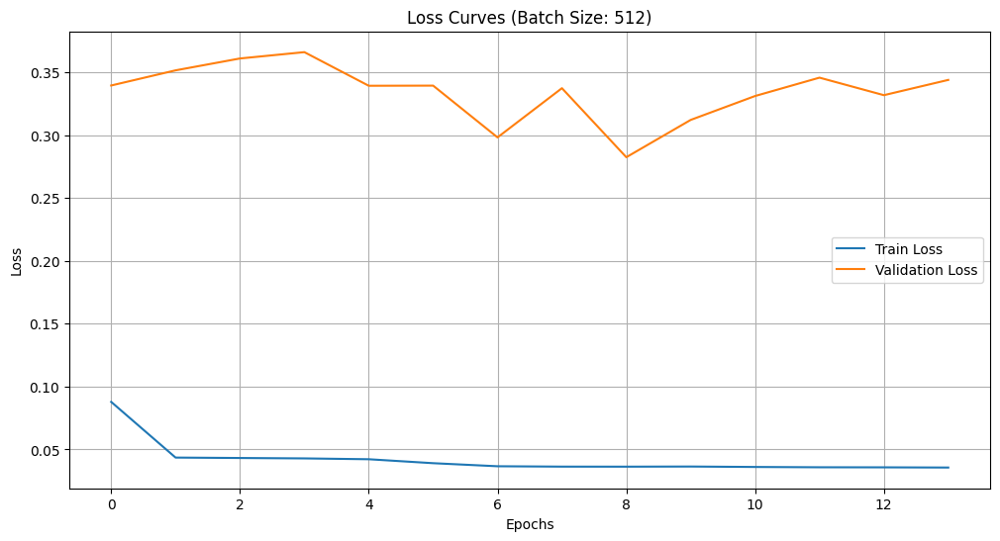

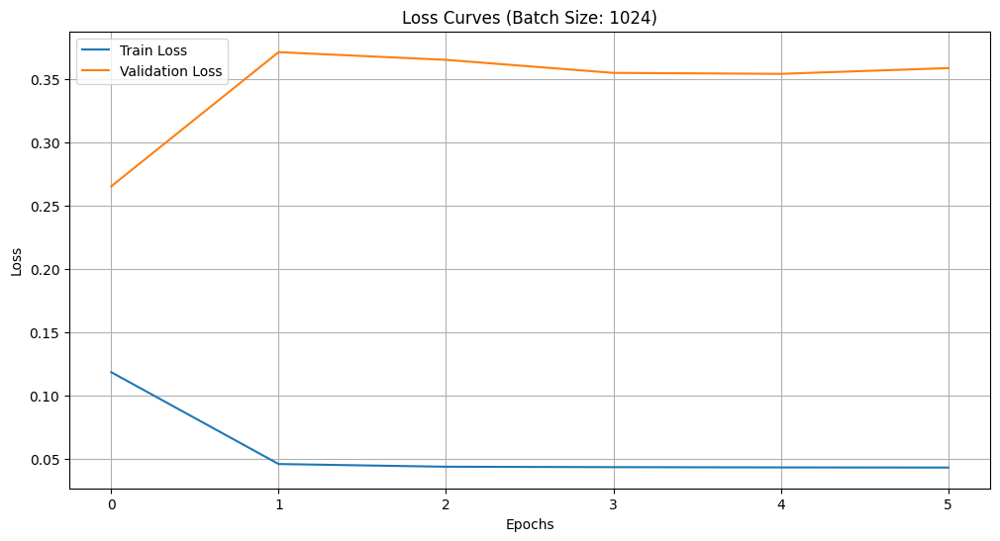

In [11]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : RoBERTa

In [12]:
from sklearn.model_selection import train_test_split

roberta = ['roberta_sentiment']

X, y = create_dataset(df[roberta].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [13]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Batch Size: 32, MSE: 1.112, RMSE: 1.054, R-squared: -17.433
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Batch Size: 64, MSE: 1.090, RMSE: 1.044, R-squared: -17.074
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
Batch Size: 128, MSE: 1.051, RMSE: 1.025, R-squared: -16.425
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Batch Size: 256, MSE: 1.107, RMSE: 1.052, R-squared: -17.350
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 512, MSE: 1.147, RMSE: 1.071, R-squared: -18.026
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 1024, MSE: 1.129, RMSE: 1.063, R-squared: -17.720


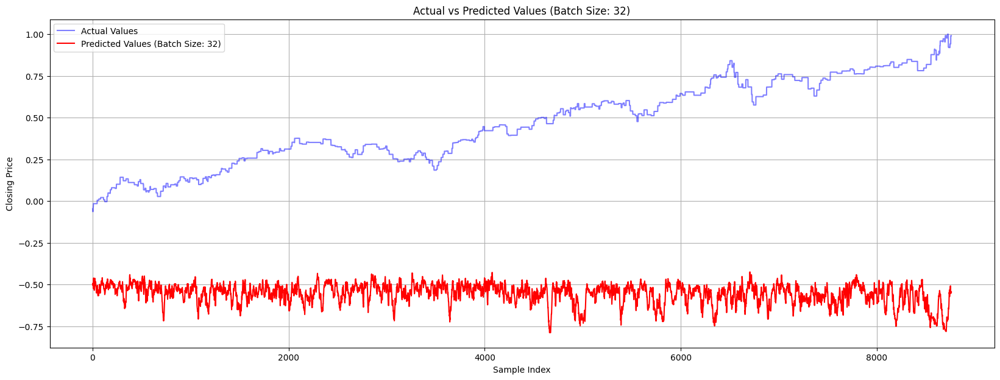

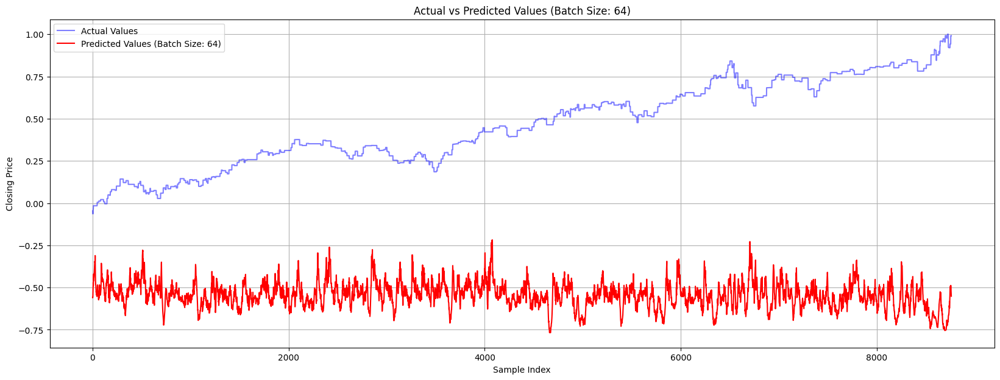

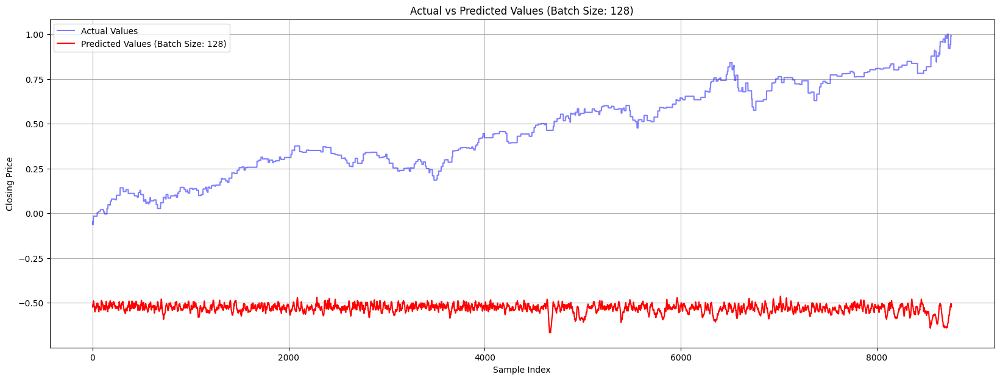

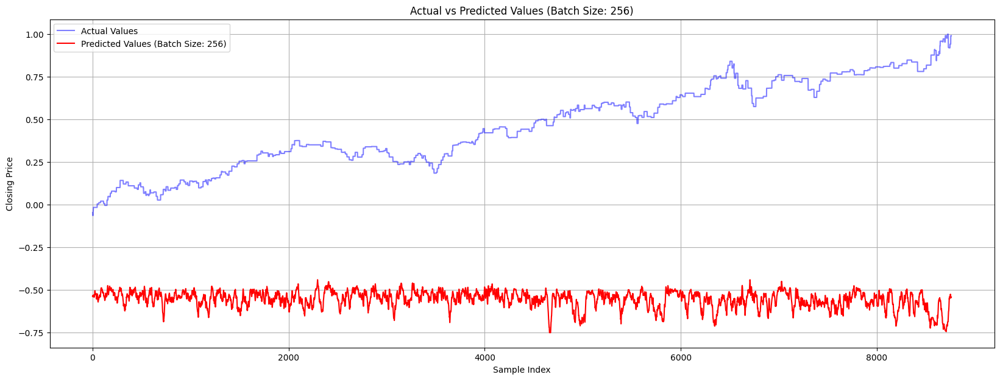

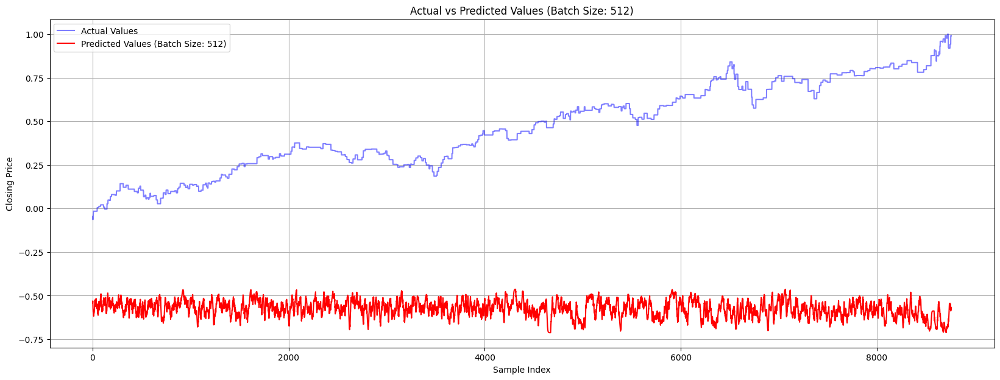

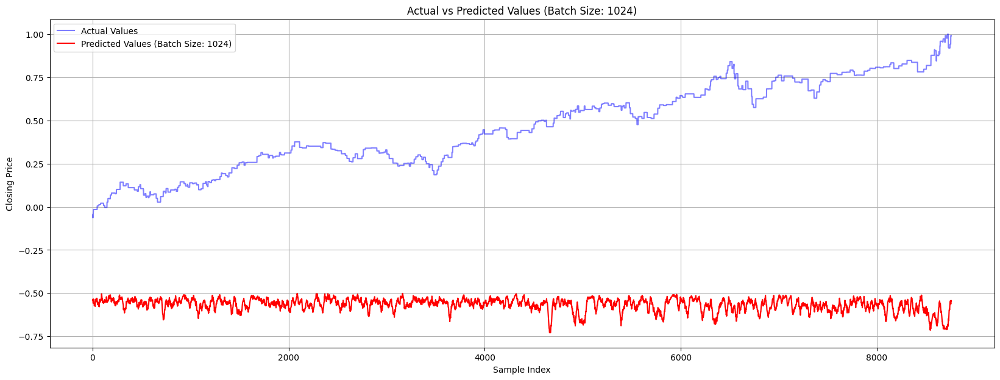

In [14]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

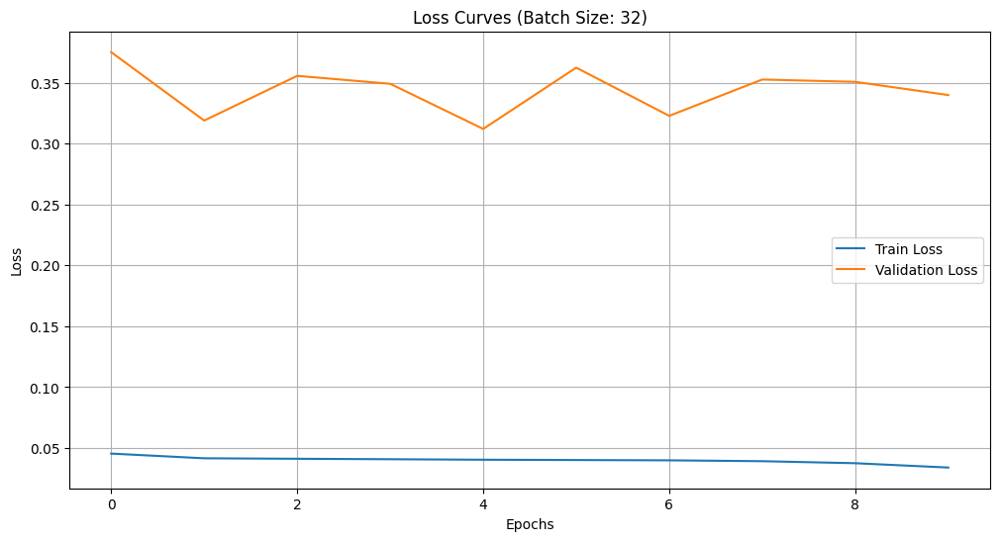

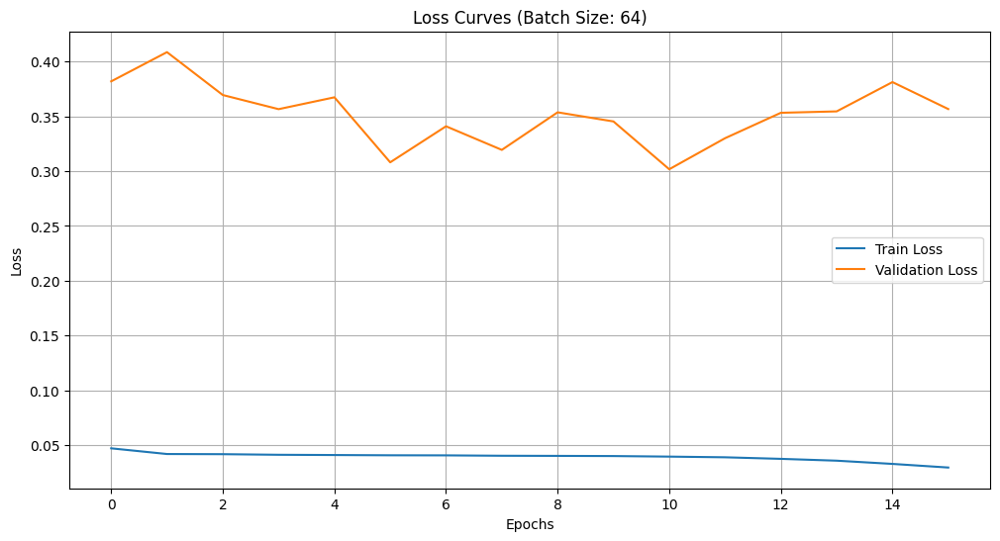

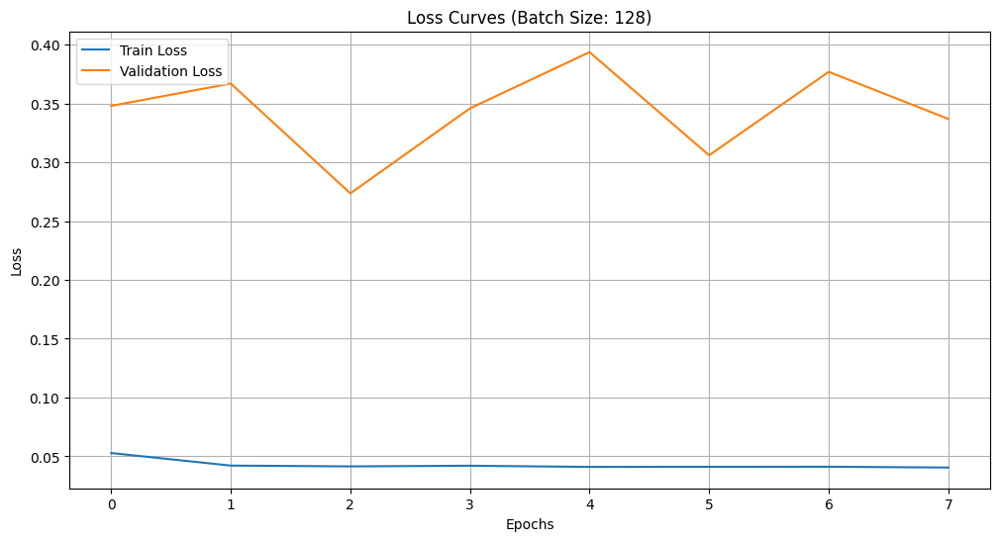

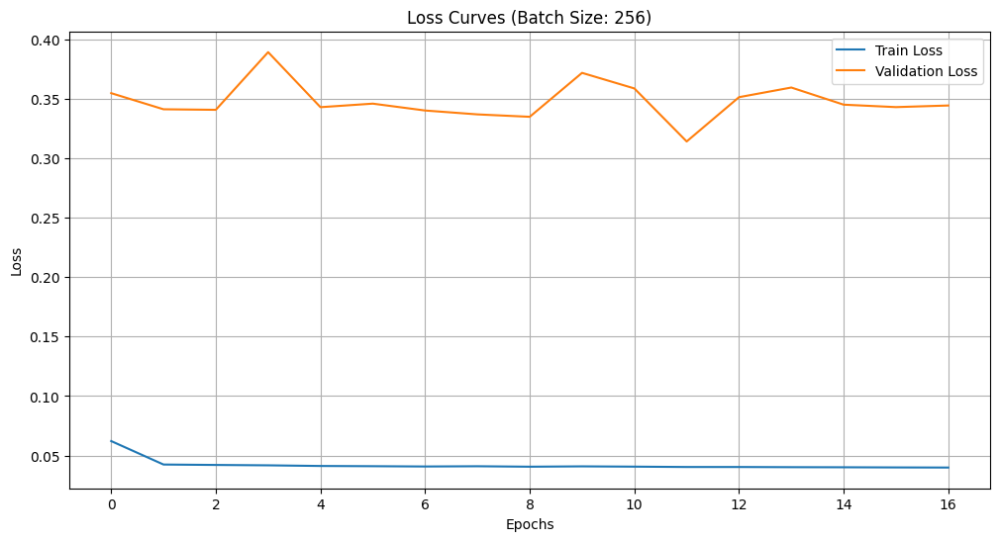

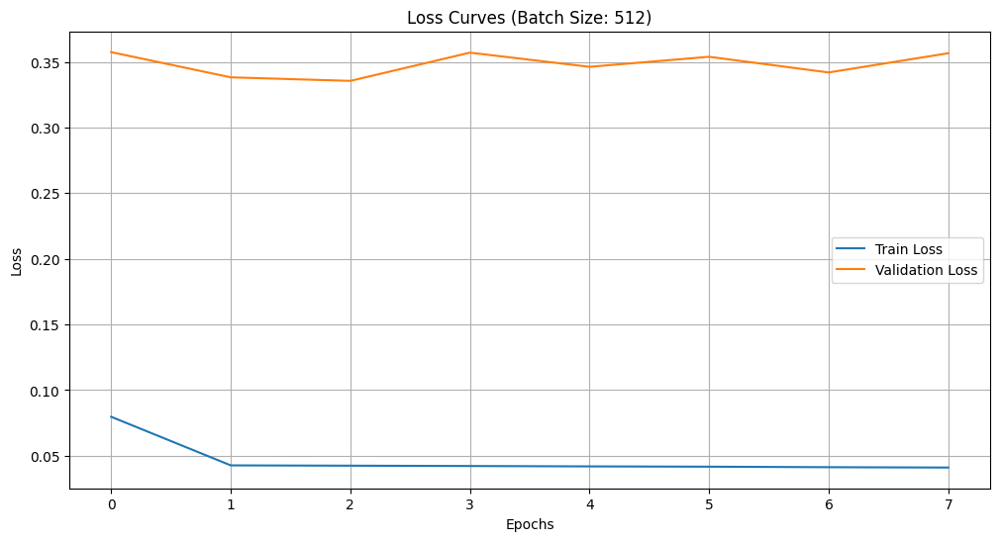

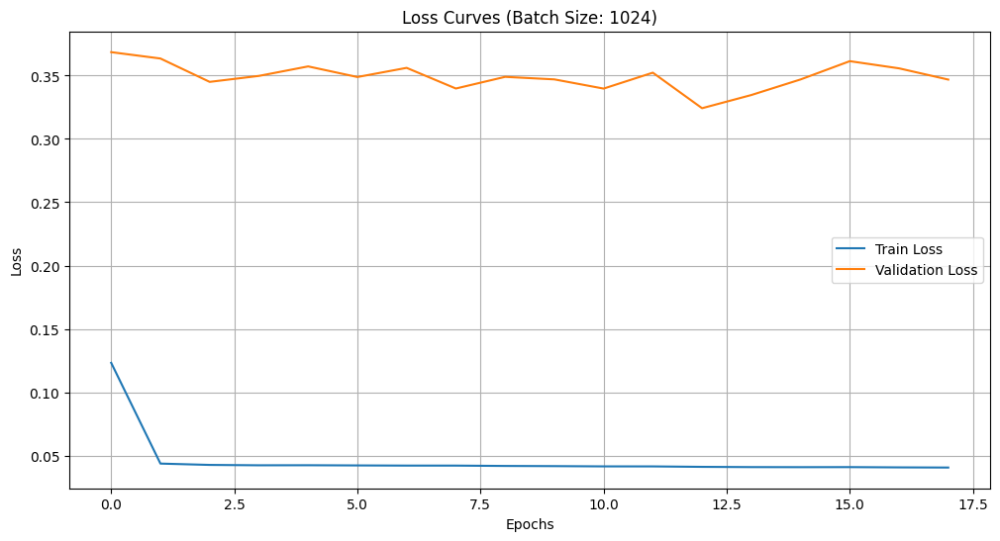

In [15]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : VADER + RoBERTa

In [16]:
from sklearn.model_selection import train_test_split

sentiment = ['vader_sentiment', 'roberta_sentiment']

X, y = create_dataset(df[sentiment].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [17]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Batch Size: 32, MSE: 0.861, RMSE: 0.928, R-squared: -13.272
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Batch Size: 64, MSE: 0.861, RMSE: 0.928, R-squared: -13.274
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 128, MSE: 0.725, RMSE: 0.852, R-squared: -11.029
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 256, MSE: 0.881, RMSE: 0.939, R-squared: -13.615
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 512, MSE: 0.906, RMSE: 0.952, R-squared: -14.019
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
Batch Size: 1024, MSE: 0.907, RMSE: 0.952, R-squared: -14.042


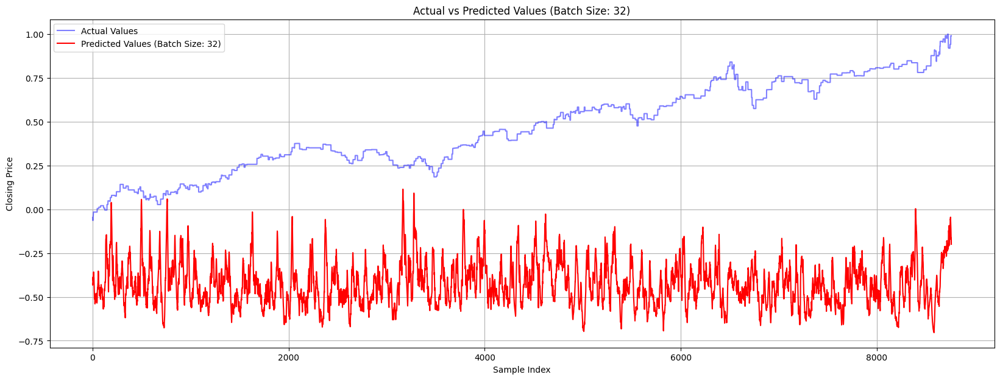

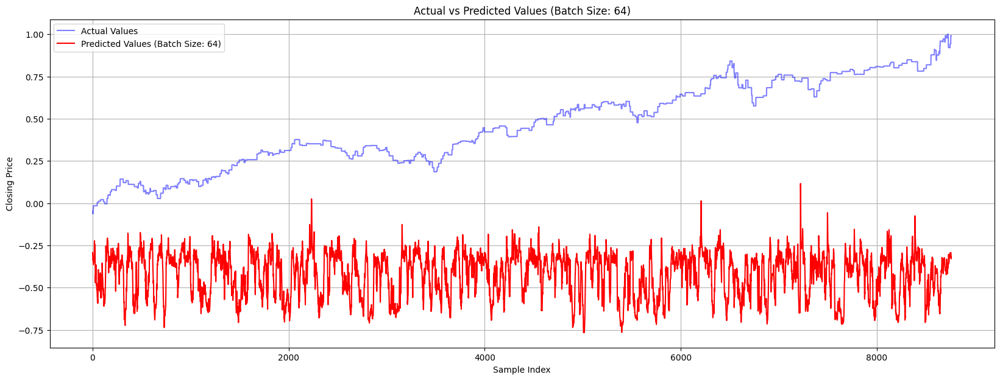

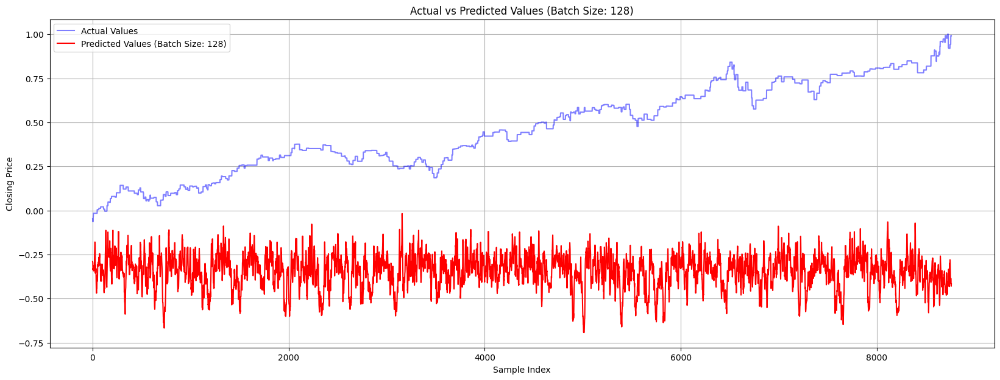

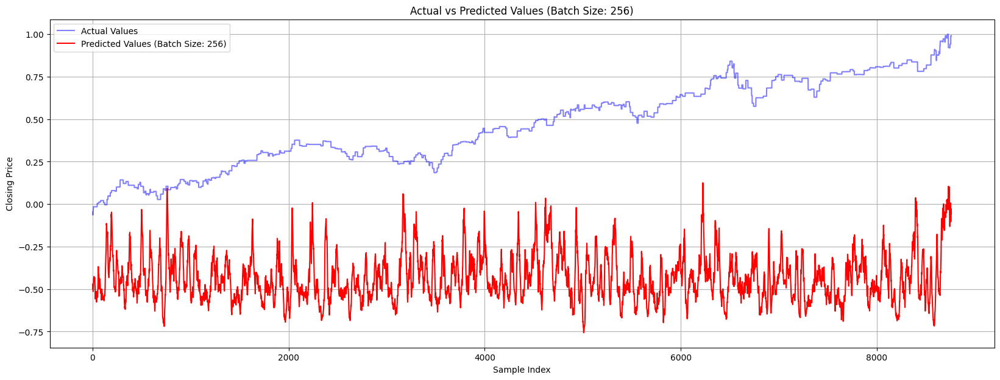

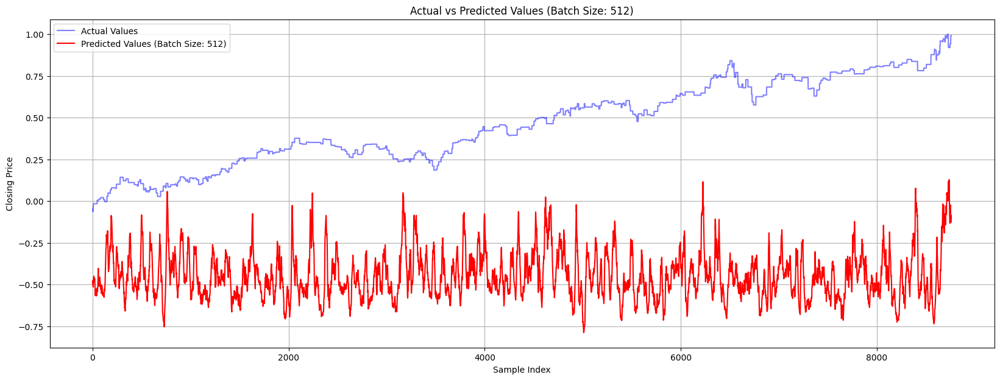

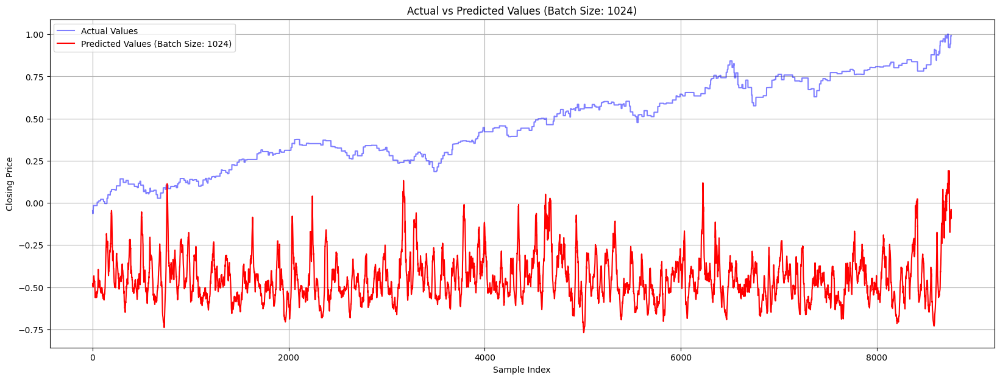

In [18]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

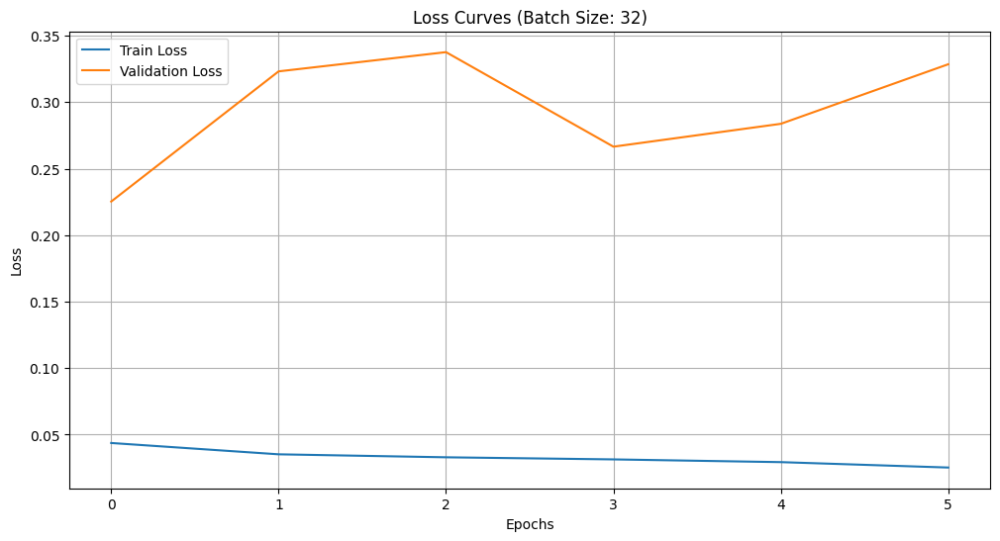

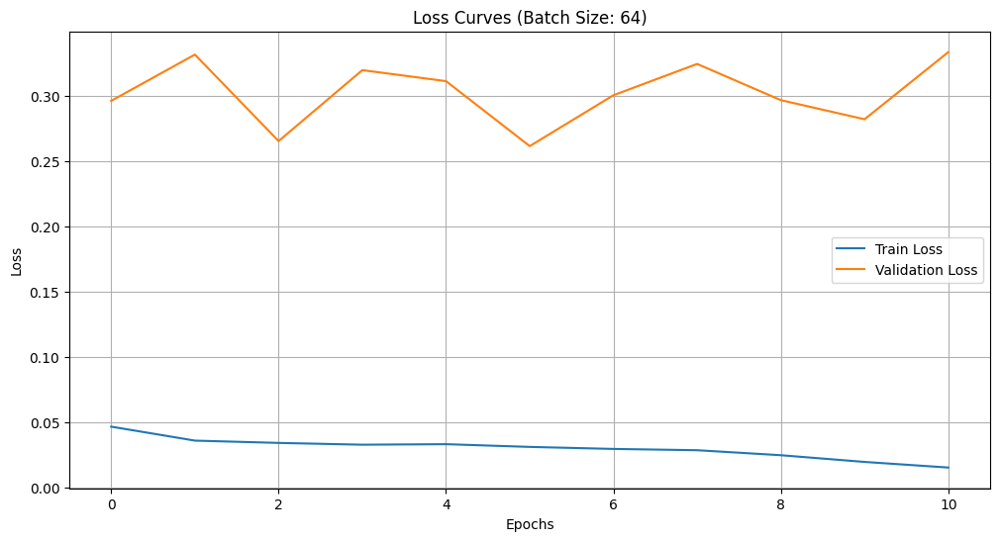

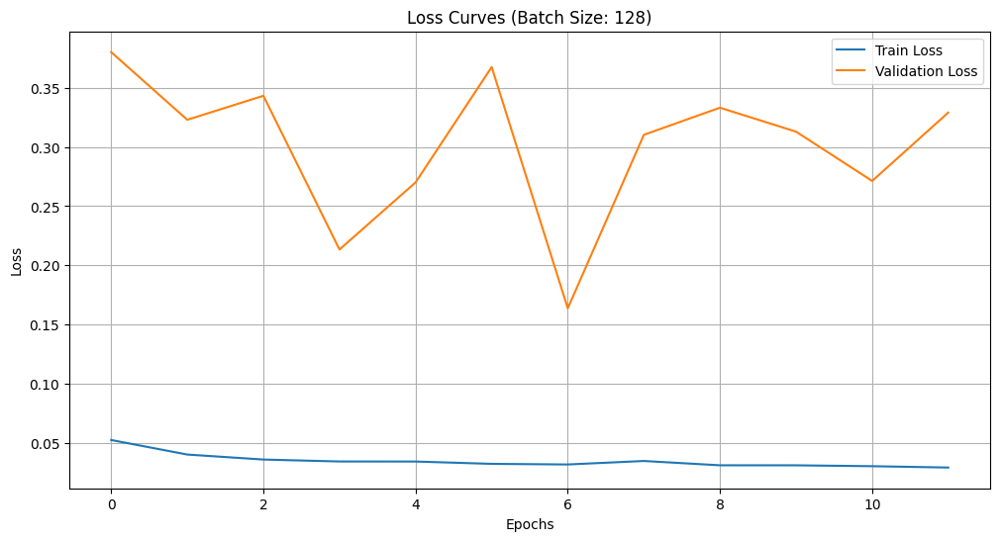

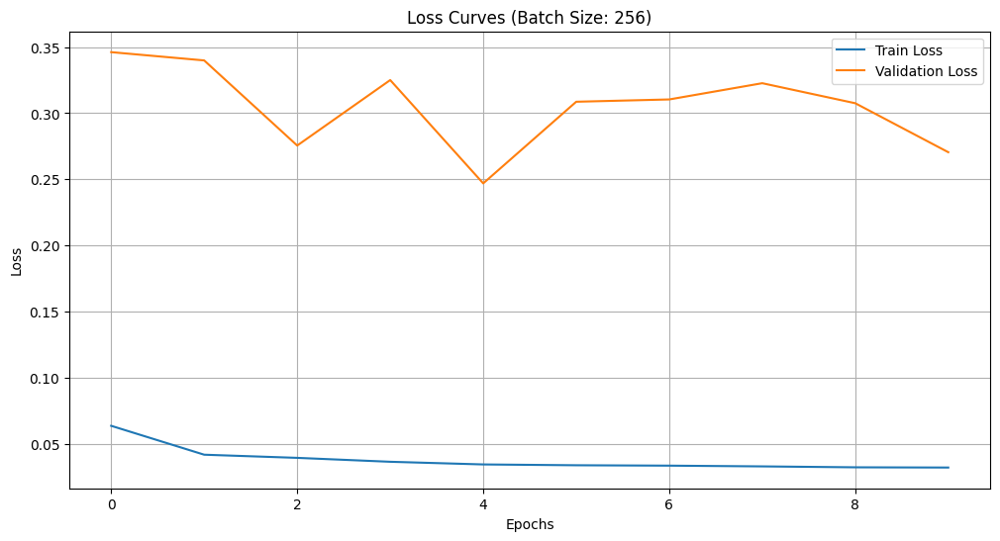

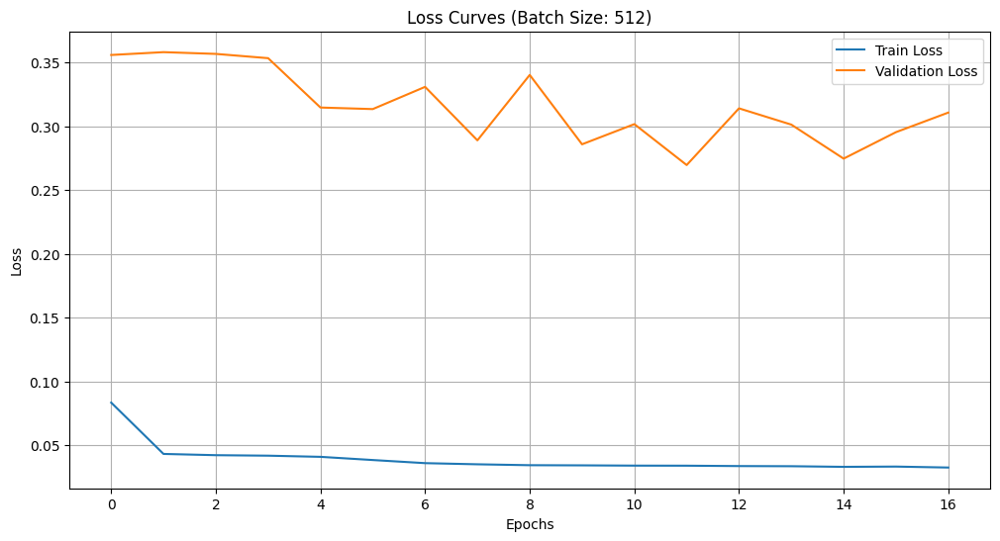

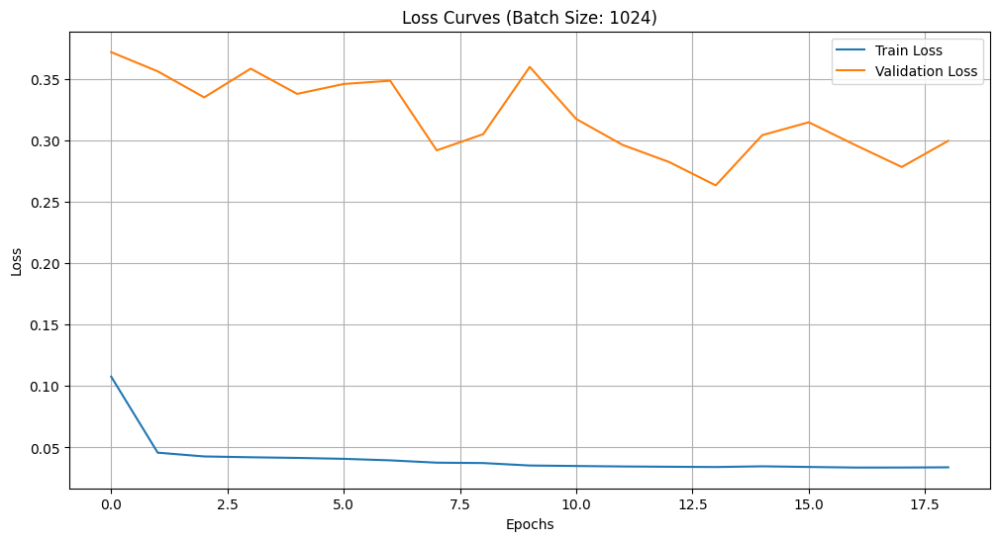

In [19]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : past_day_close

In [20]:
from sklearn.model_selection import train_test_split

past_day_close = ['past_day_close']

X, y = create_dataset(df[past_day_close].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [21]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 32, MSE: 0.021, RMSE: 0.145, R-squared: 0.653
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 64, MSE: 0.021, RMSE: 0.145, R-squared: 0.651
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
Batch Size: 128, MSE: 0.015, RMSE: 0.122, R-squared: 0.755
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 256, MSE: 0.014, RMSE: 0.118, R-squared: 0.769
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 512, MSE: 0.004, RMSE: 0.064, R-squared: 0.933
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
Batch Size: 1024, MSE: 0.010, RMSE: 0.098, R-squared: 0.842


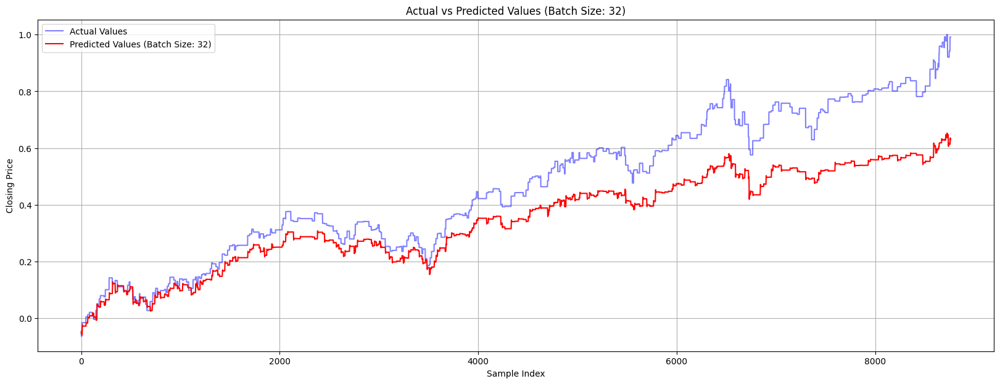

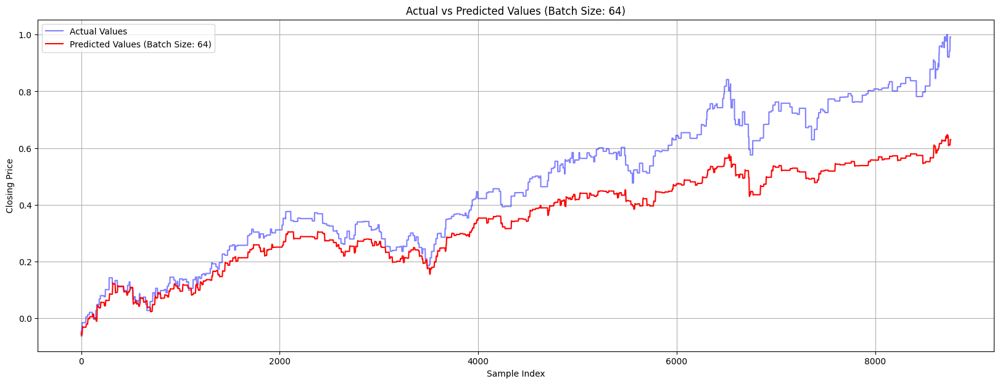

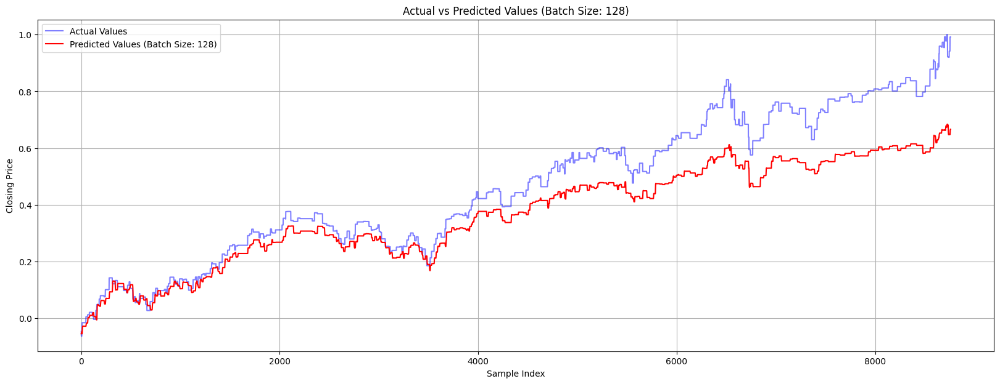

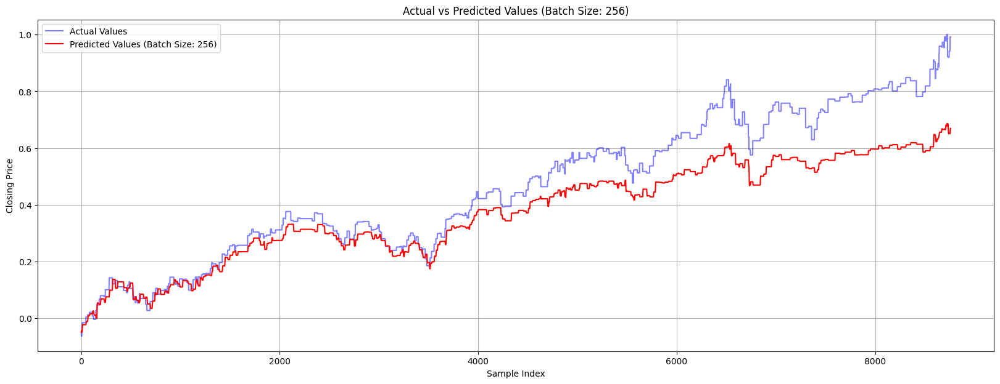

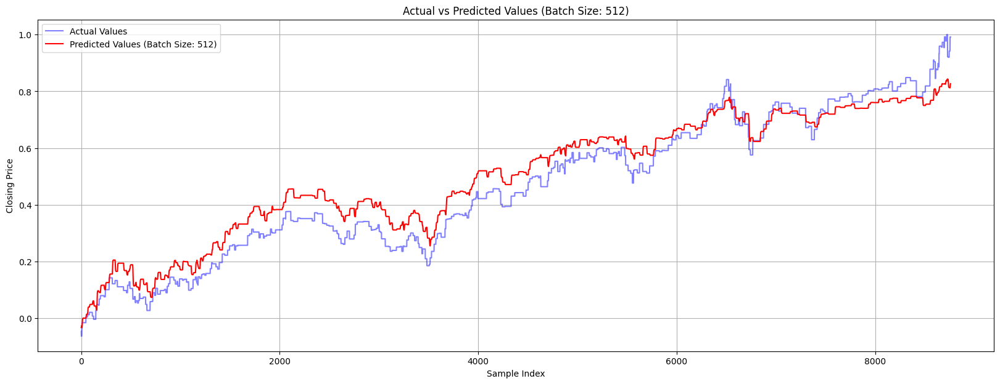

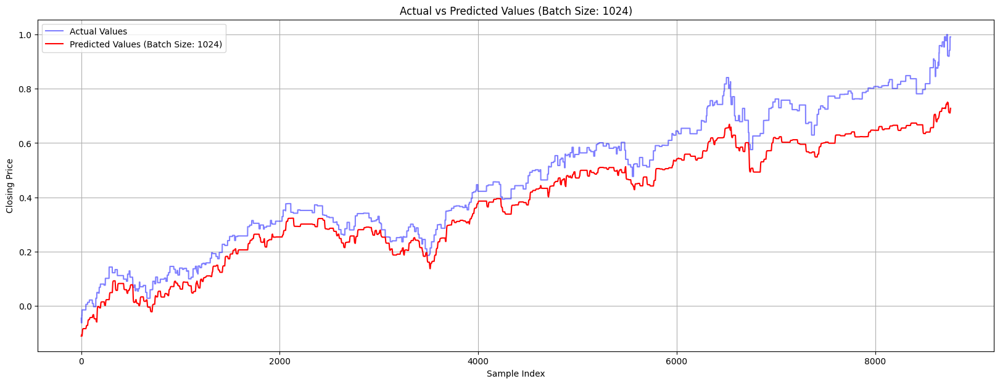

In [22]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

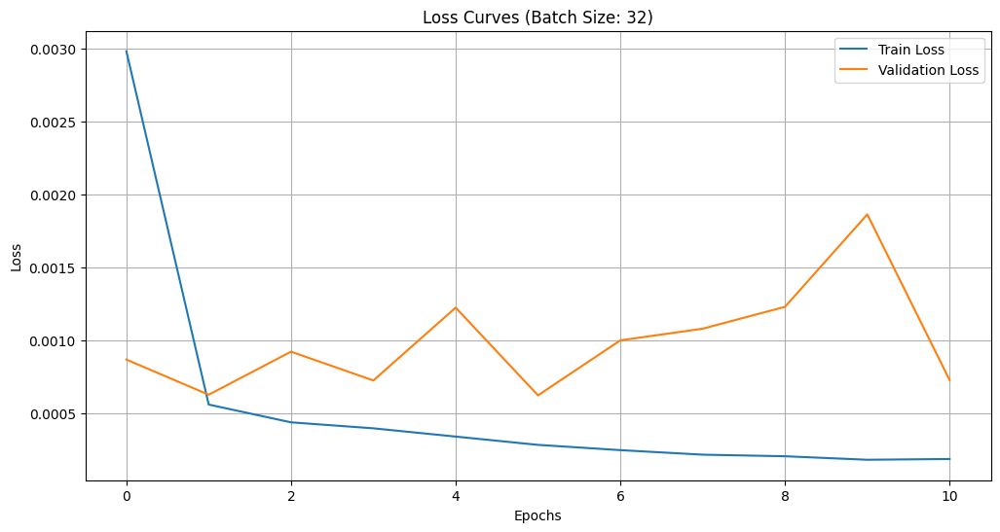

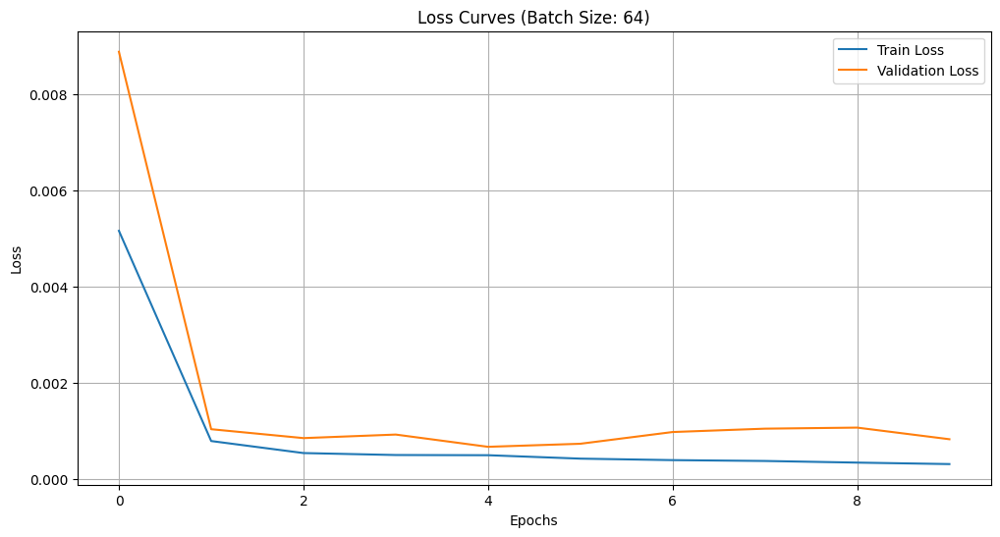

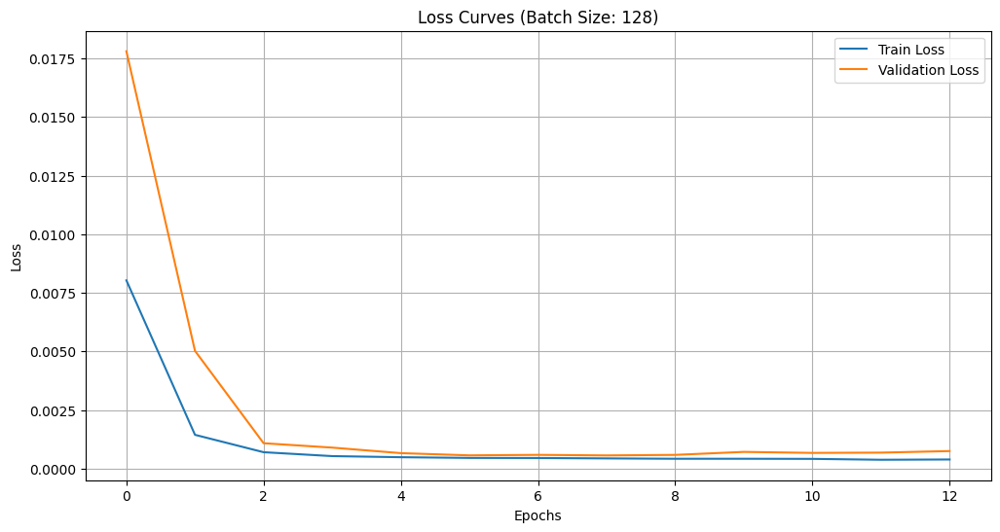

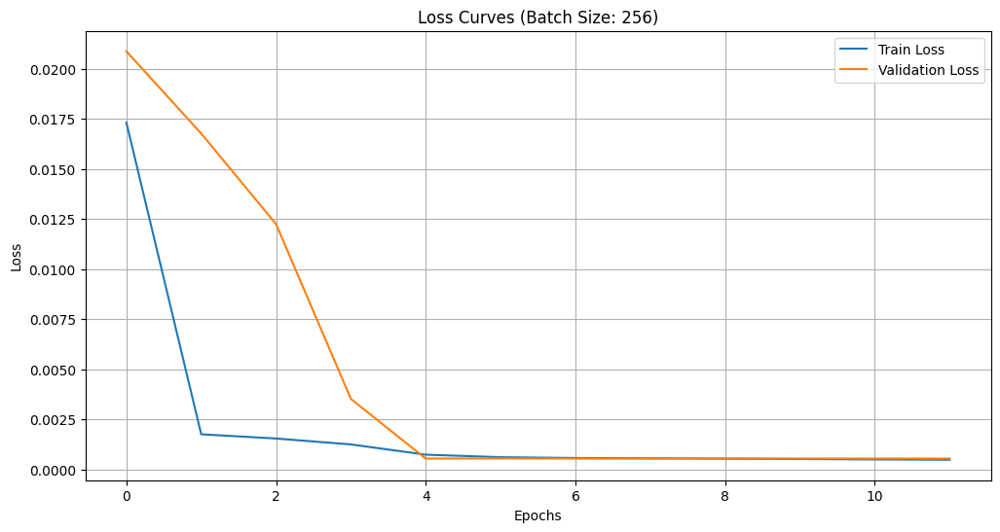

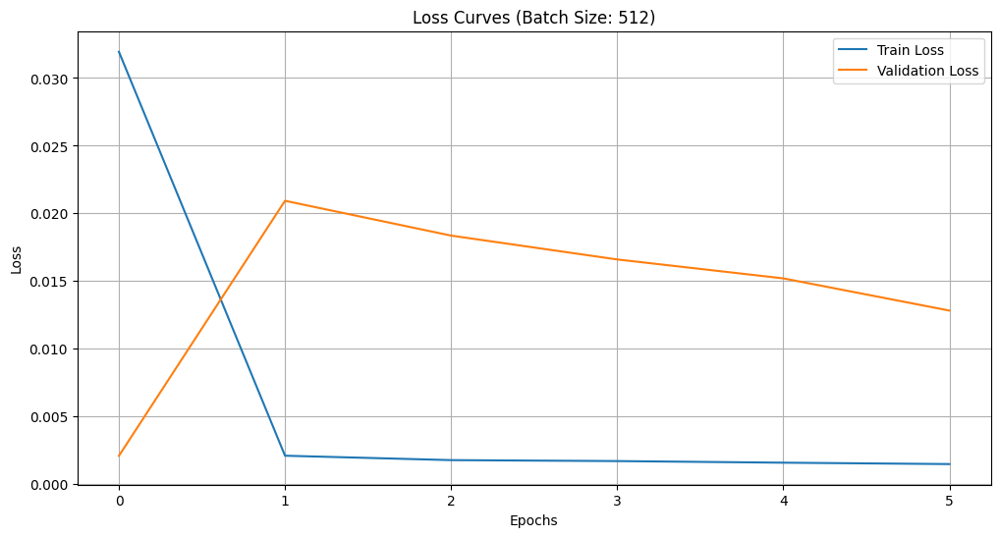

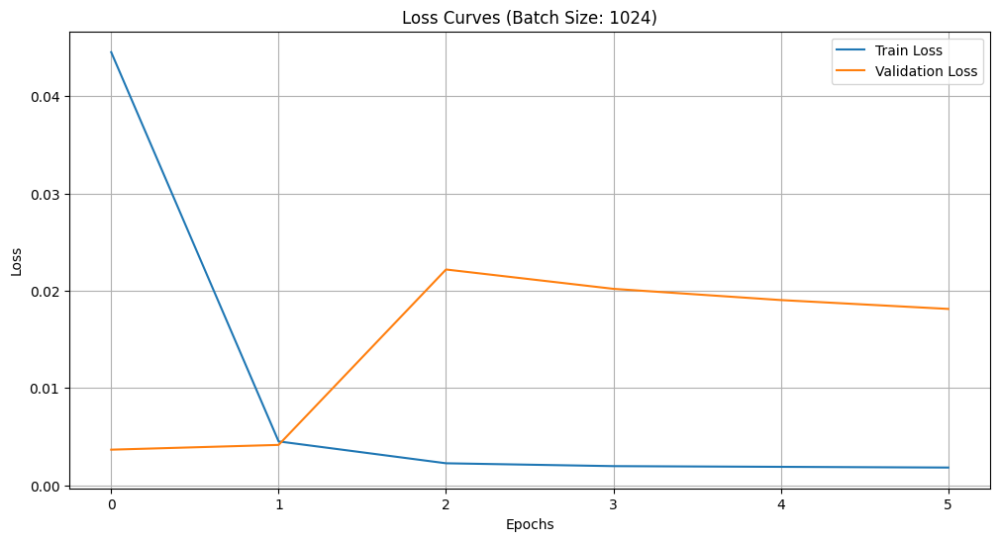

In [23]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : past_day_close + VADER

In [24]:
from sklearn.model_selection import train_test_split

past_vader = ['past_day_close', 'vader_sentiment']

X, y = create_dataset(df[past_vader].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [25]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Batch Size: 32, MSE: 0.014, RMSE: 0.120, R-squared: 0.760
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
Batch Size: 64, MSE: 0.021, RMSE: 0.145, R-squared: 0.650
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
Batch Size: 128, MSE: 0.013, RMSE: 0.114, R-squared: 0.785
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
Batch Size: 256, MSE: 0.017, RMSE: 0.131, R-squared: 0.715
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
Batch Size: 512, MSE: 0.003, RMSE: 0.057, R-squared: 0.946
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step
Batch Size: 1024, MSE: 0.004, RMSE: 0.063, R-squared: 0.934


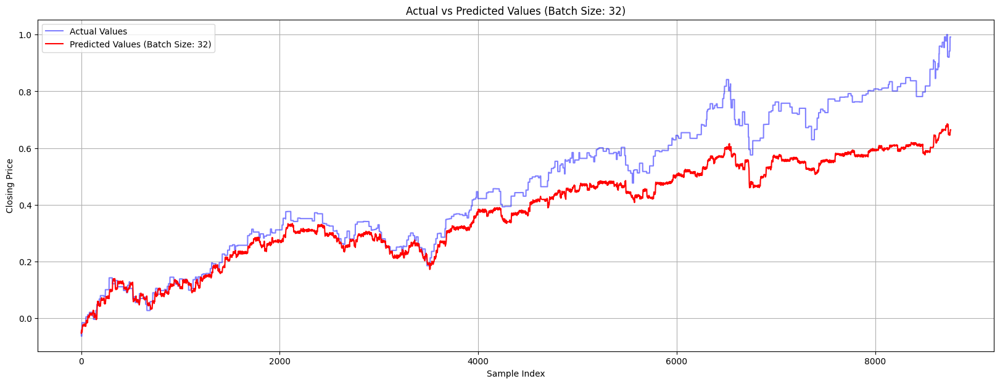

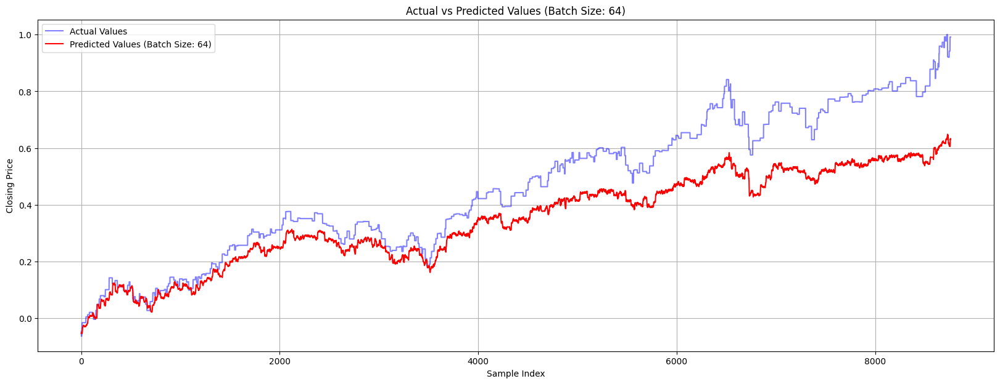

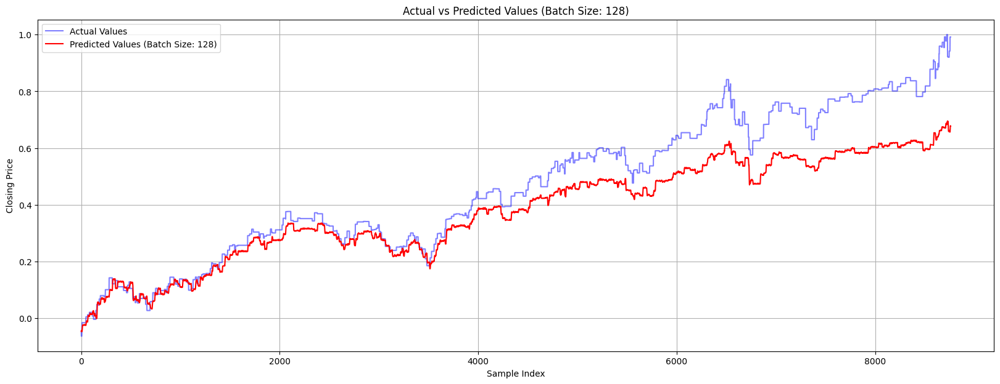

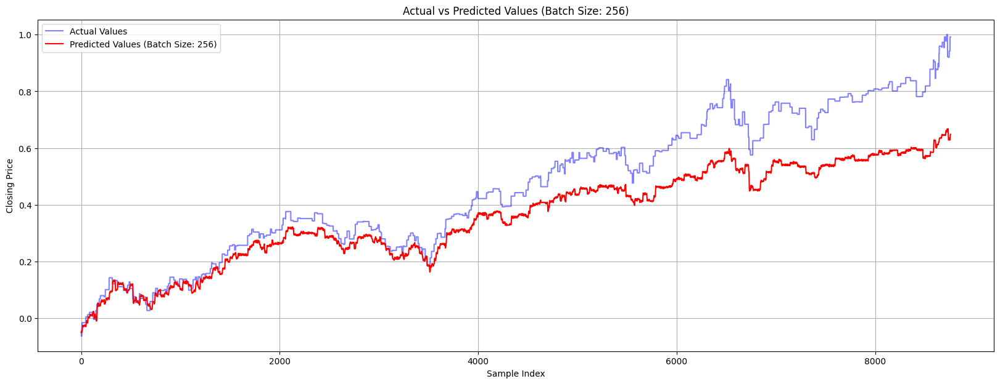

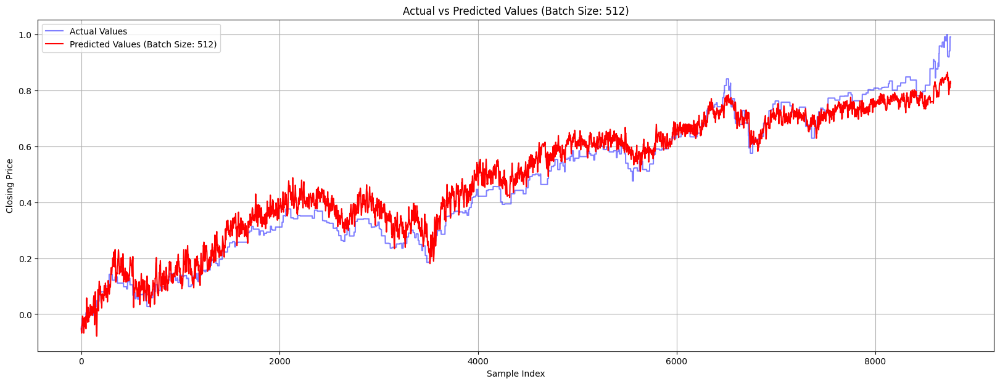

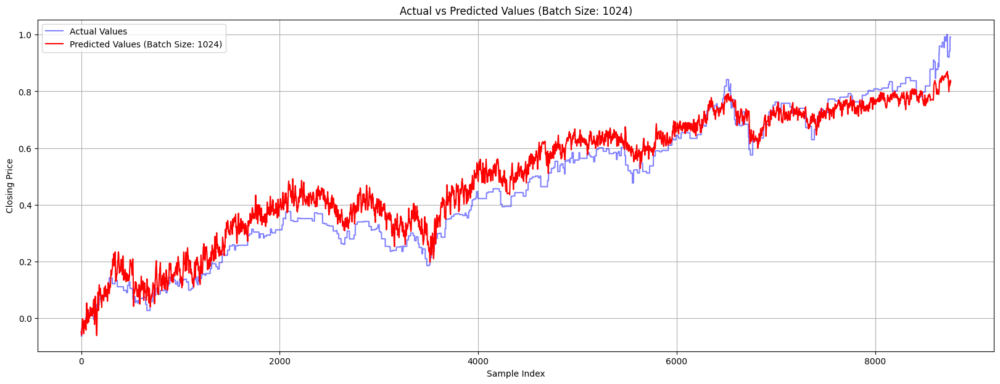

In [26]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

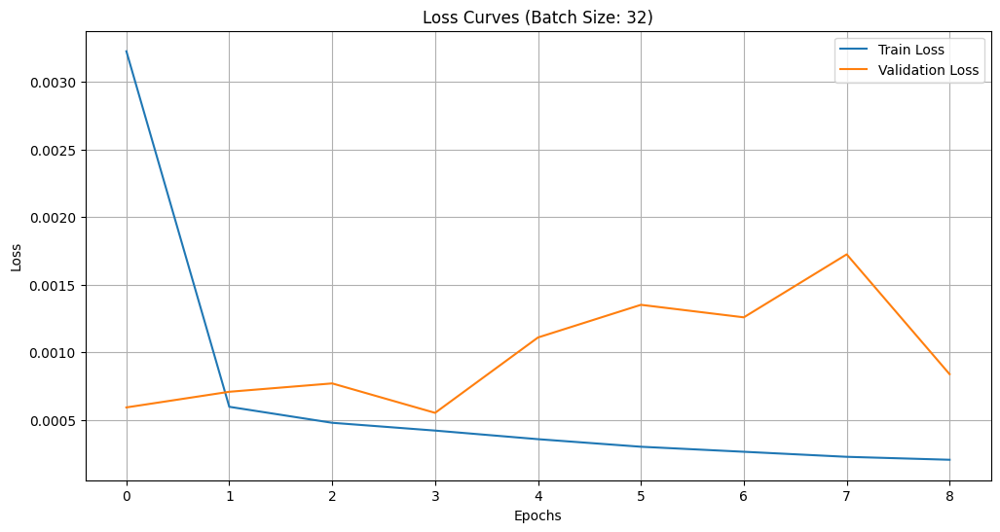

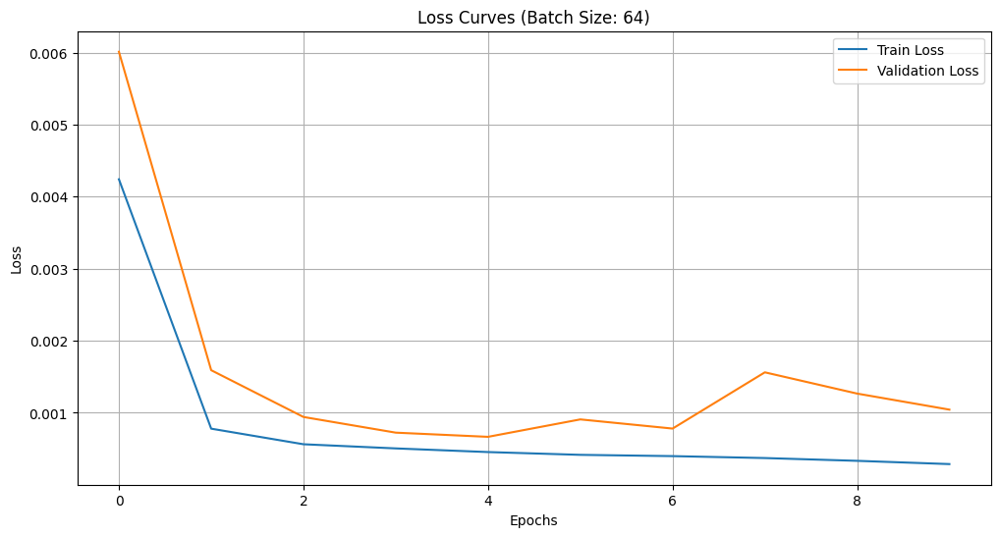

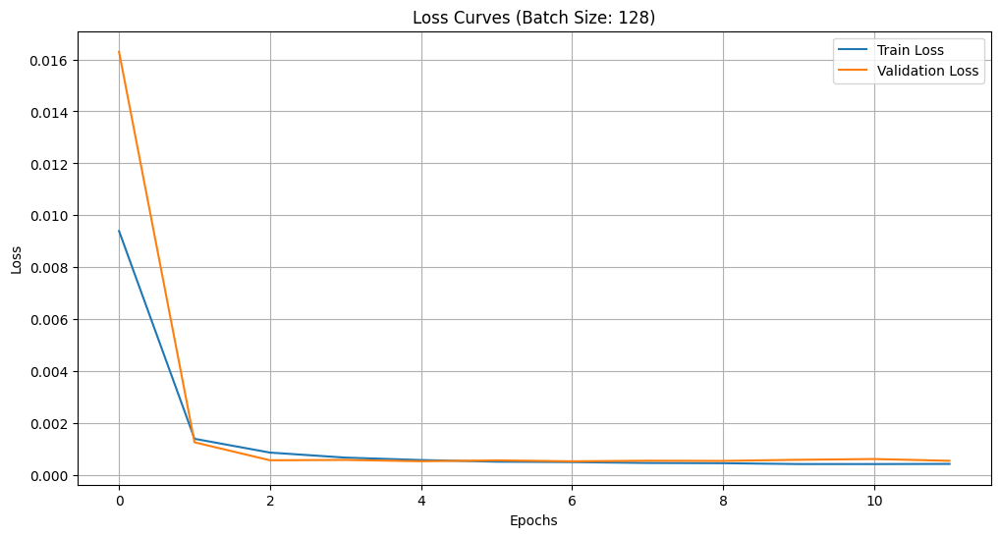

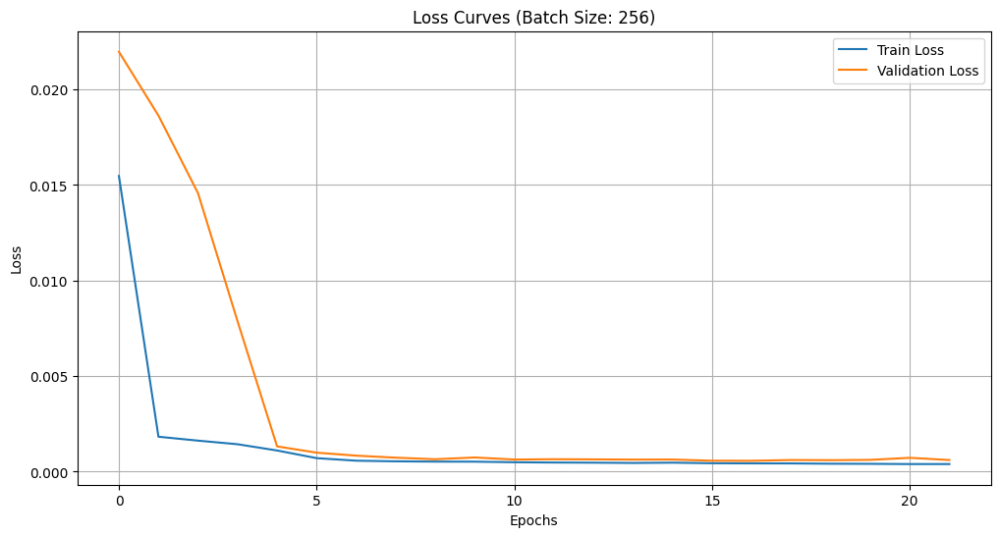

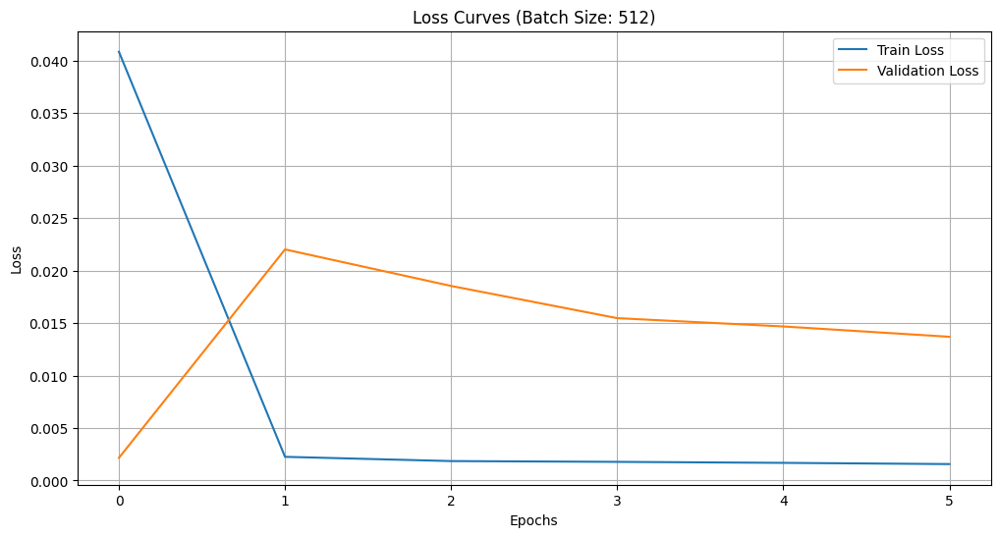

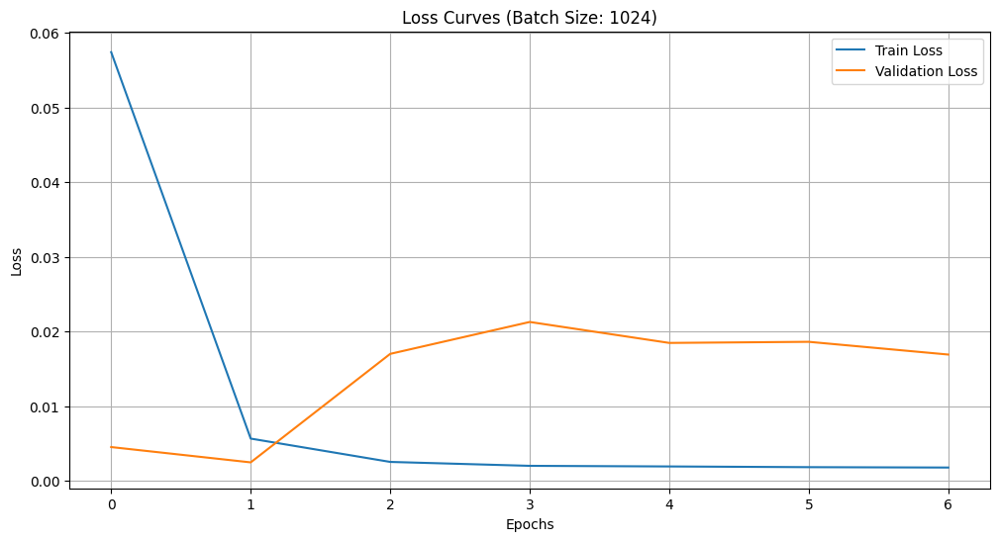

In [27]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : past_day_close + RoBERTa

In [28]:
from sklearn.model_selection import train_test_split

past_roberta = ['past_day_close', 'roberta_sentiment']

X, y = create_dataset(df[past_roberta].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [29]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step
Batch Size: 32, MSE: 0.022, RMSE: 0.149, R-squared: 0.631
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step
Batch Size: 64, MSE: 0.019, RMSE: 0.138, R-squared: 0.684
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step
Batch Size: 128, MSE: 0.016, RMSE: 0.127, R-squared: 0.731
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step
Batch Size: 256, MSE: 0.012, RMSE: 0.111, R-squared: 0.795
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step
Batch Size: 512, MSE: 0.003, RMSE: 0.059, R-squared: 0.943
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step
Batch Size: 1024, MSE: 0.007, RMSE: 0.082, R-squared: 0.890


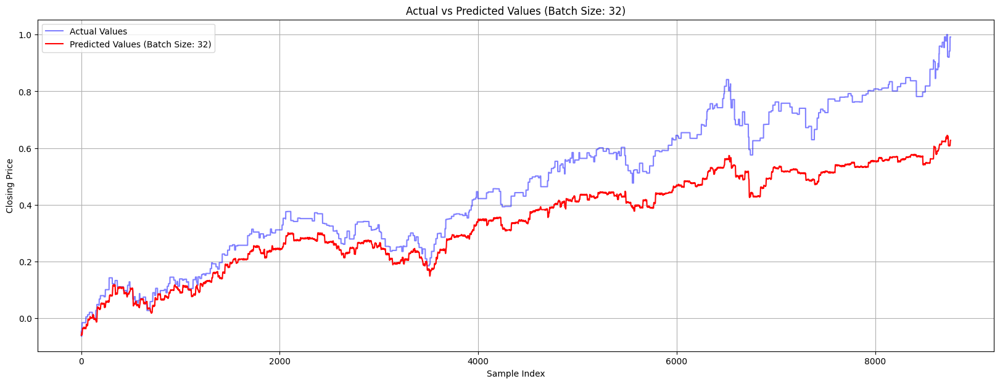

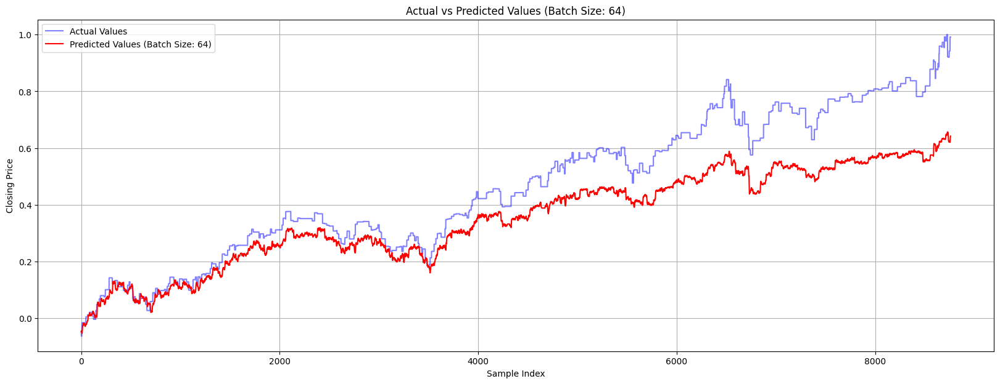

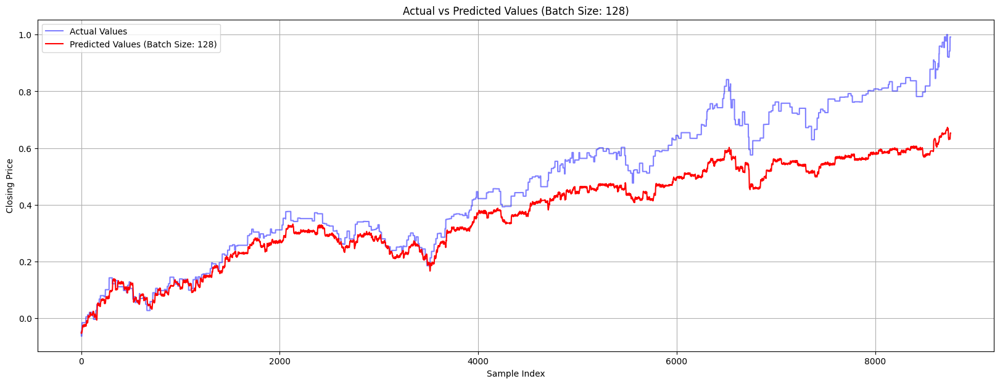

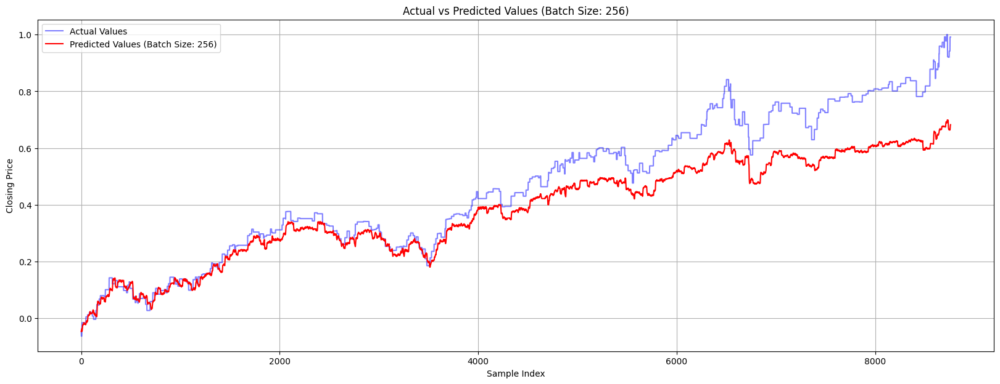

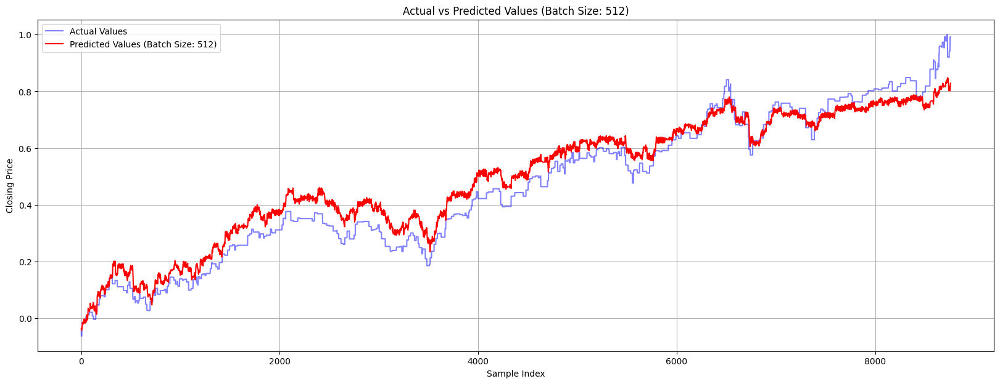

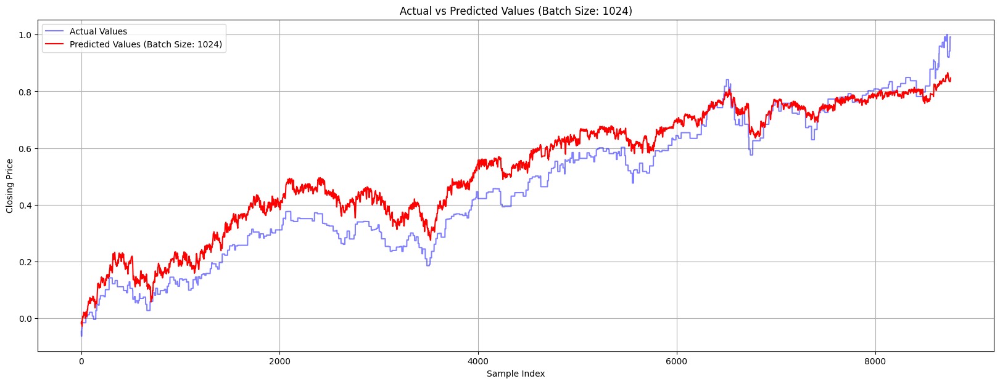

In [30]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

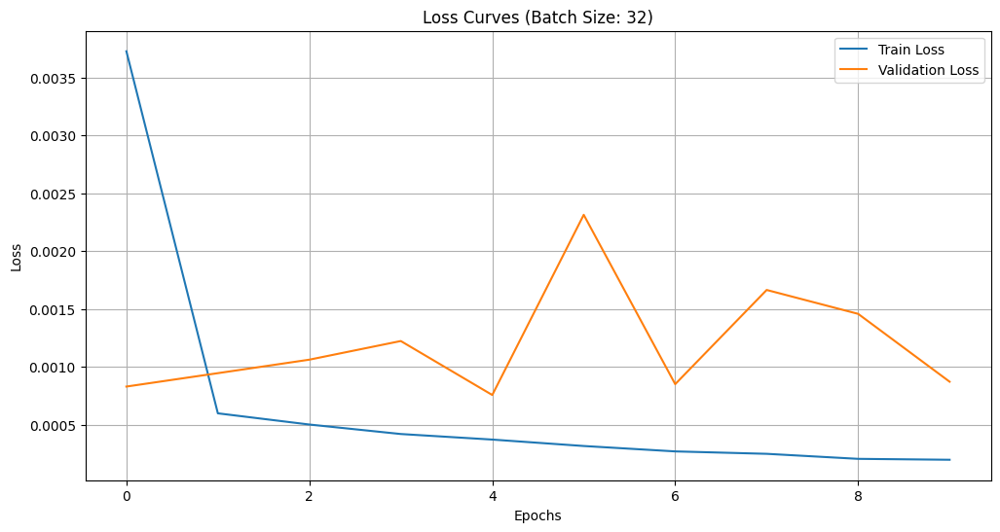

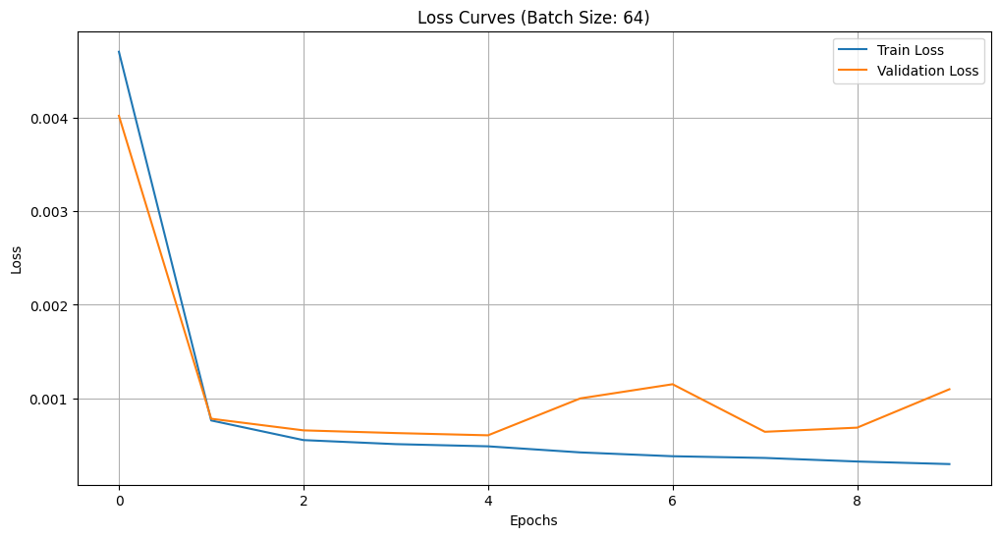

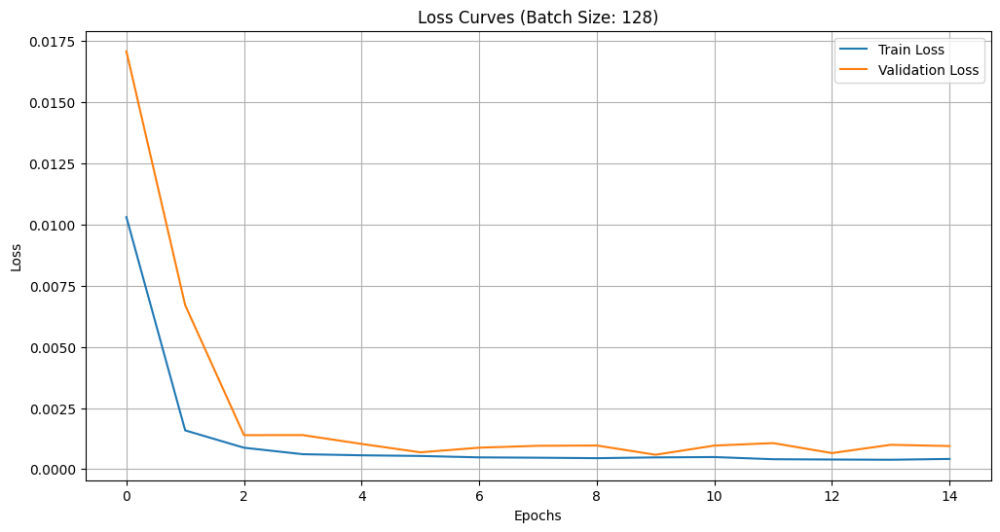

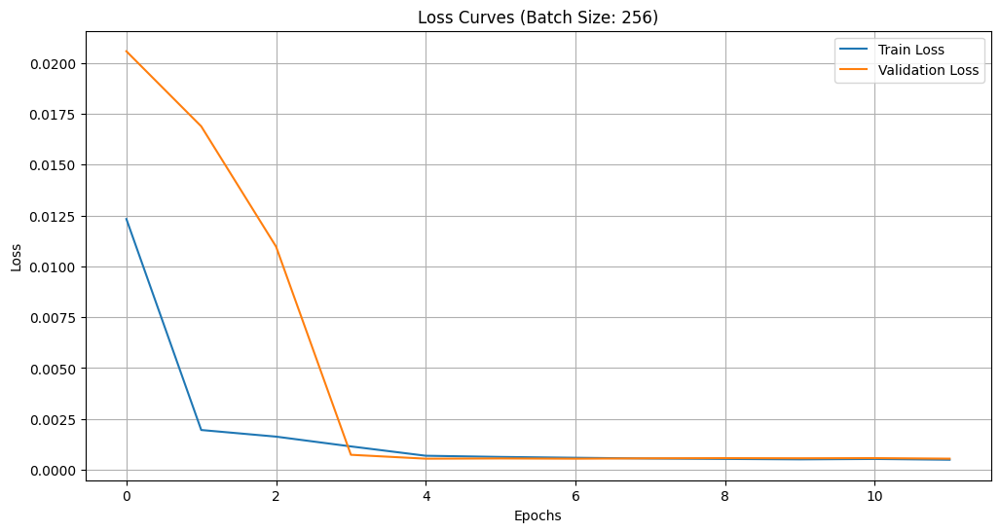

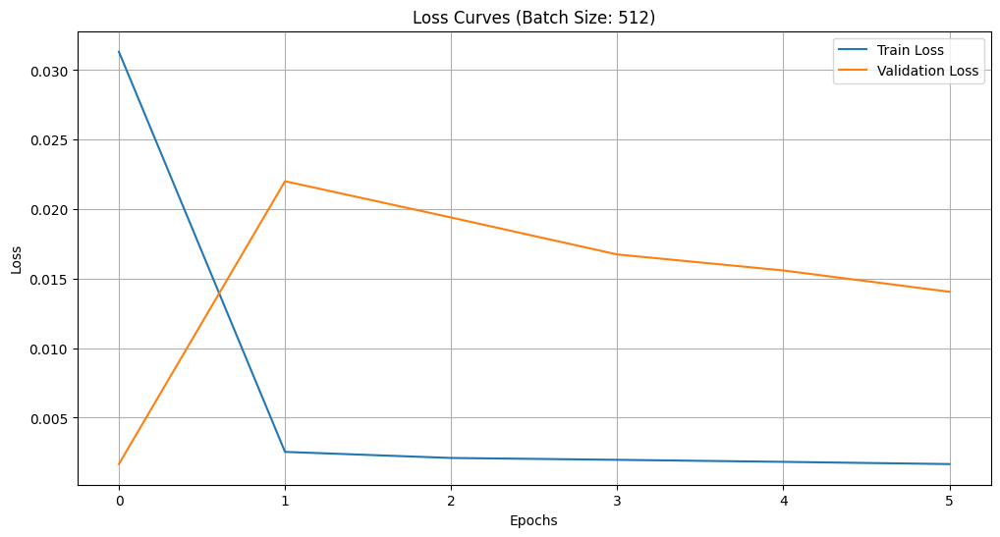

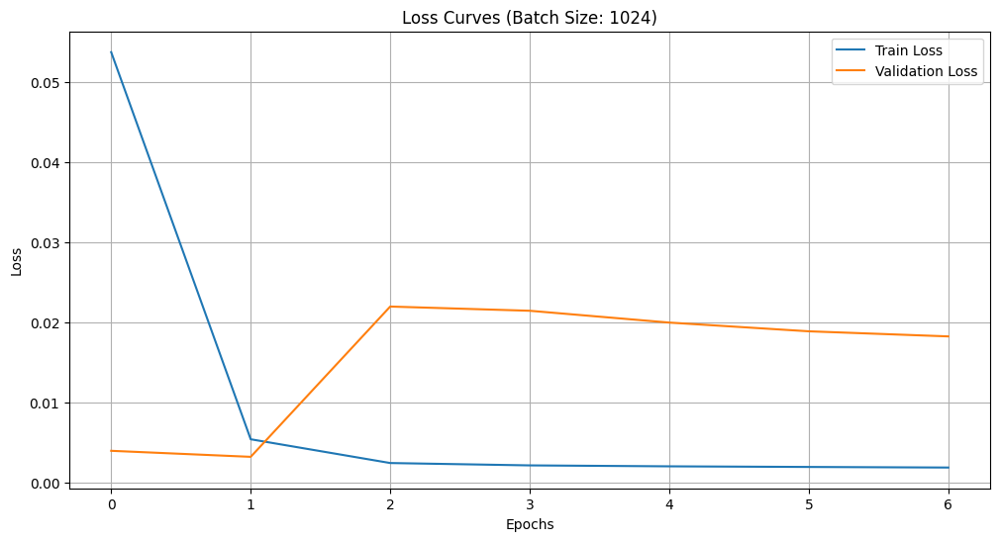

In [31]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : past_day_close + VADER + RoBERTa

In [32]:
from sklearn.model_selection import train_test_split

past_sentiment = ['past_day_close', 'vader_sentiment', 'roberta_sentiment']

X, y = create_dataset(df[past_sentiment].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [33]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step
Batch Size: 32, MSE: 0.015, RMSE: 0.122, R-squared: 0.752
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
Batch Size: 64, MSE: 0.019, RMSE: 0.136, R-squared: 0.691
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
Batch Size: 128, MSE: 0.018, RMSE: 0.133, R-squared: 0.706
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
Batch Size: 256, MSE: 0.017, RMSE: 0.132, R-squared: 0.711
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
Batch Size: 512, MSE: 0.012, RMSE: 0.110, R-squared: 0.799
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
Batch Size: 1024, MSE: 0.013, RMSE: 0.115, R-squared: 0.781


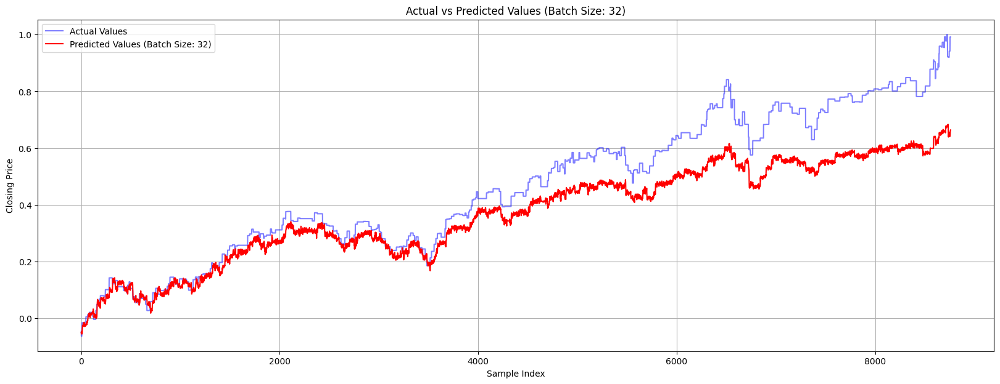

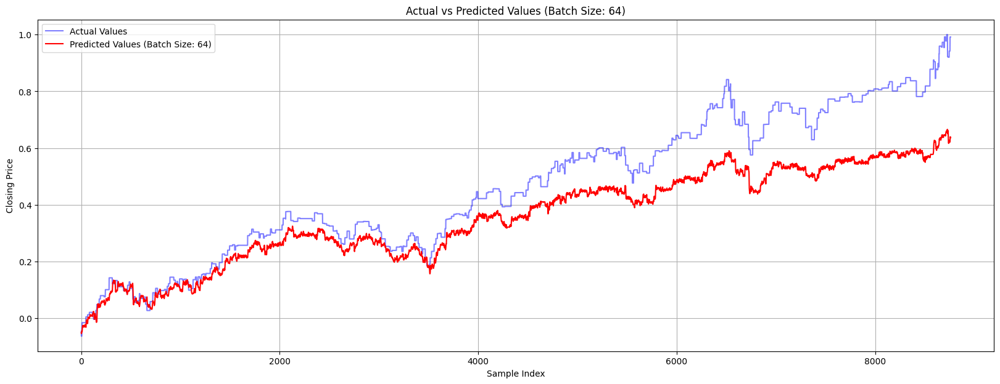

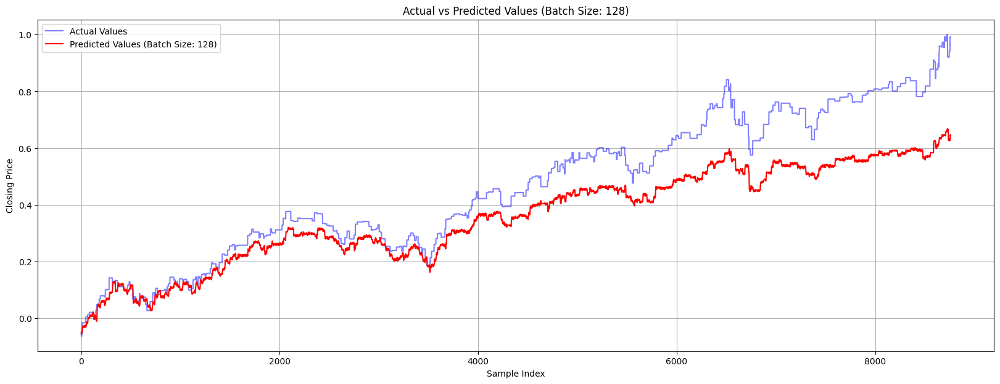

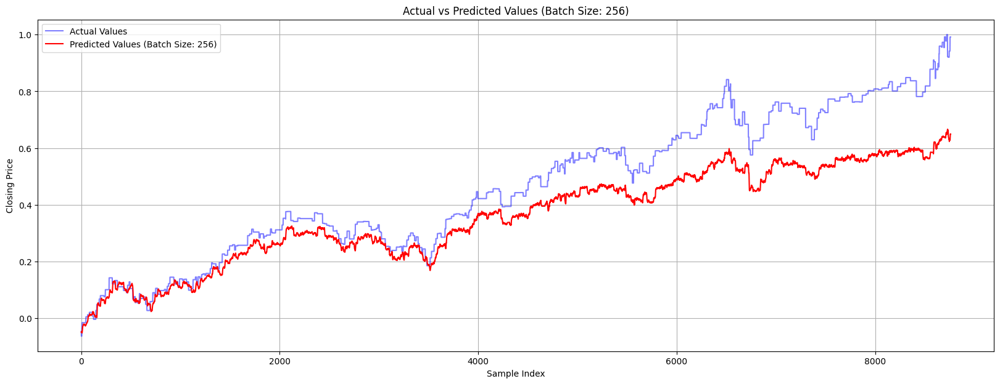

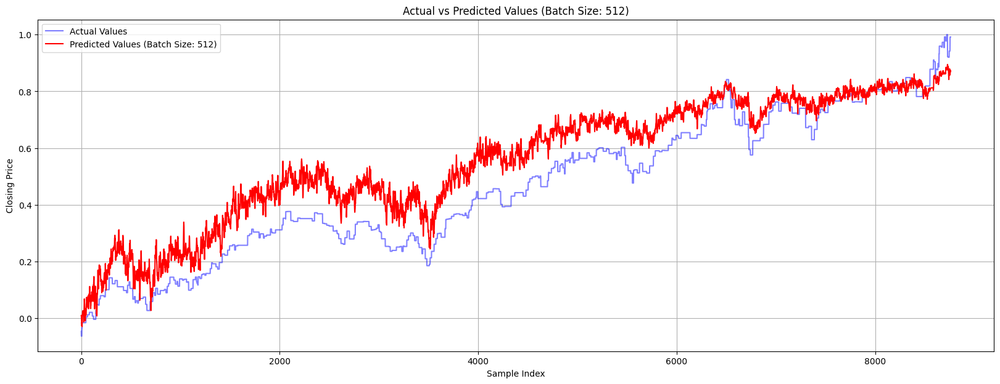

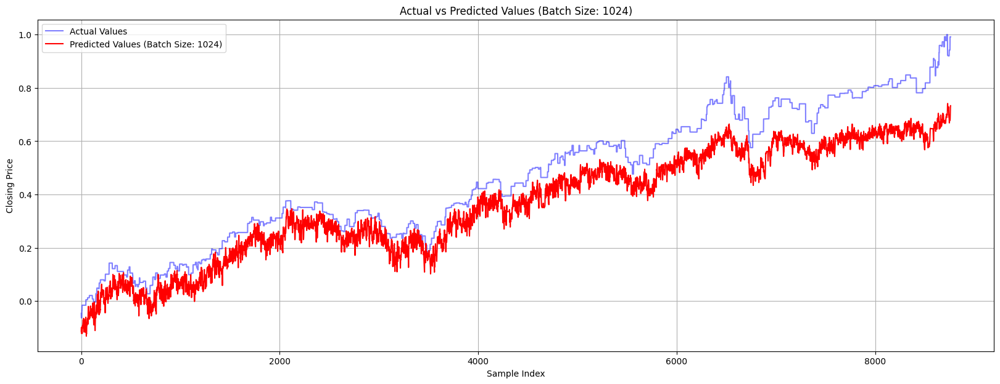

In [34]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

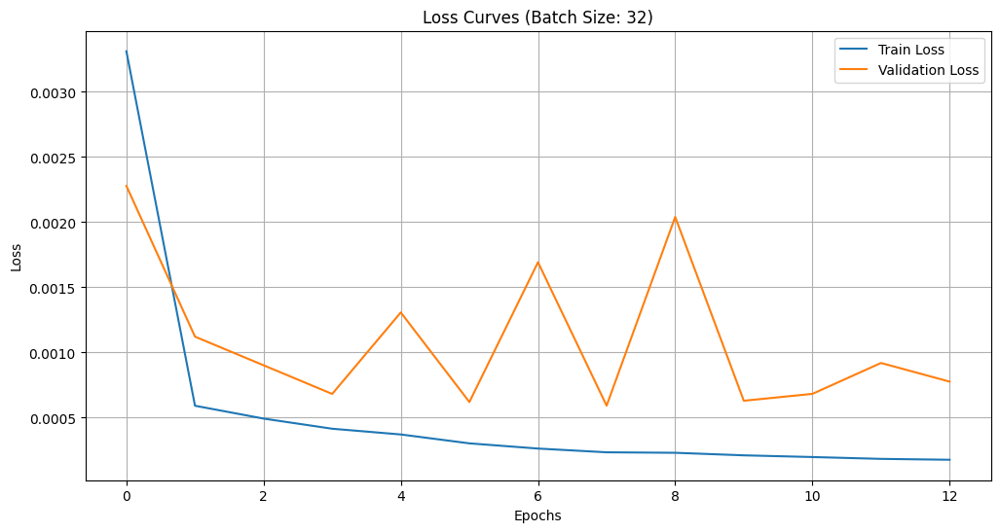

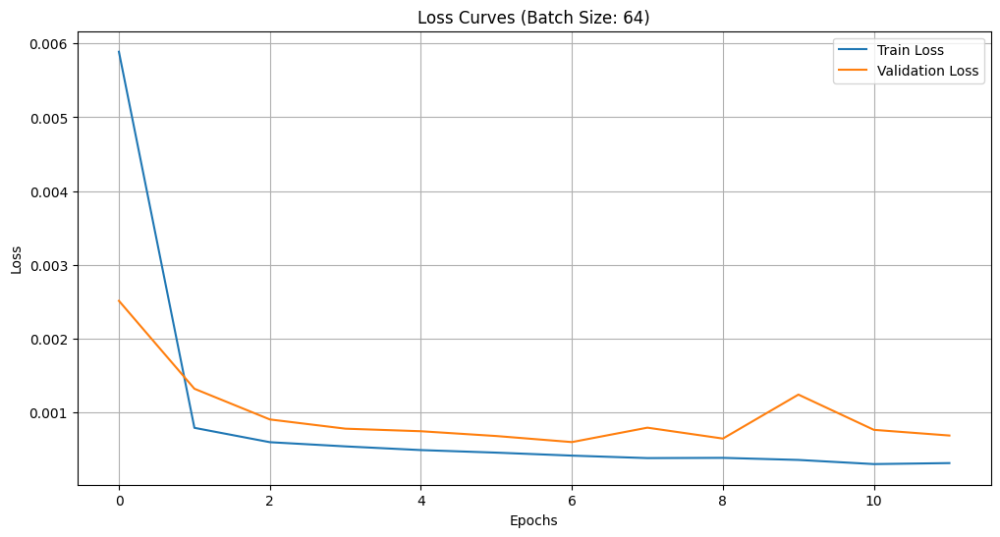

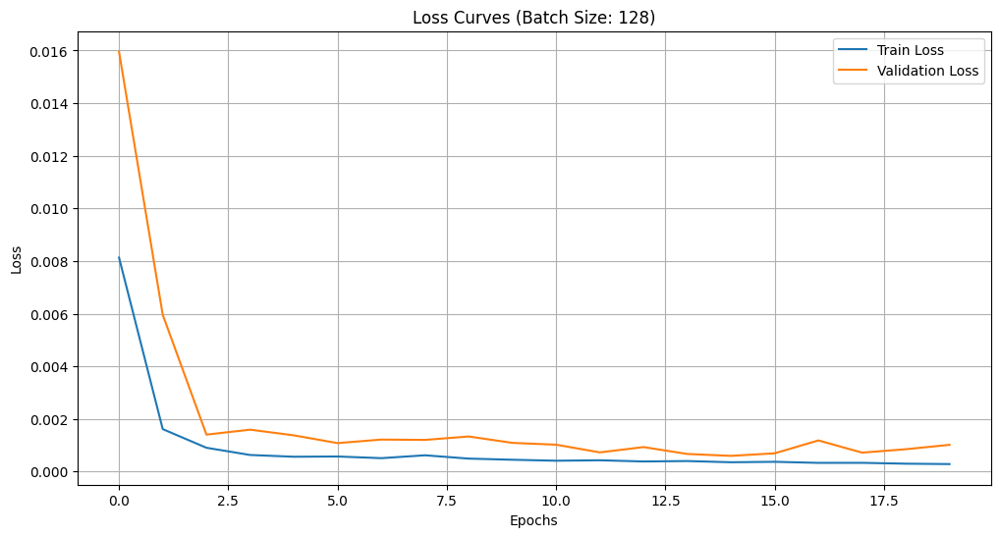

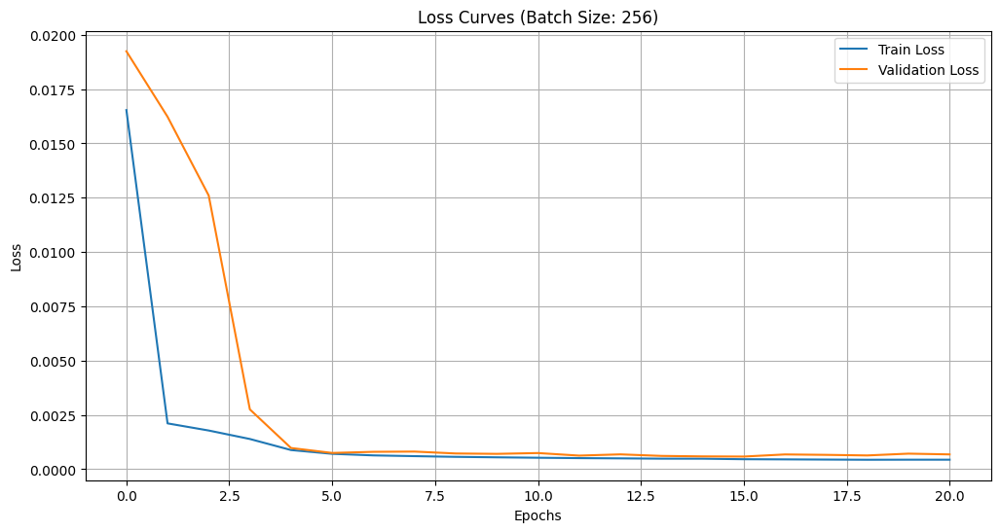

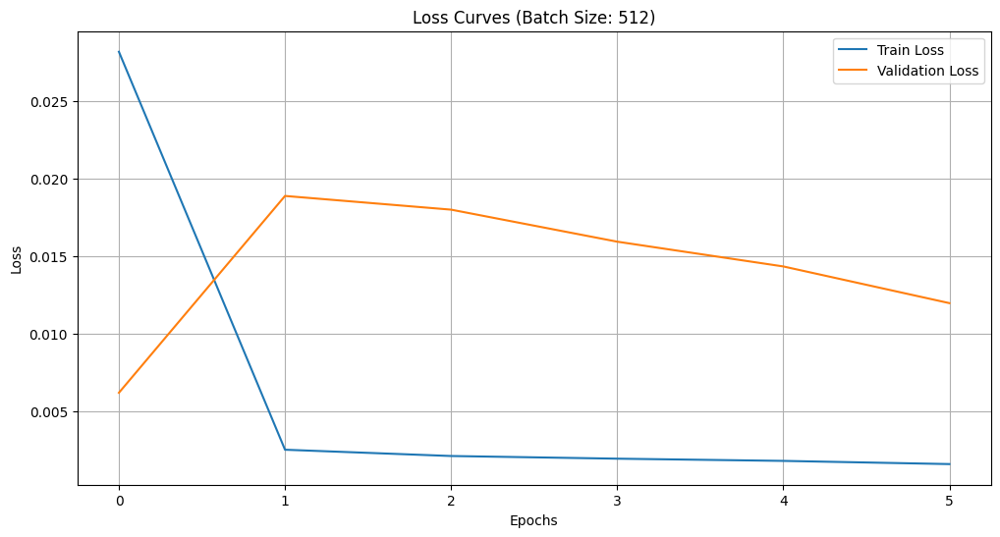

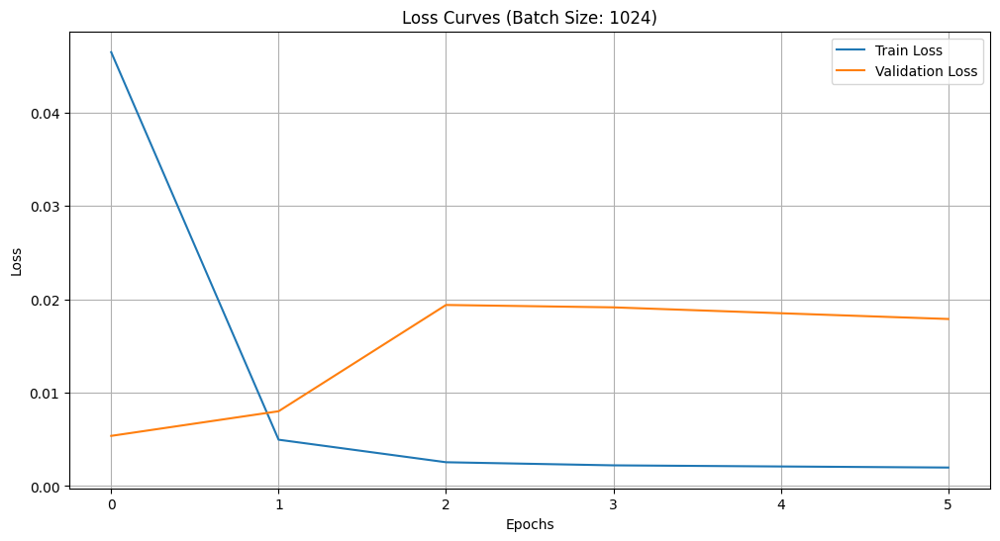

In [35]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : Open + High + Low + Volume

In [36]:
from sklearn.model_selection import train_test_split

nasdaq = ['Open', 'High', 'Low', 'Volume']

X, y = create_dataset(df[nasdaq].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [37]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
Batch Size: 32, MSE: 0.014, RMSE: 0.119, R-squared: 0.764
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
Batch Size: 64, MSE: 0.020, RMSE: 0.140, R-squared: 0.675
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
Batch Size: 128, MSE: 0.017, RMSE: 0.130, R-squared: 0.720
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
Batch Size: 256, MSE: 0.017, RMSE: 0.129, R-squared: 0.726
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
Batch Size: 512, MSE: 0.019, RMSE: 0.137, R-squared: 0.687
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
Batch Size: 1024, MSE: 0.002, RMSE: 0.046, R-squared: 0.964


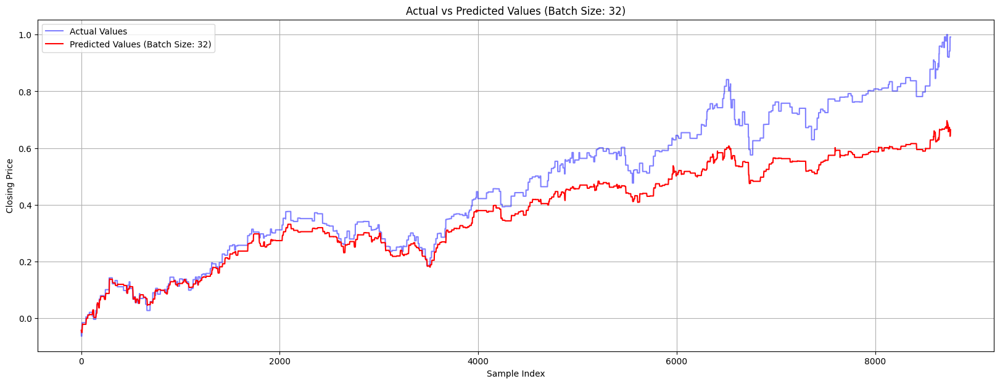

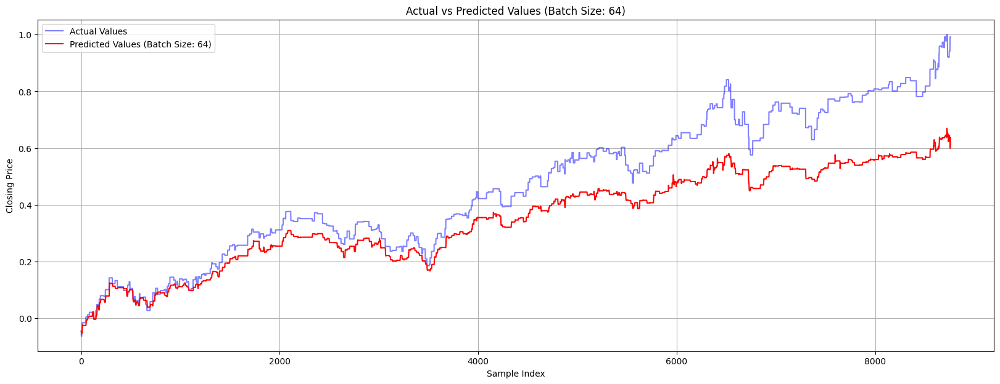

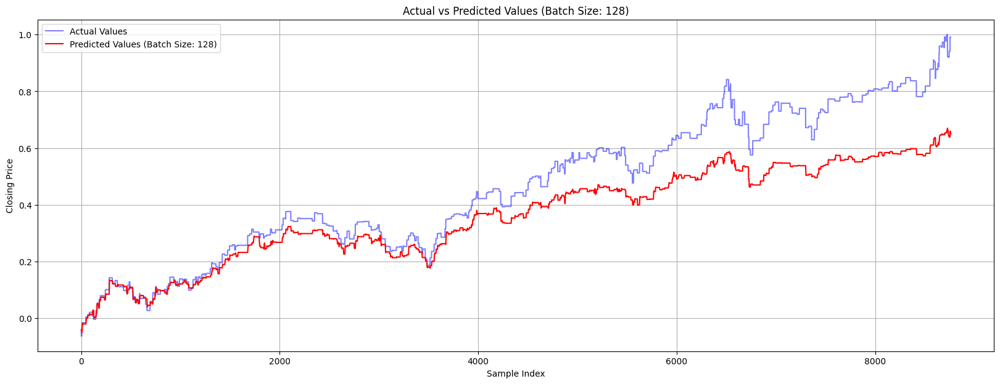

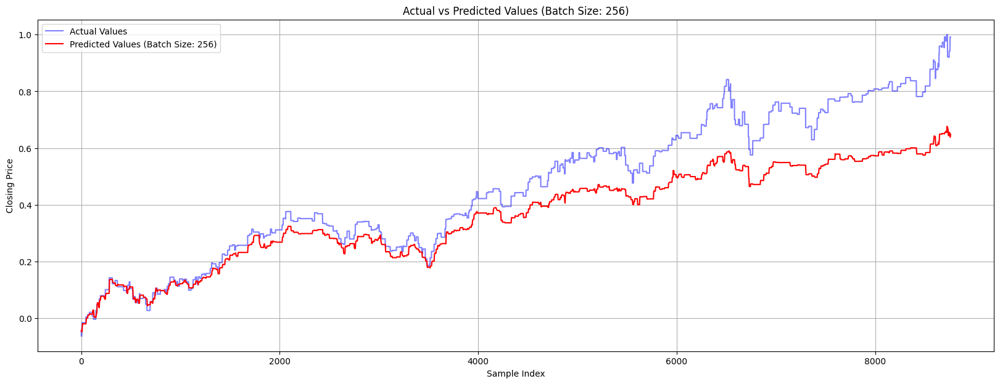

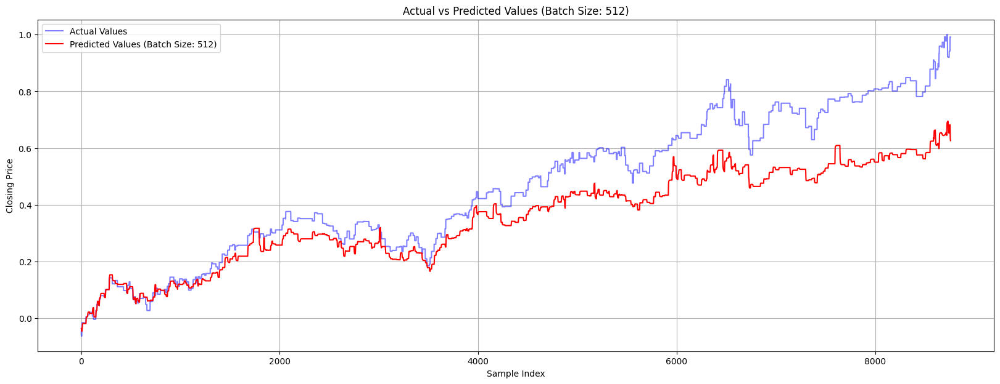

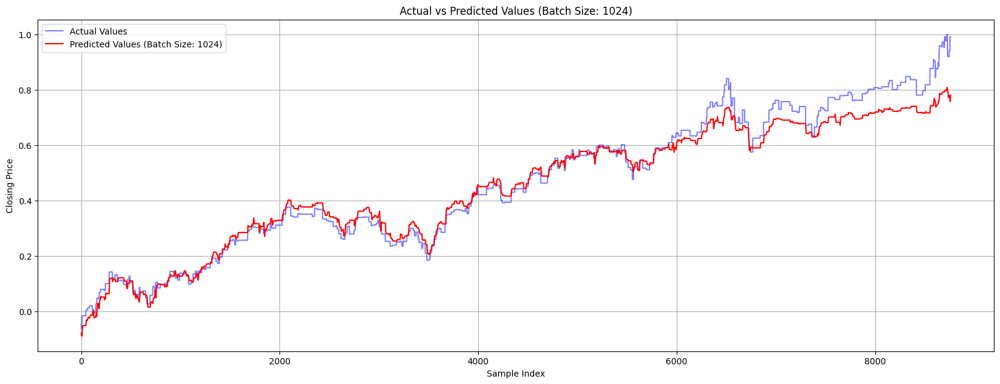

In [38]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

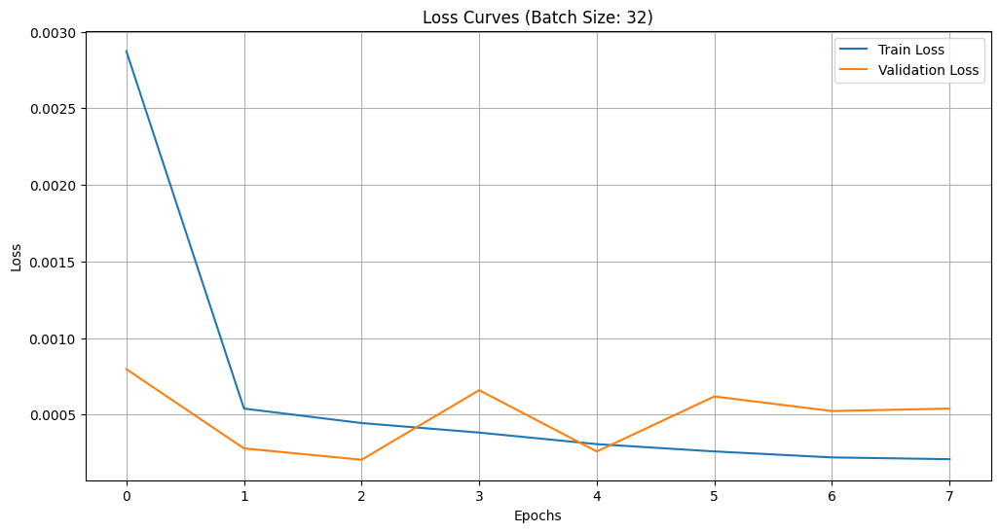

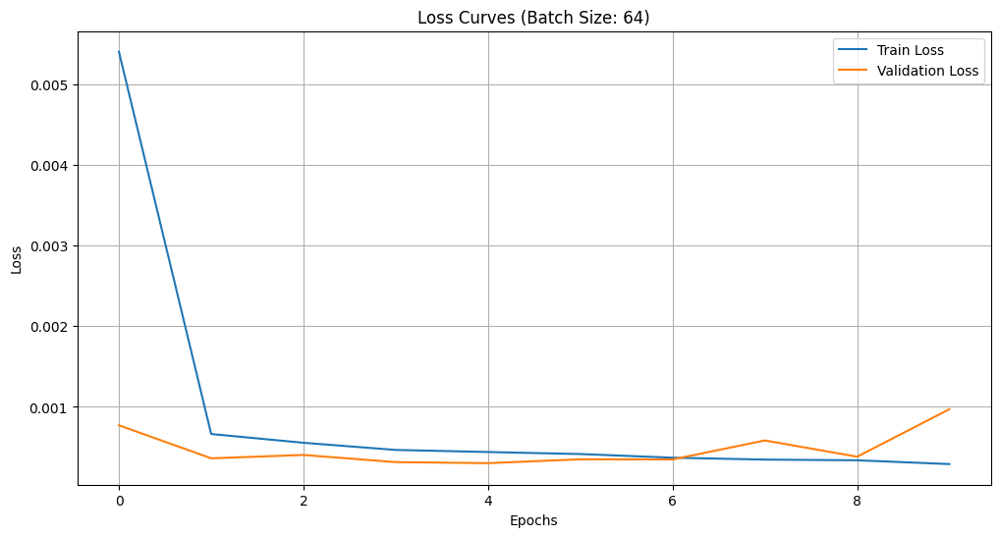

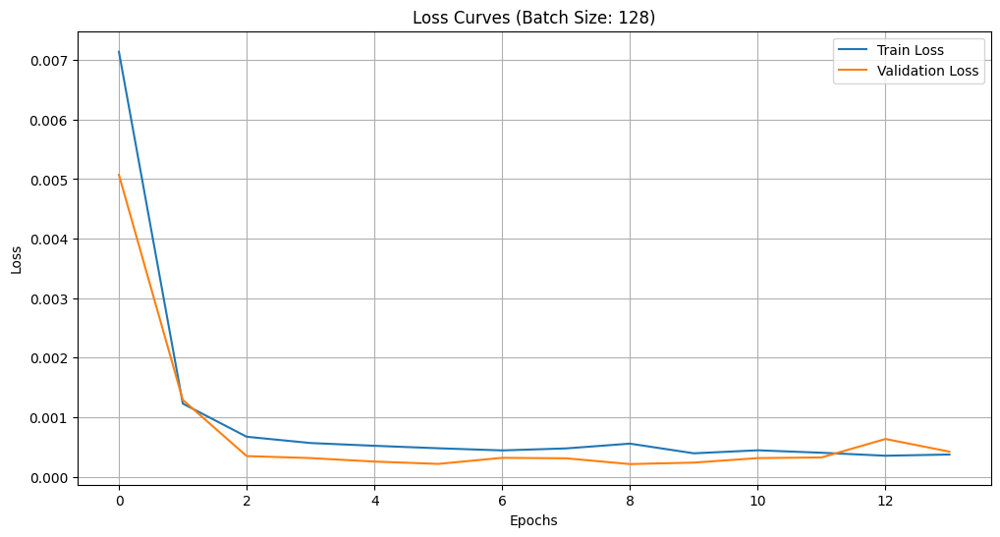

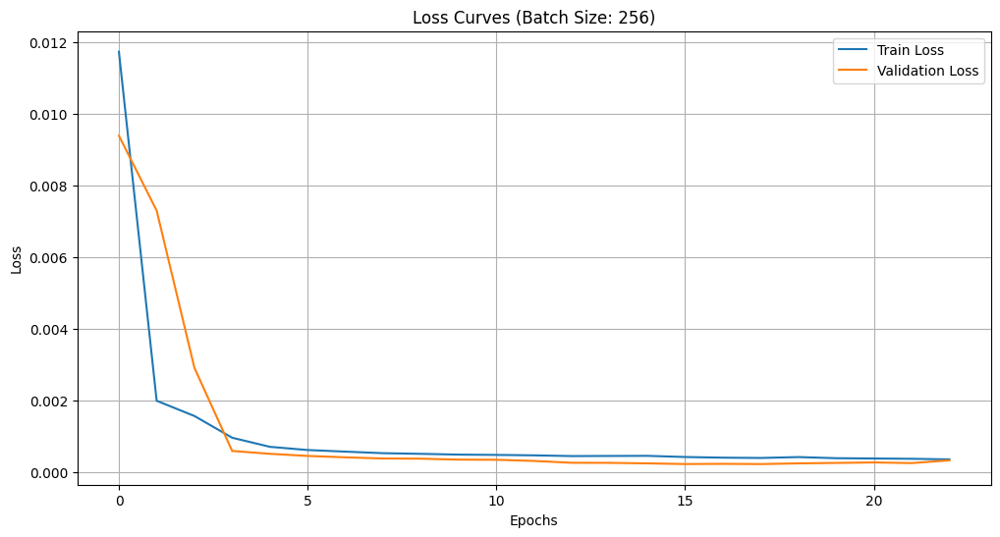

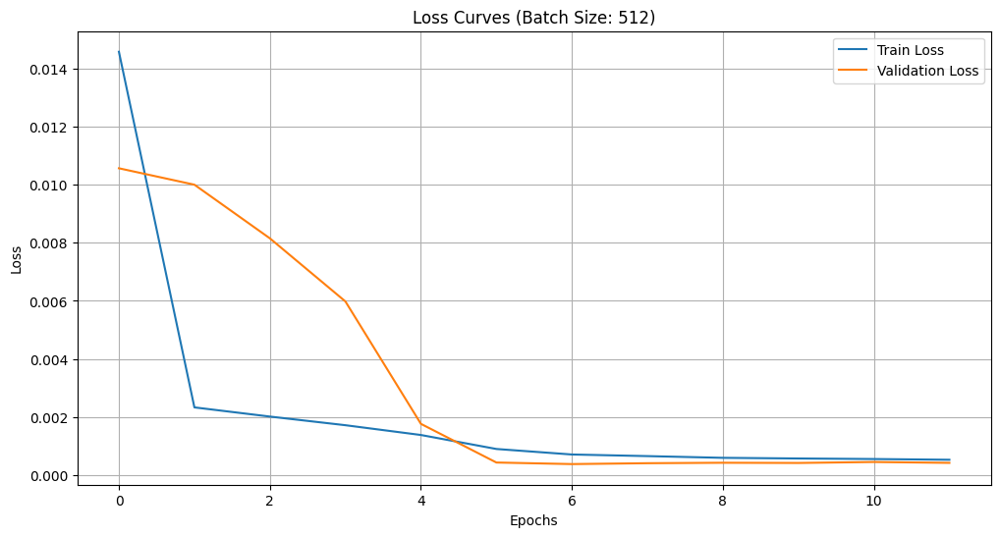

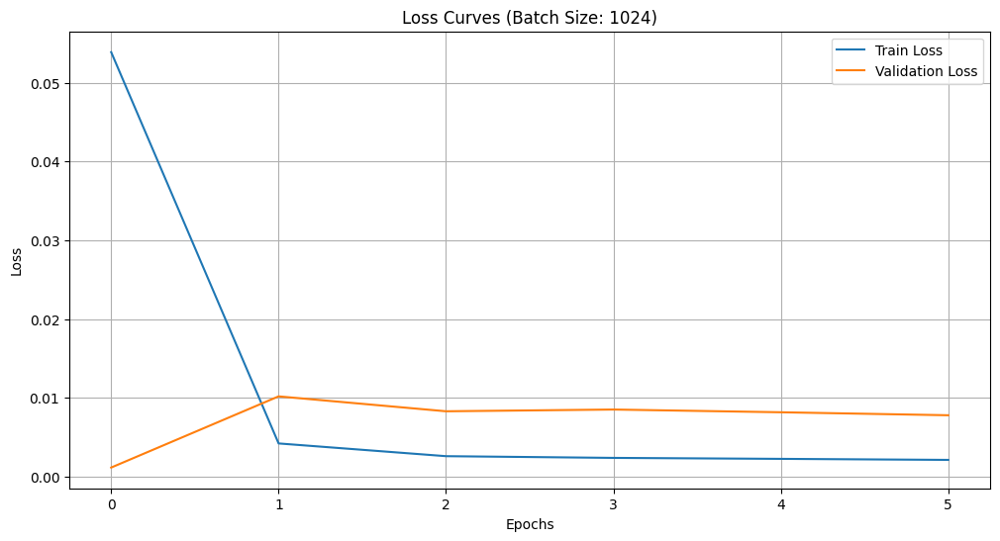

In [39]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : Open + High + Low + Volume + past_day_close

In [40]:
from sklearn.model_selection import train_test_split

past_nasdaq = ['Open', 'High', 'Low', 'Volume', 'past_day_close']

X, y = create_dataset(df[past_nasdaq].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [41]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
Batch Size: 32, MSE: 0.014, RMSE: 0.119, R-squared: 0.763
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
Batch Size: 64, MSE: 0.018, RMSE: 0.135, R-squared: 0.699
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
Batch Size: 128, MSE: 0.016, RMSE: 0.128, R-squared: 0.727
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Batch Size: 256, MSE: 0.016, RMSE: 0.127, R-squared: 0.733
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
Batch Size: 512, MSE: 0.016, RMSE: 0.126, R-squared: 0.738
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
Batch Size: 1024, MSE: 0.003, RMSE: 0.055, R-squared: 0.949


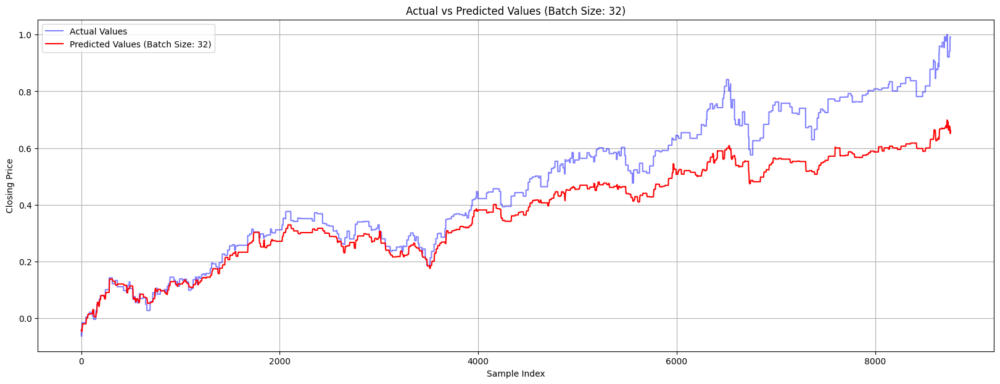

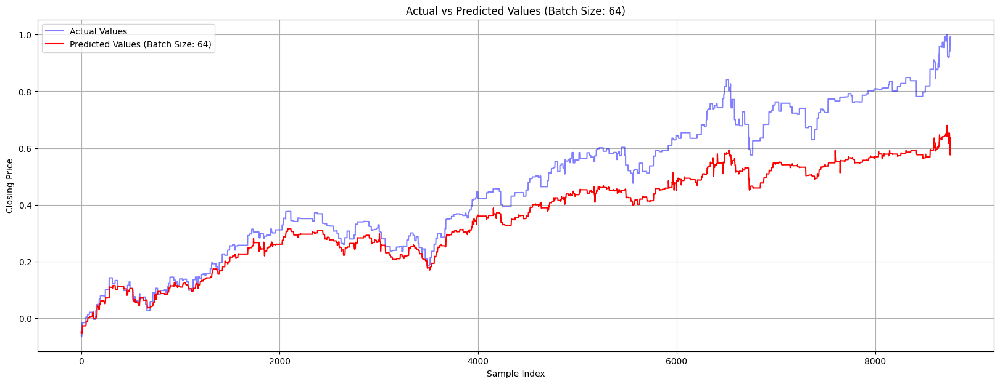

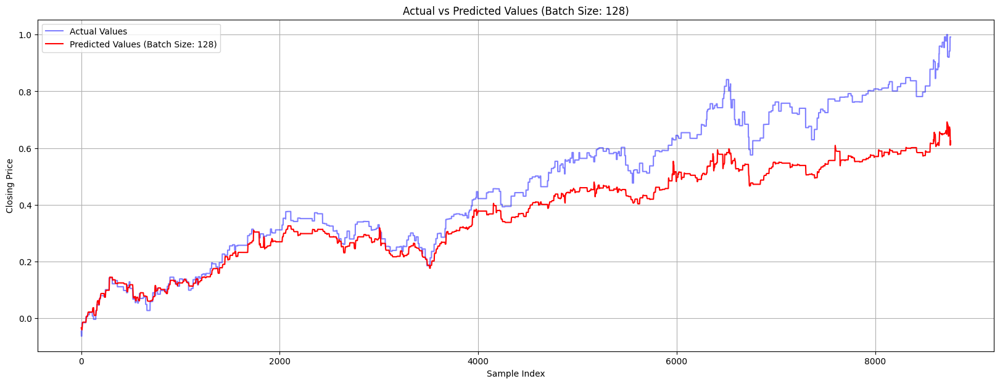

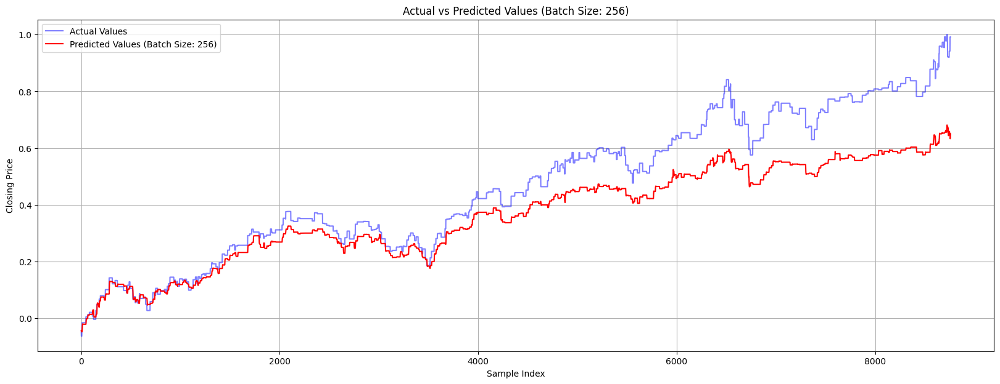

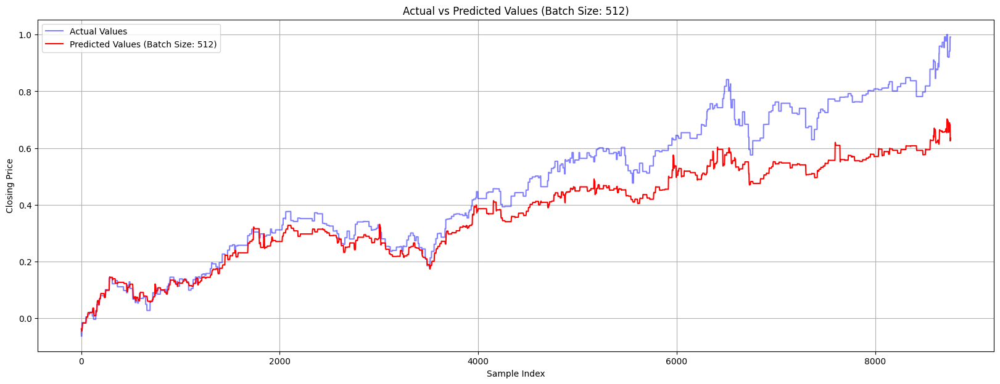

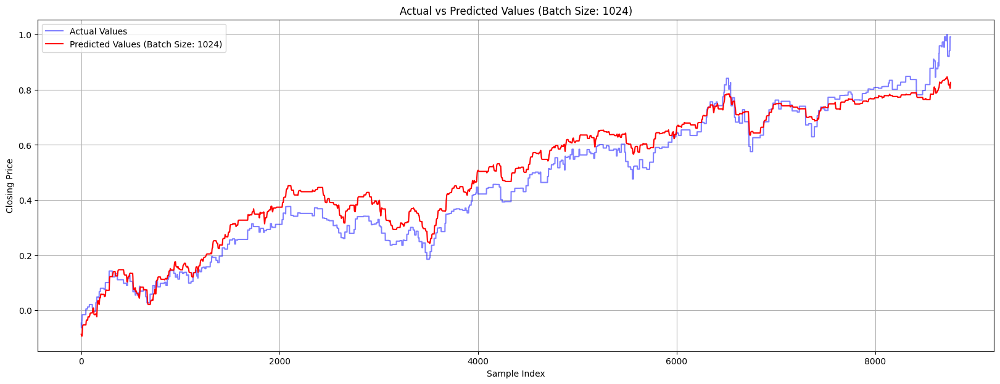

In [42]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

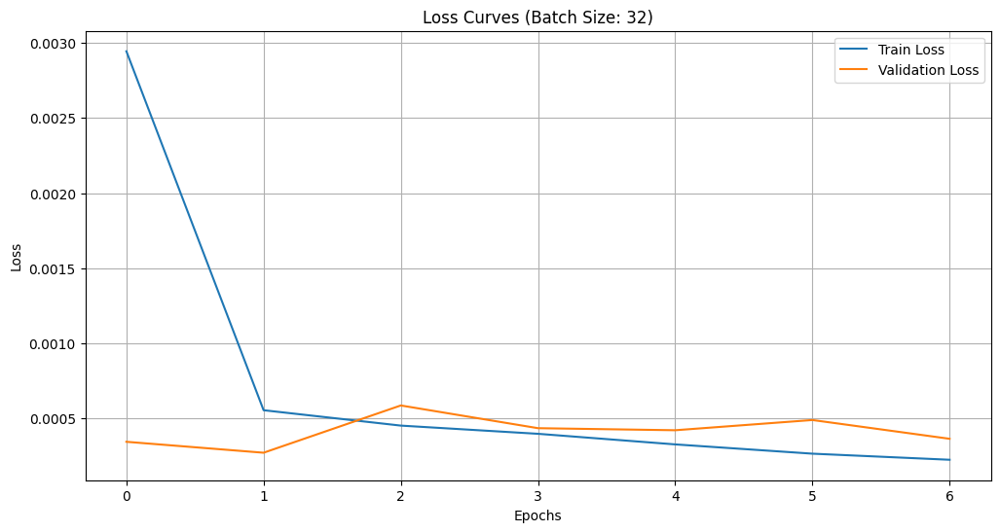

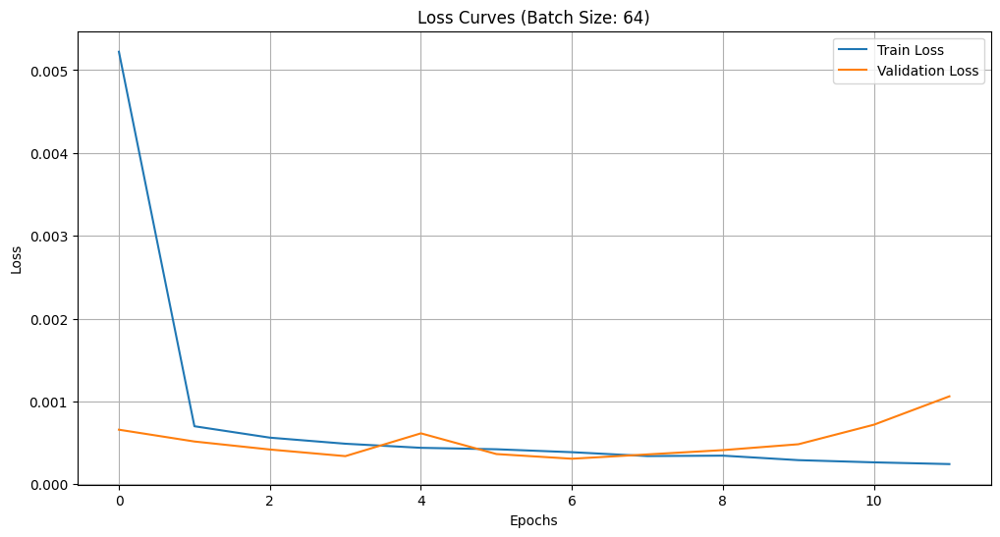

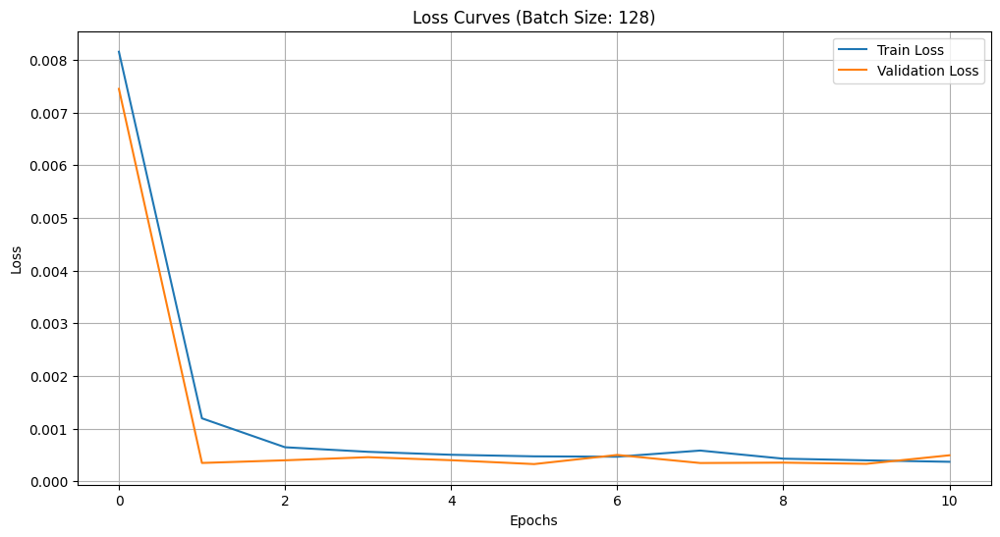

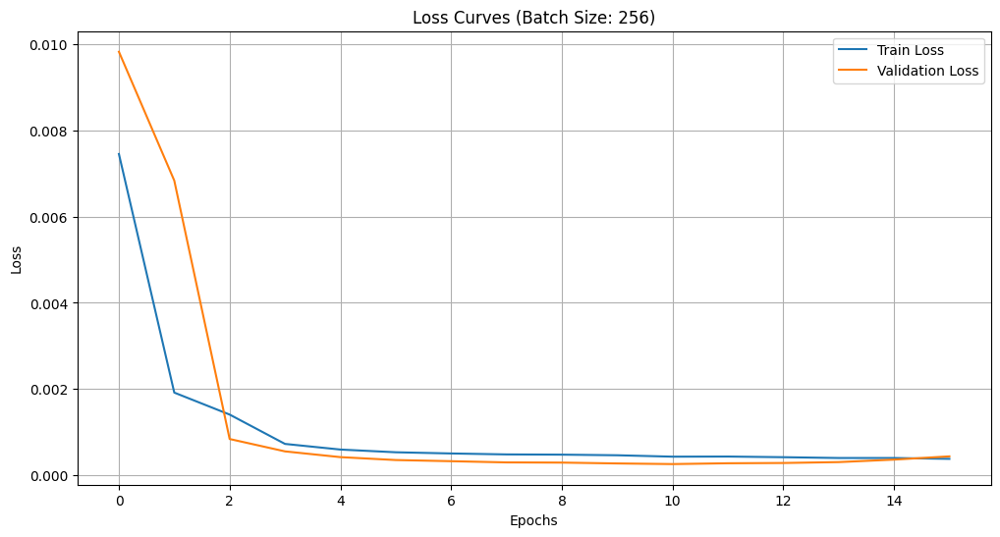

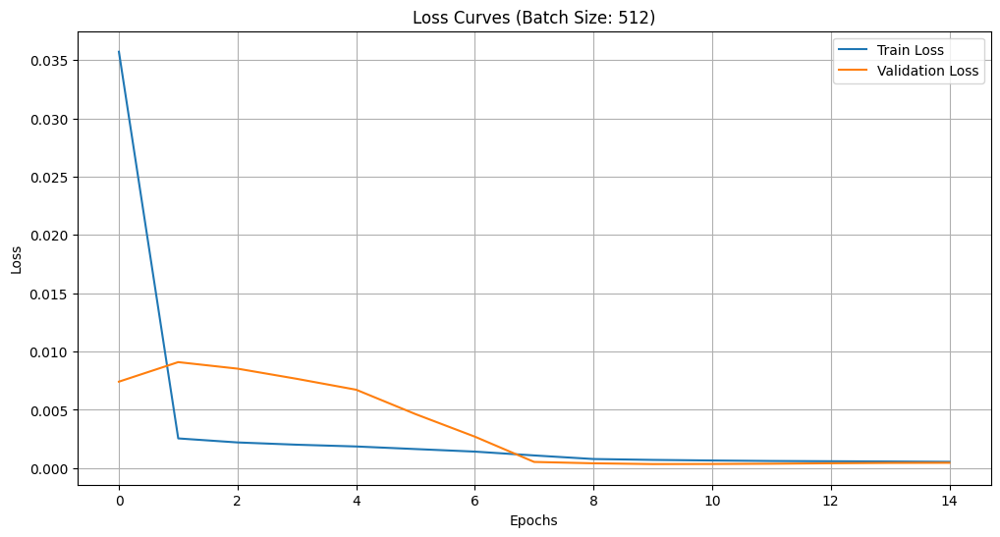

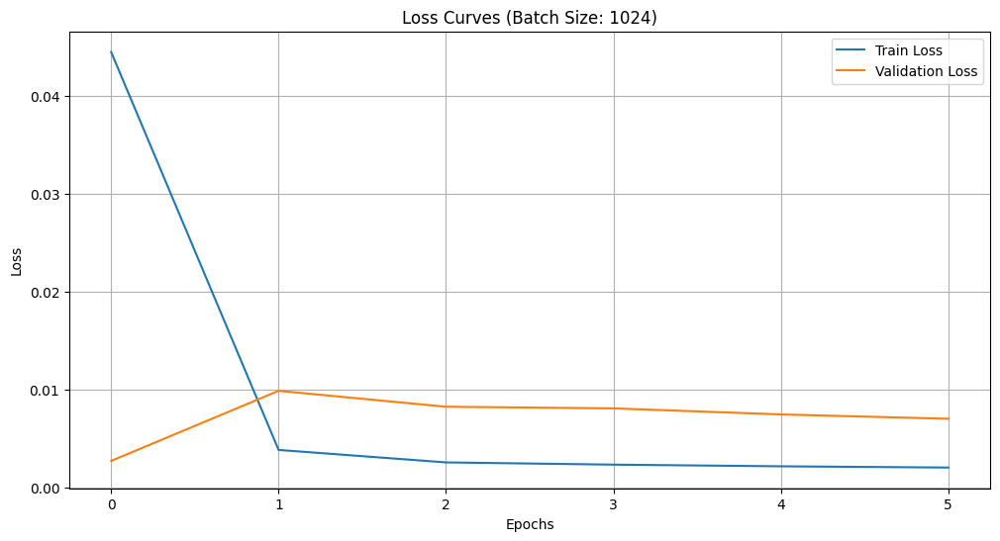

In [43]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : Open + High + Low + Volume + past_day_close + VADER

In [44]:
from sklearn.model_selection import train_test_split

past_nasdaq_vader = ['Open', 'High', 'Low', 'Volume', 'past_day_close', 'vader_sentiment']

X, y = create_dataset(df[past_nasdaq_vader].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [45]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
Batch Size: 32, MSE: 0.016, RMSE: 0.126, R-squared: 0.736
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Batch Size: 64, MSE: 0.018, RMSE: 0.135, R-squared: 0.698
274/274 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step
Batch Size: 128, MSE: 0.013, RMSE: 0.116, R-squared: 0.777
274/274 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step
Batch Size: 256, MSE: 0.017, RMSE: 0.129, R-squared: 0.723
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step
Batch Size: 512, MSE: 0.015, RMSE: 0.123, R-squared: 0.750
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step
Batch Size: 1024, MSE: 0.015, RMSE: 0.121, R-squared: 0.757


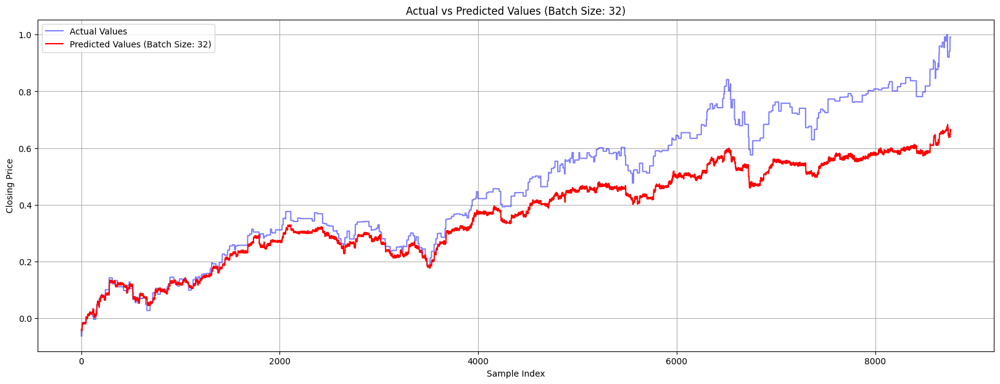

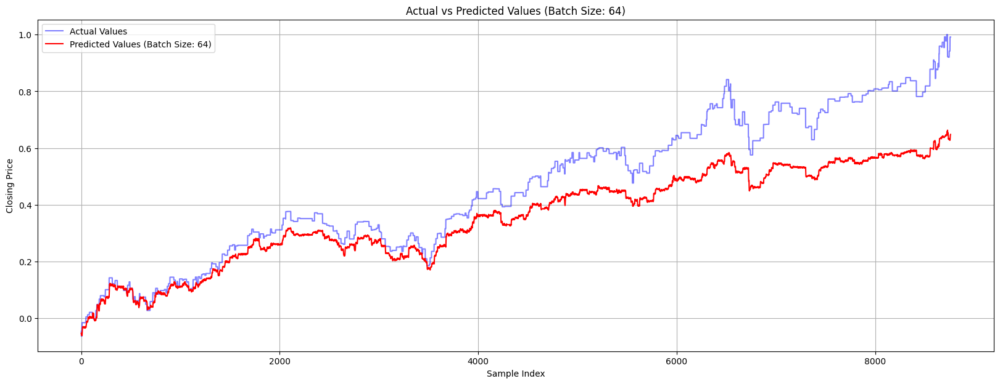

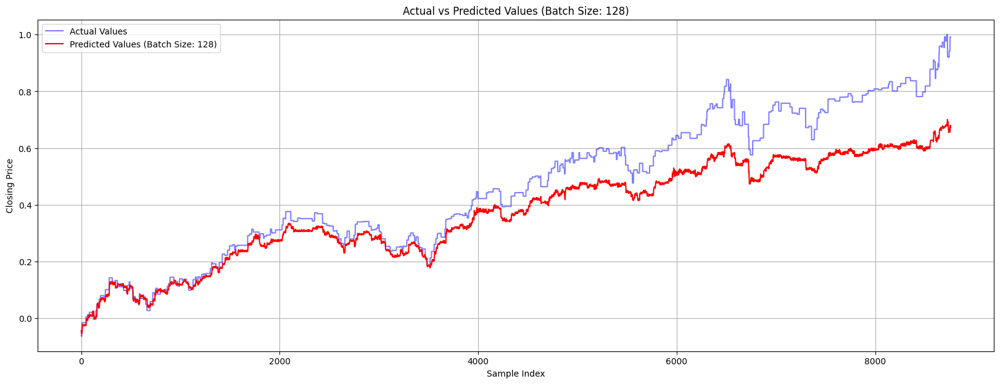

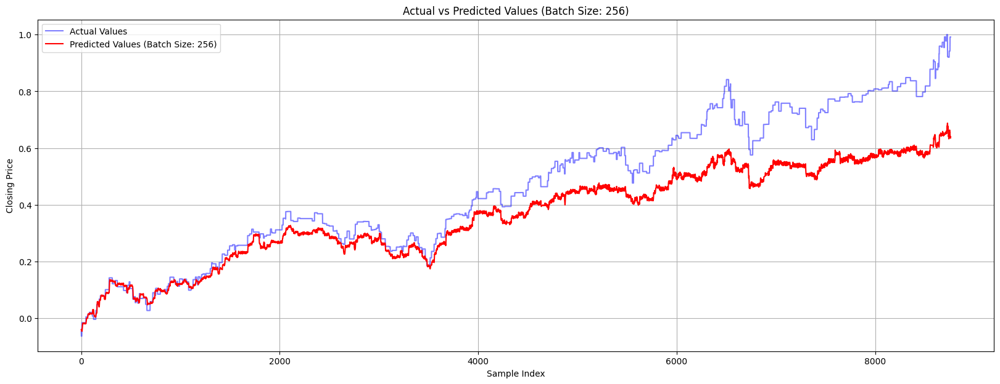

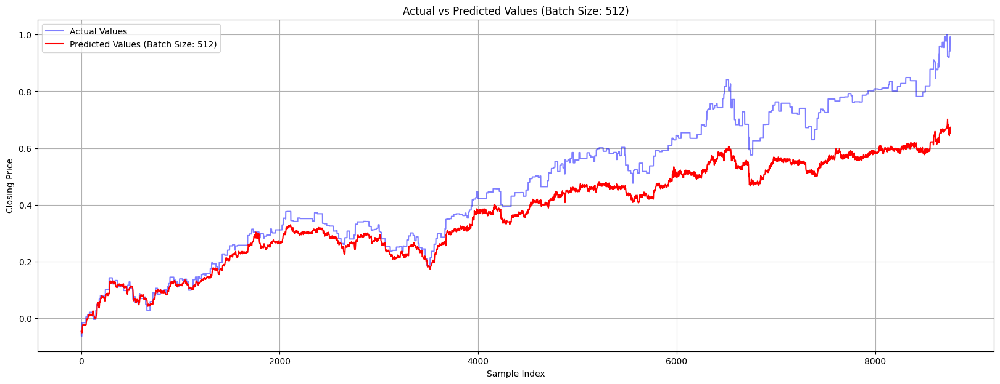

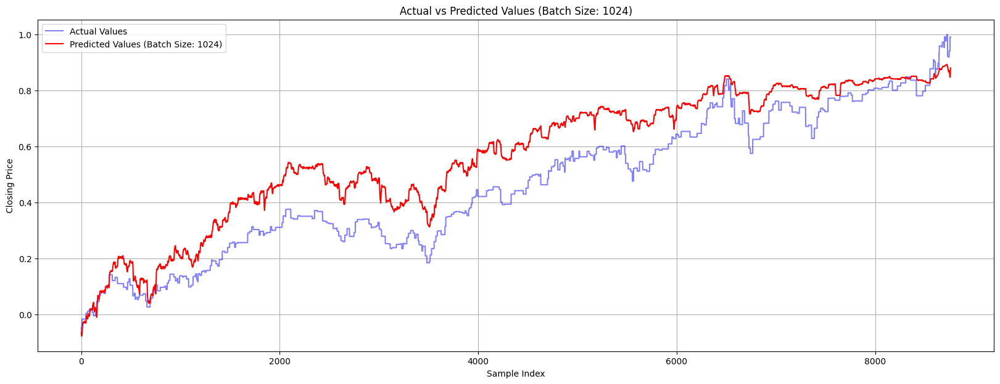

In [46]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

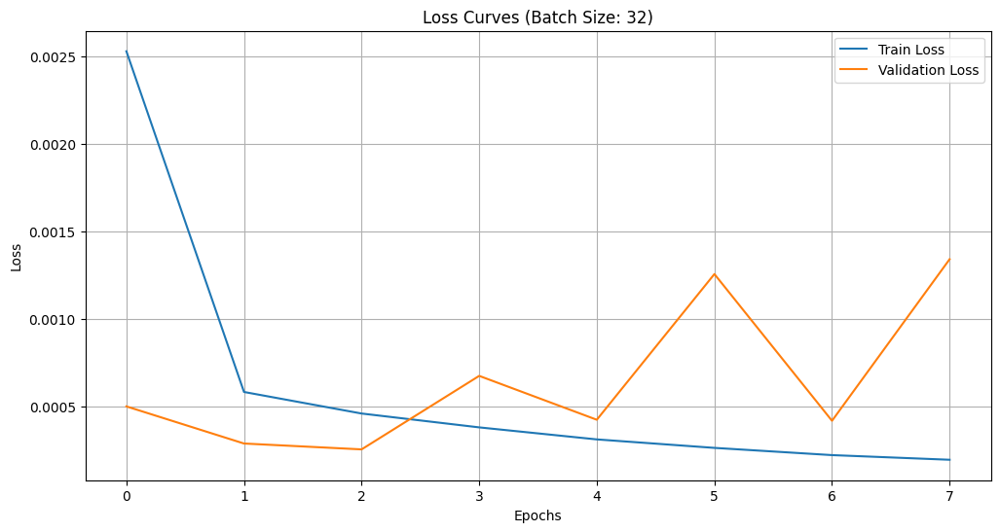

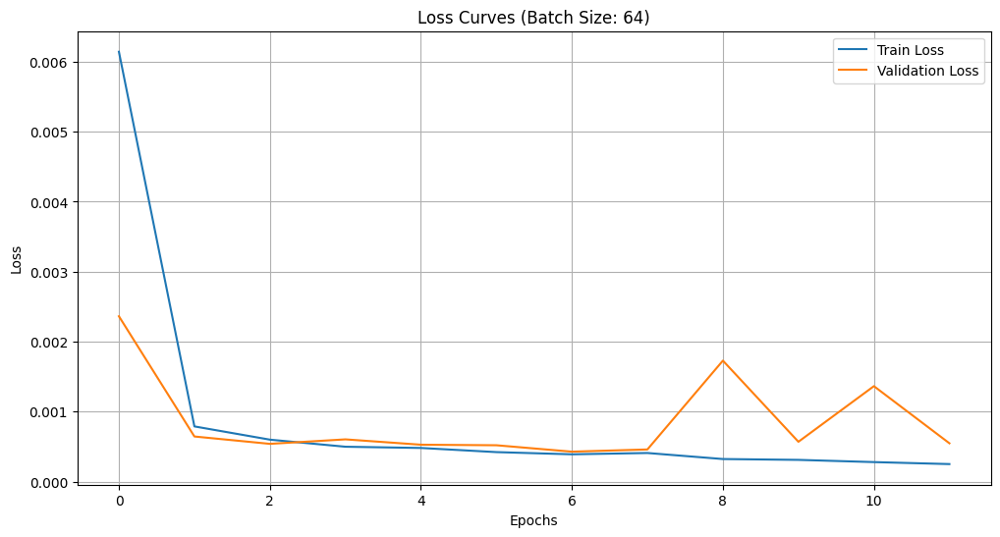

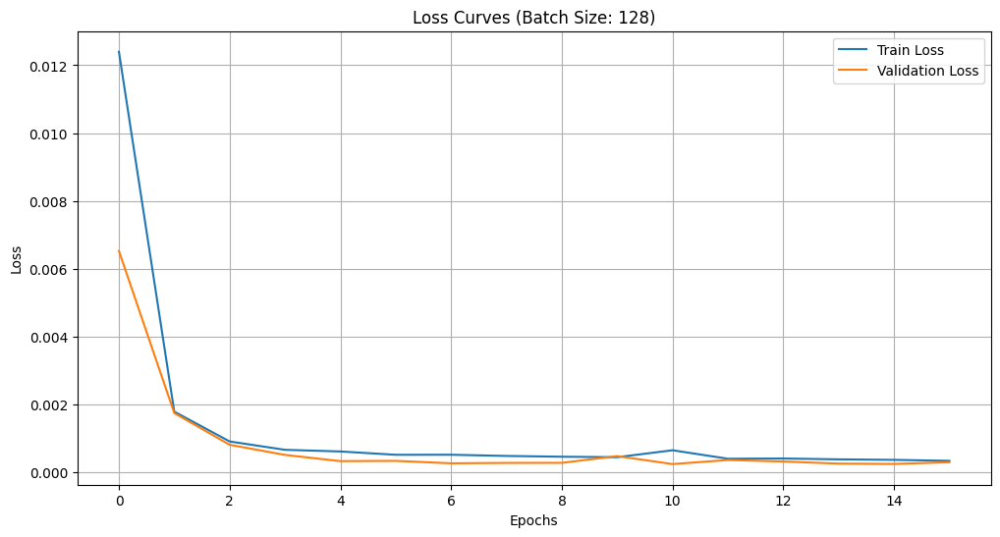

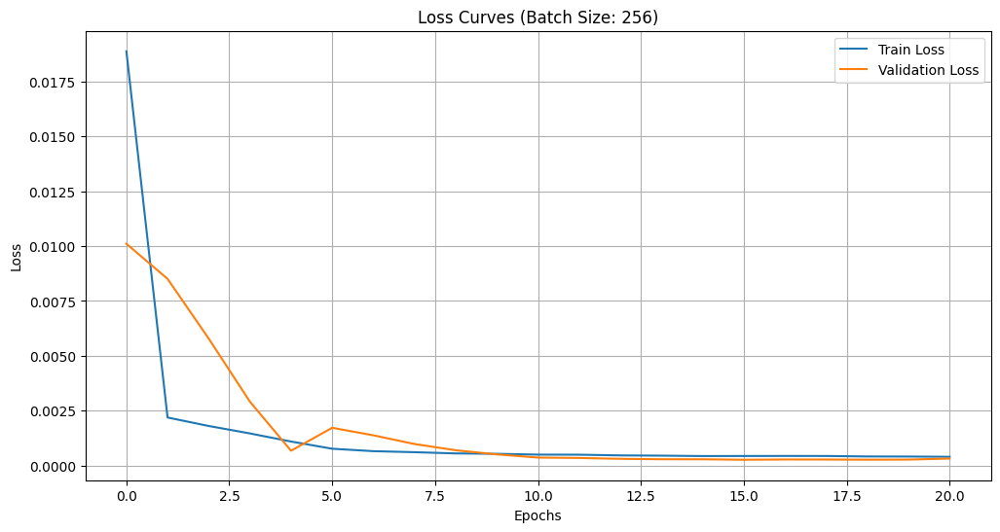

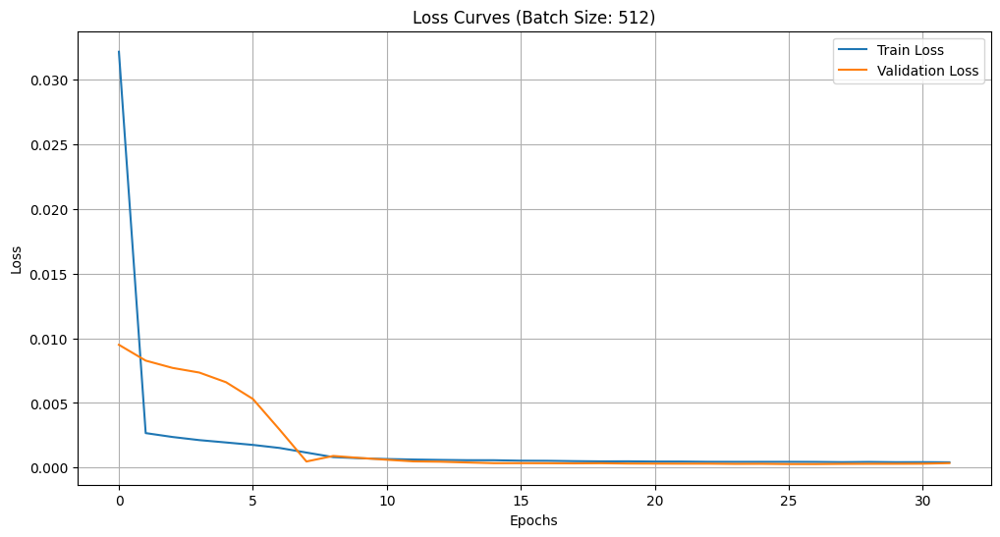

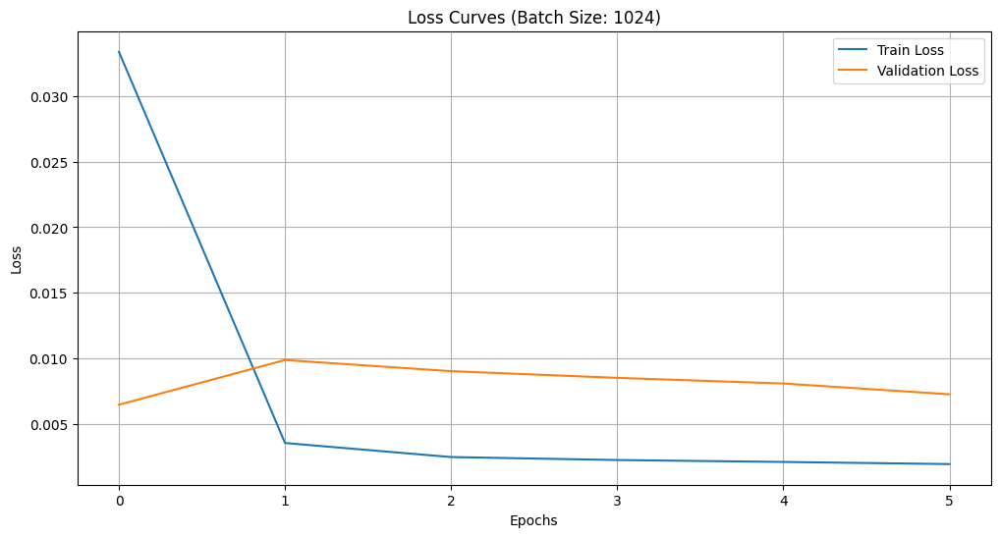

In [47]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : Open + High + Low + Volume + past_day_close + RoBERTa

In [48]:
from sklearn.model_selection import train_test_split

past_nasdaq_roberta = ['Open', 'High', 'Low', 'Volume', 'past_day_close', 'roberta_sentiment']

X, y = create_dataset(df[past_nasdaq_roberta].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [49]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step
Batch Size: 32, MSE: 0.023, RMSE: 0.151, R-squared: 0.624
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step
Batch Size: 64, MSE: 0.017, RMSE: 0.129, R-squared: 0.725
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
Batch Size: 128, MSE: 0.017, RMSE: 0.131, R-squared: 0.717
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
Batch Size: 256, MSE: 0.015, RMSE: 0.124, R-squared: 0.743
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Batch Size: 512, MSE: 0.025, RMSE: 0.157, R-squared: 0.592
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step
Batch Size: 1024, MSE: 0.004, RMSE: 0.060, R-squared: 0.941


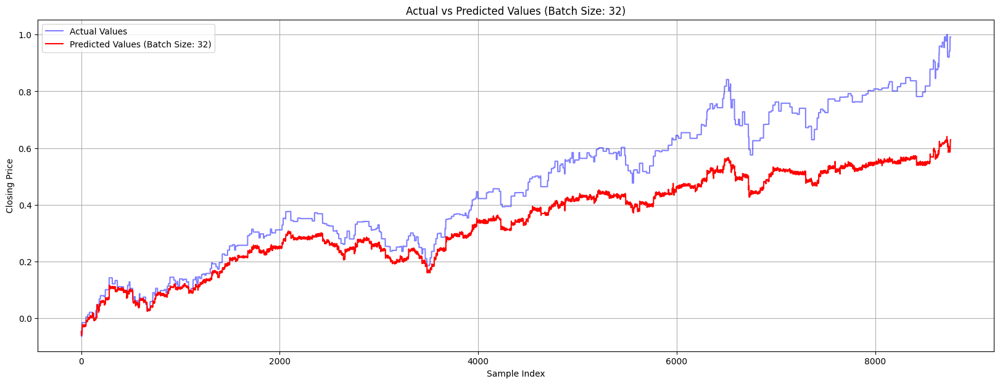

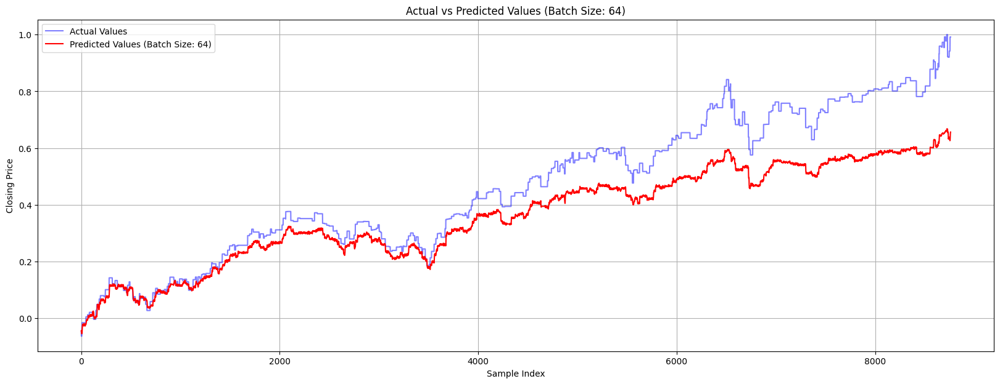

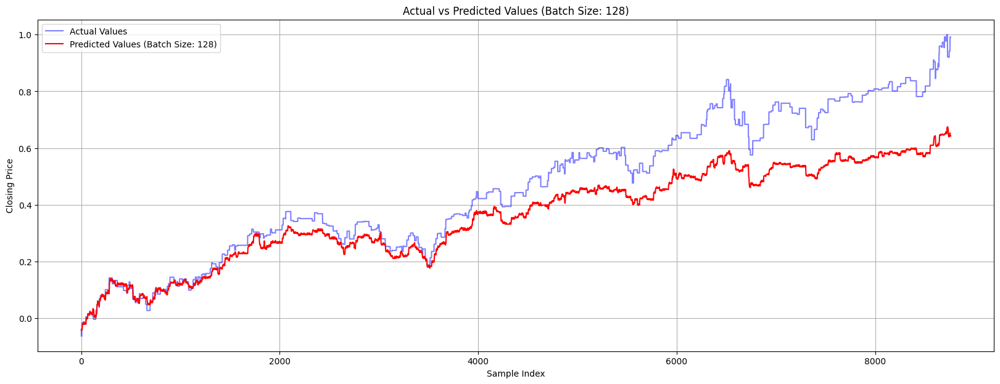

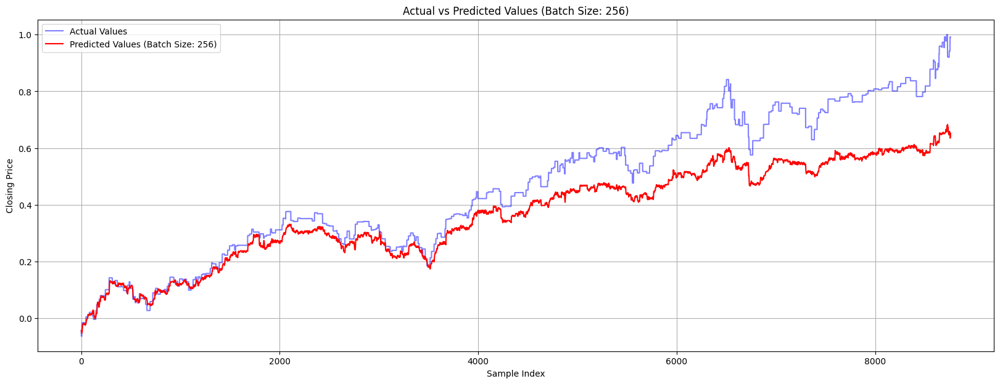

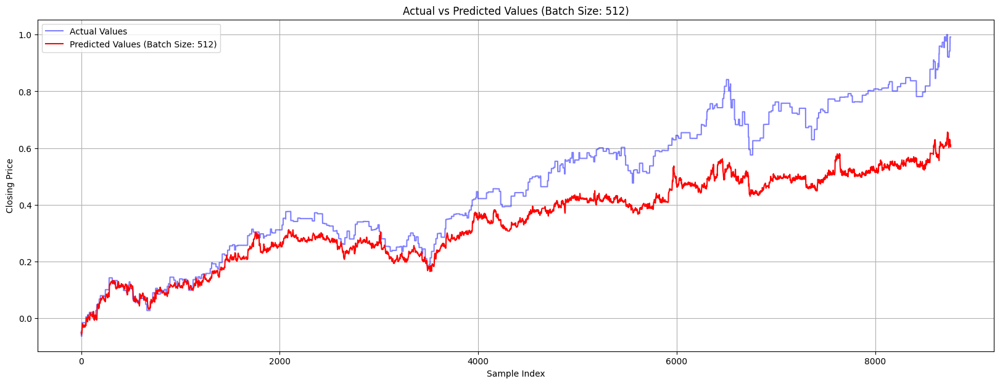

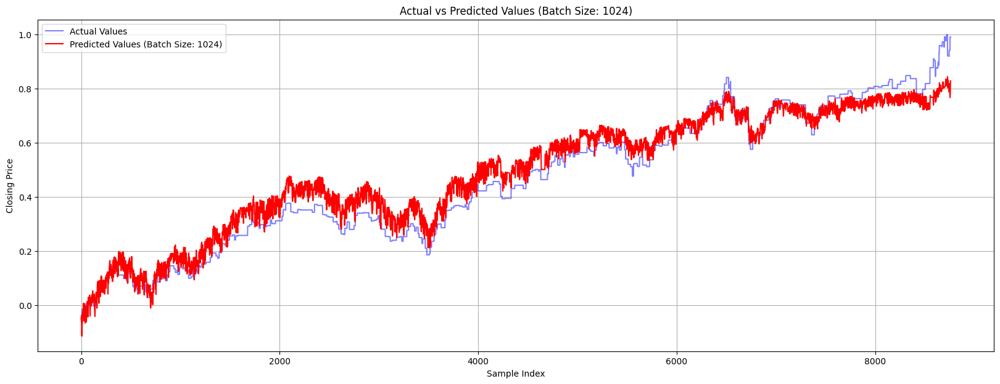

In [50]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

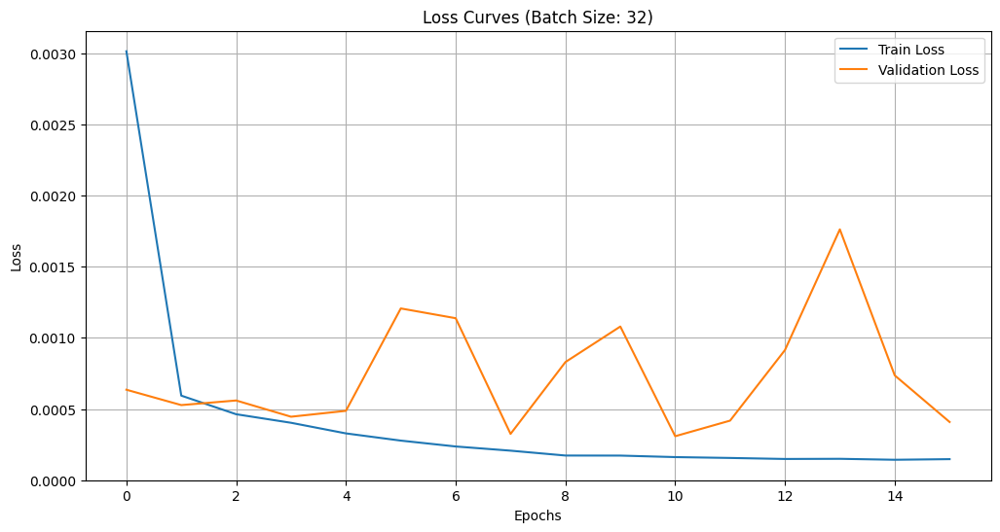

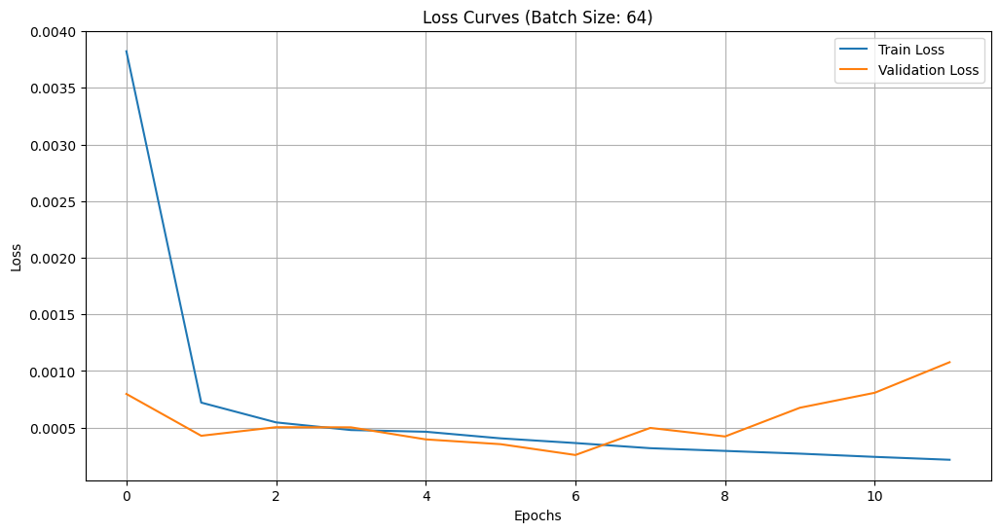

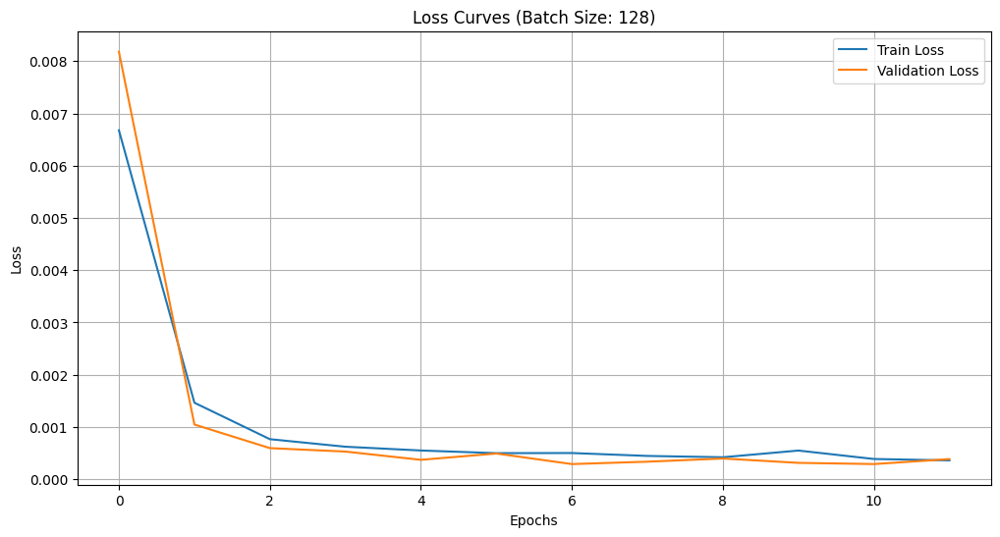

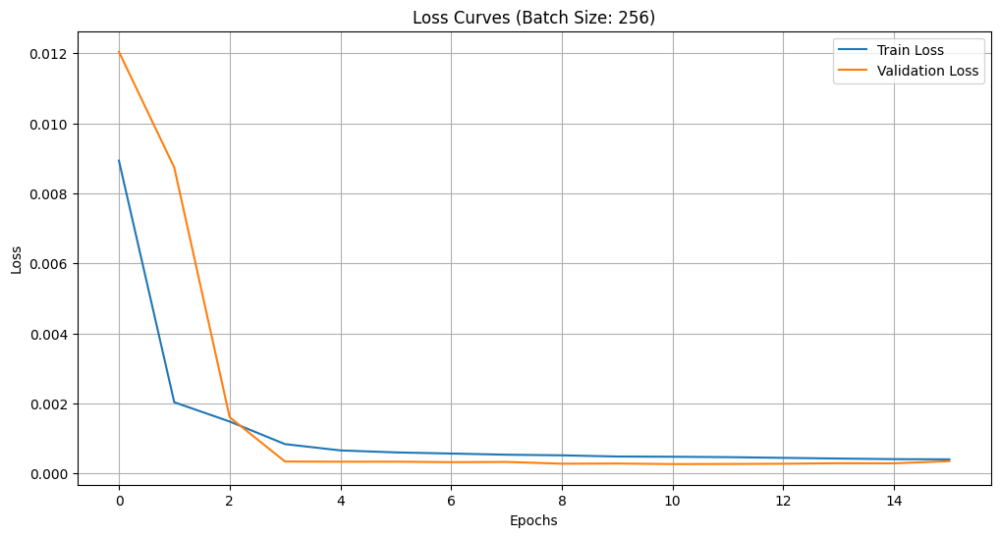

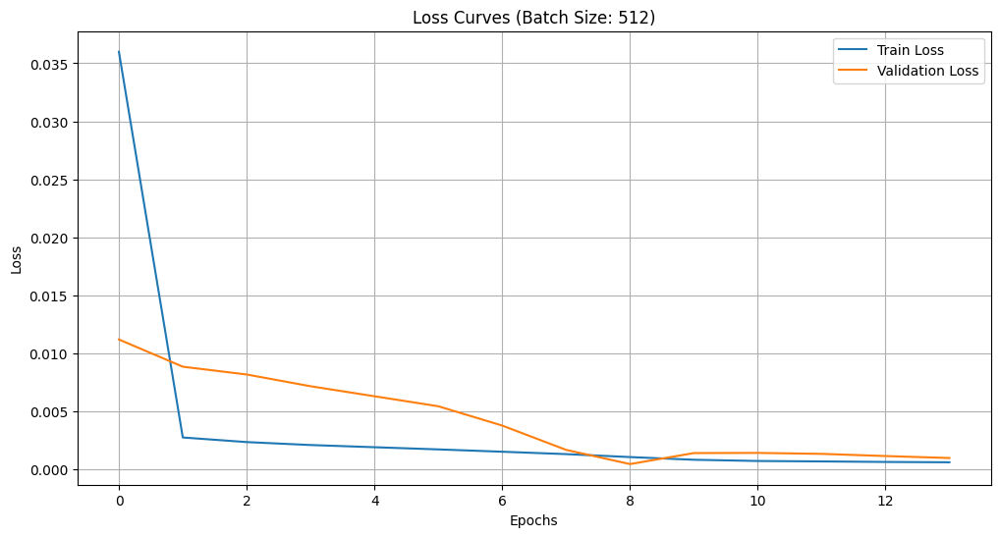

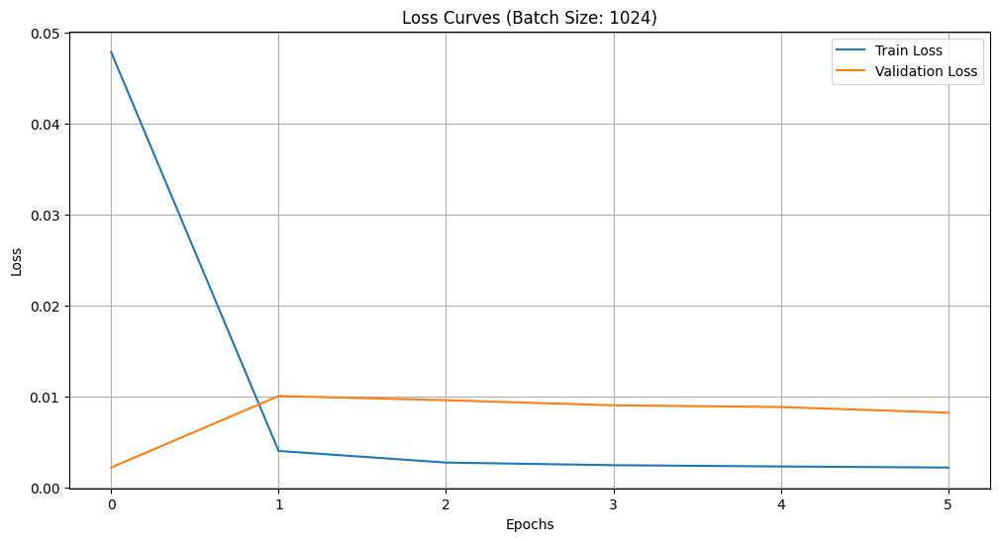

In [51]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

input : Open + High + Low + Volume + past_day_close + VADER + RoBERTa 

In [52]:
from sklearn.model_selection import train_test_split

past_nasdaq_sentiment = ['Open', 'High', 'Low', 'Volume', 'past_day_close', 'vader_sentiment', 'roberta_sentiment']

X, y = create_dataset(df[past_nasdaq_sentiment].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [53]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Batch Size: 32, MSE: 0.020, RMSE: 0.141, R-squared: 0.670
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Batch Size: 64, MSE: 0.015, RMSE: 0.121, R-squared: 0.758
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Batch Size: 128, MSE: 0.014, RMSE: 0.119, R-squared: 0.766
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Batch Size: 256, MSE: 0.016, RMSE: 0.126, R-squared: 0.737
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Batch Size: 512, MSE: 0.016, RMSE: 0.126, R-squared: 0.737
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Batch Size: 1024, MSE: 0.004, RMSE: 0.060, R-squared: 0.941


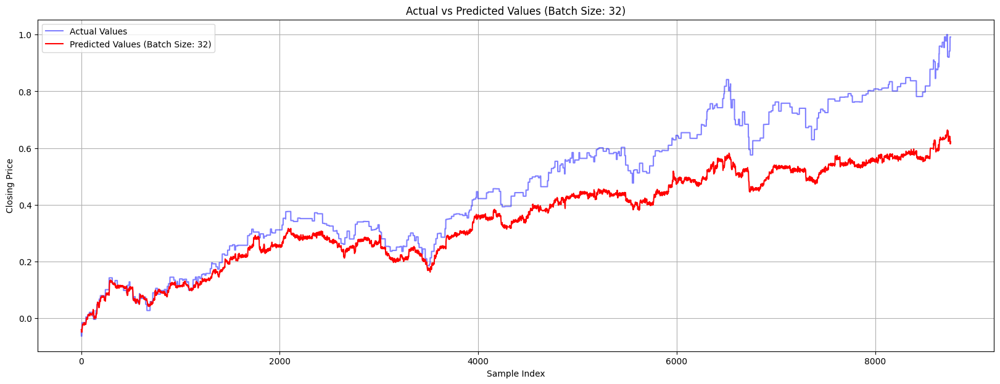

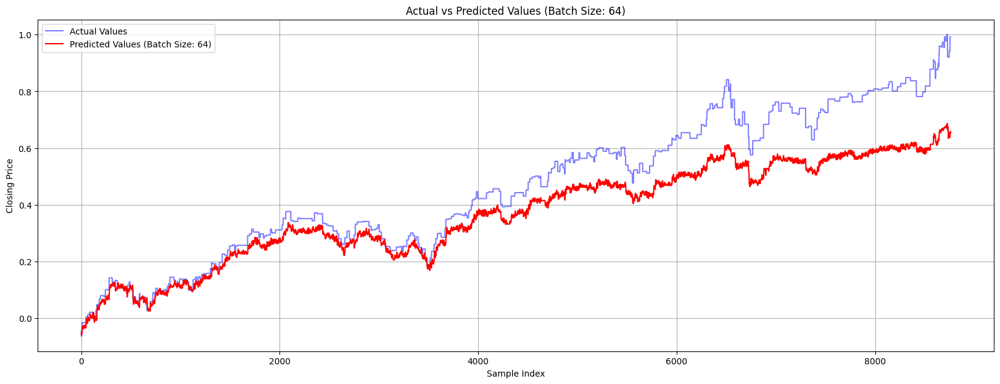

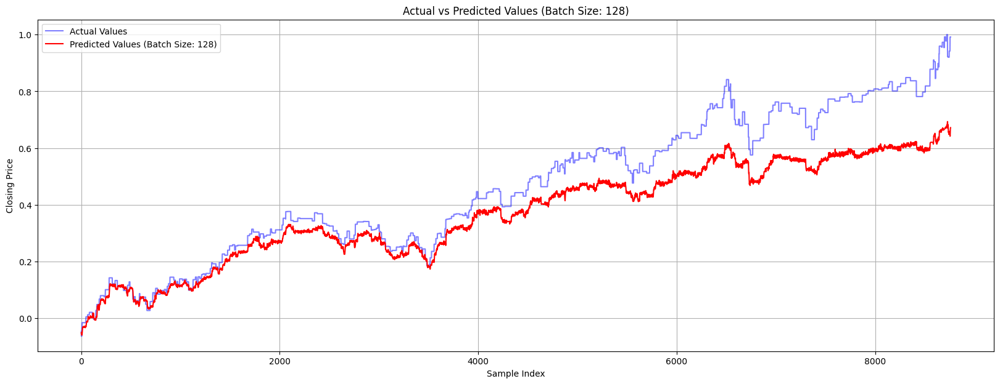

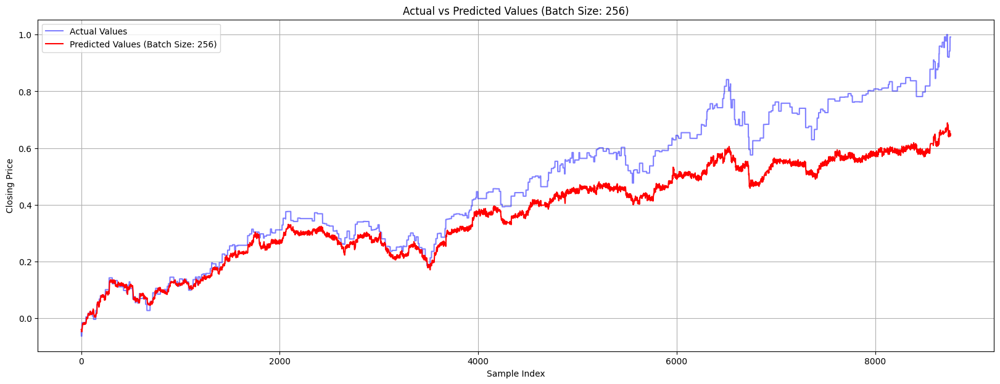

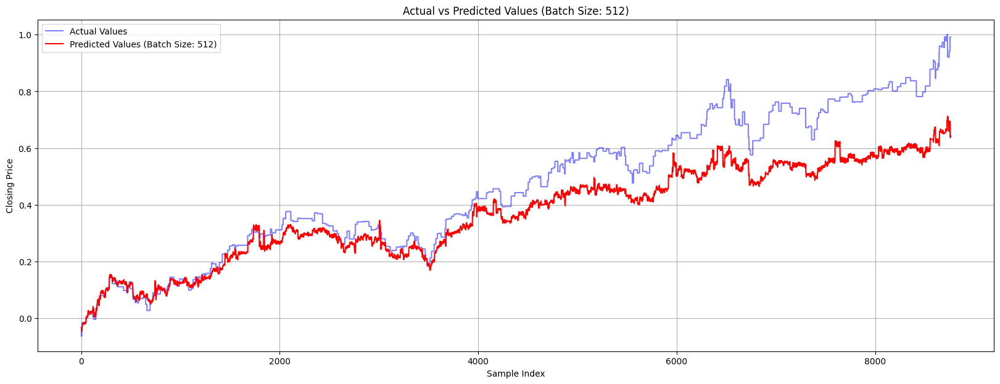

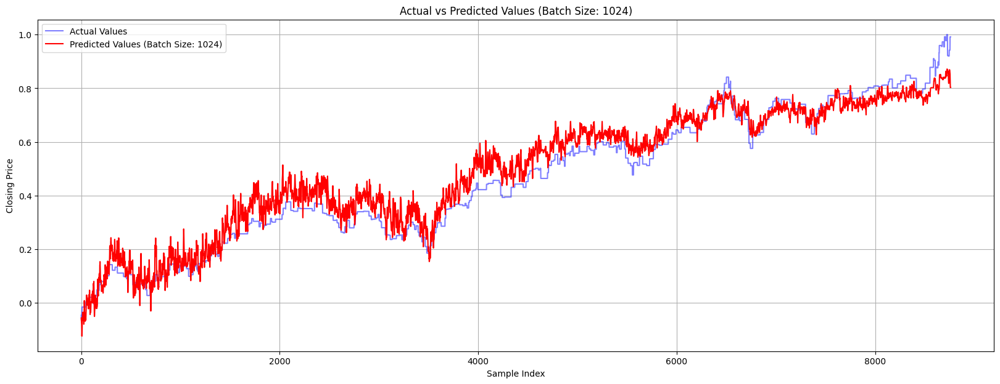

In [54]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

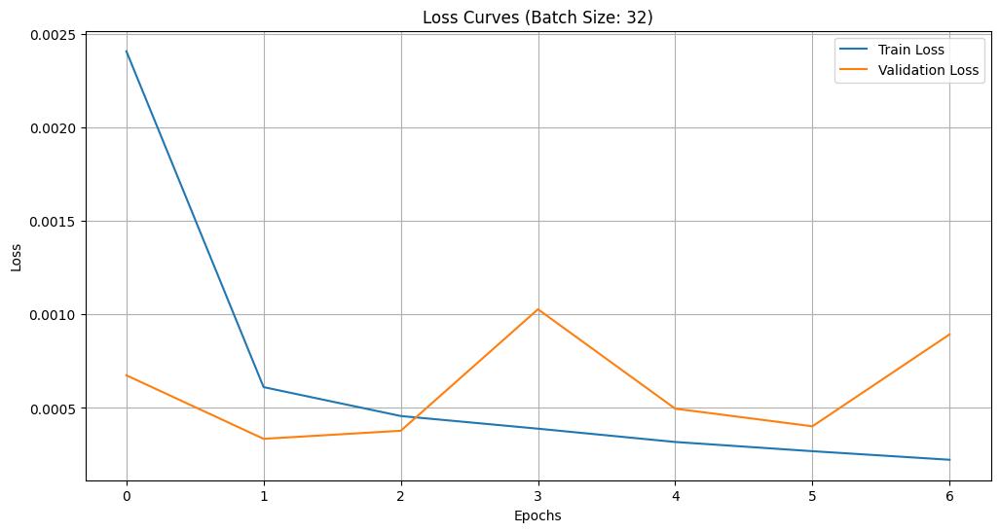

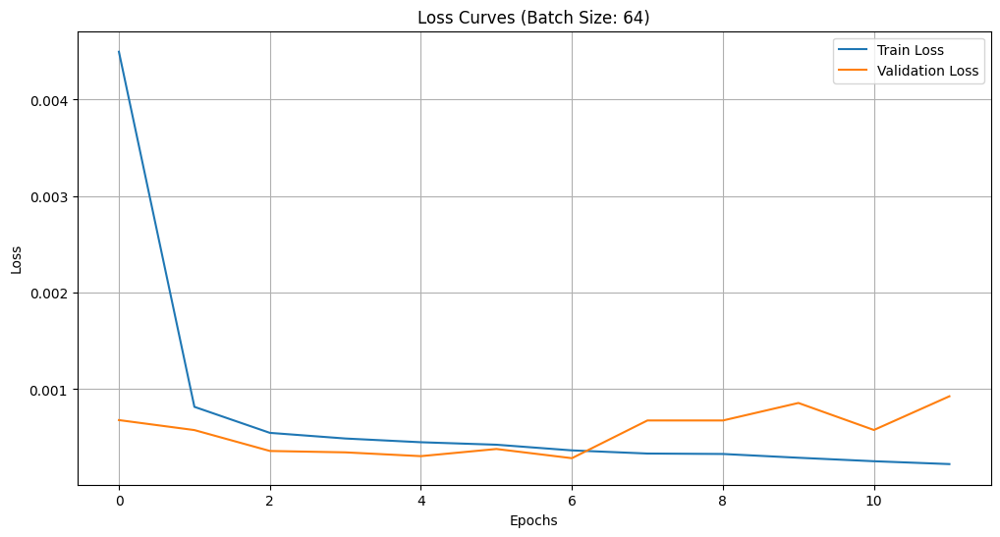

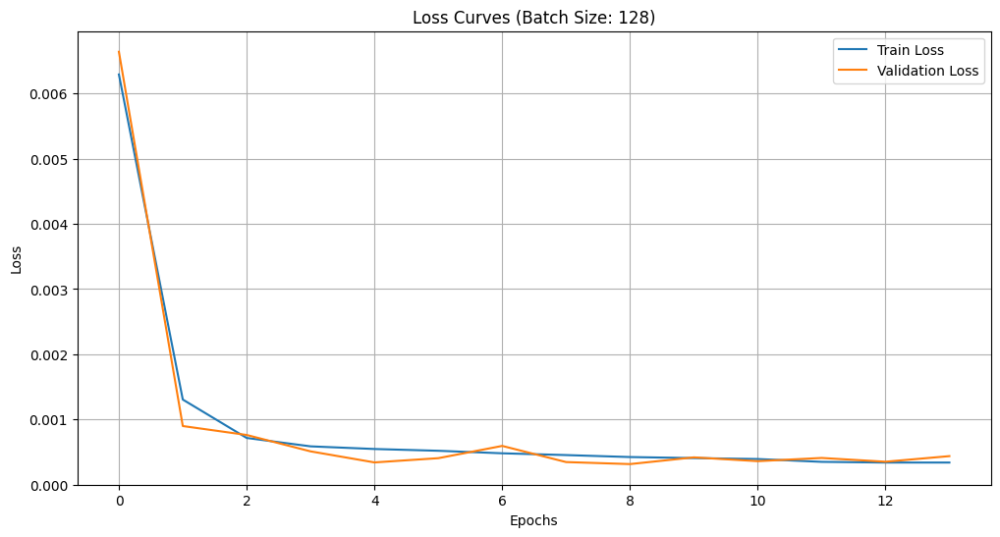

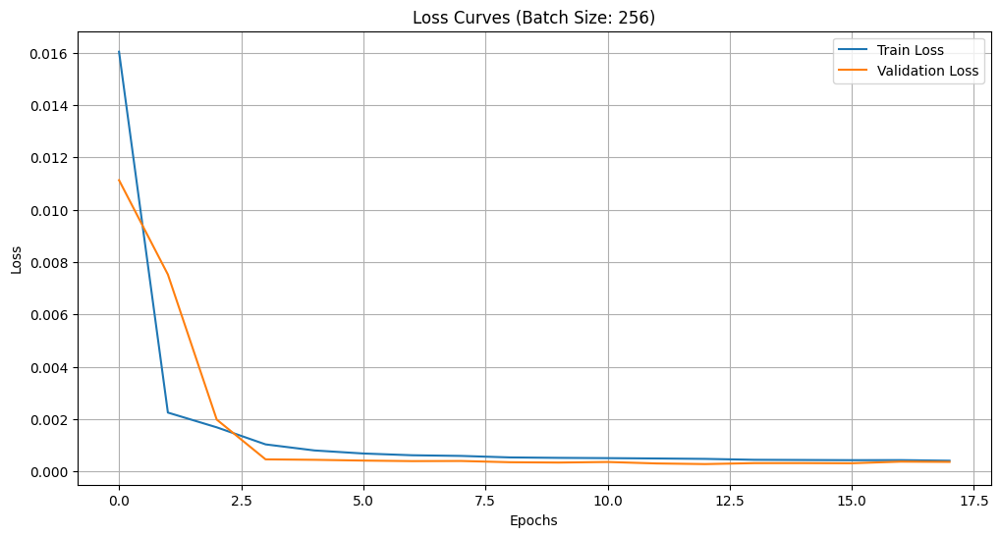

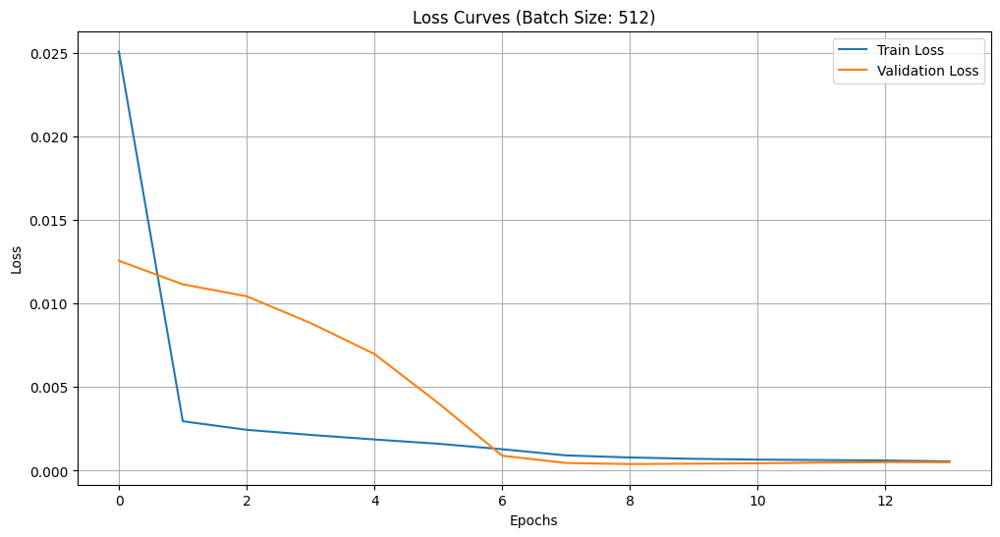

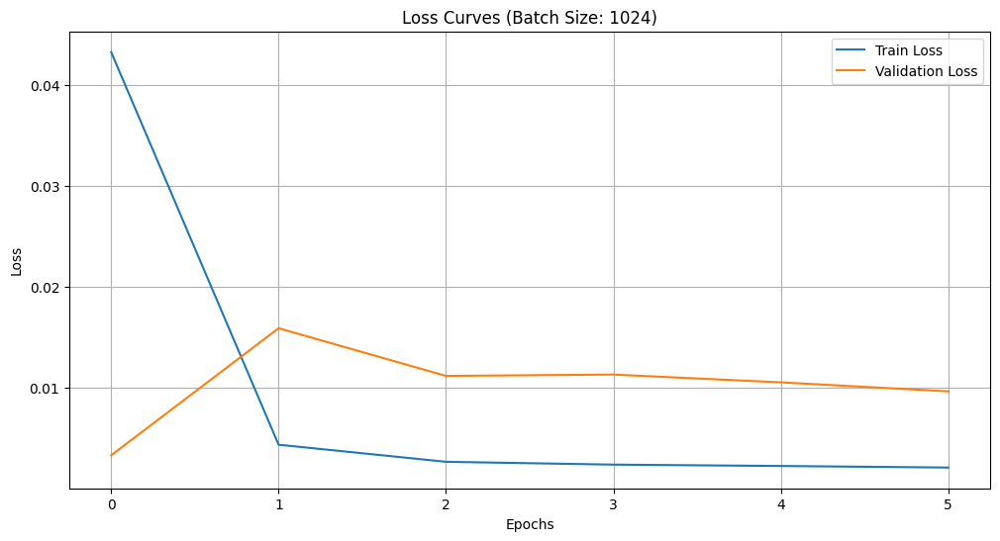

In [55]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

## 추가!! lstm도 걍 내가 돌려서 가져가자

input : Open + High + Low + Volume + VADER + RoBERTa

In [56]:
from sklearn.model_selection import train_test_split

nasdaq_sentiment = ['Open', 'High', 'Low', 'Volume', 'vader_sentiment', 'roberta_sentiment']

X, y = create_dataset(df[nasdaq_sentiment].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [57]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [32, 64, 128, 256, 512, 1024]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step
Batch Size: 32, MSE: 0.017, RMSE: 0.131, R-squared: 0.714
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
Batch Size: 64, MSE: 0.014, RMSE: 0.117, R-squared: 0.774
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
Batch Size: 128, MSE: 0.017, RMSE: 0.129, R-squared: 0.722
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
Batch Size: 256, MSE: 0.013, RMSE: 0.116, R-squared: 0.778
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
Batch Size: 512, MSE: 0.013, RMSE: 0.115, R-squared: 0.780
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
Batch Size: 1024, MSE: 0.005, RMSE: 0.072, R-squared: 0.914


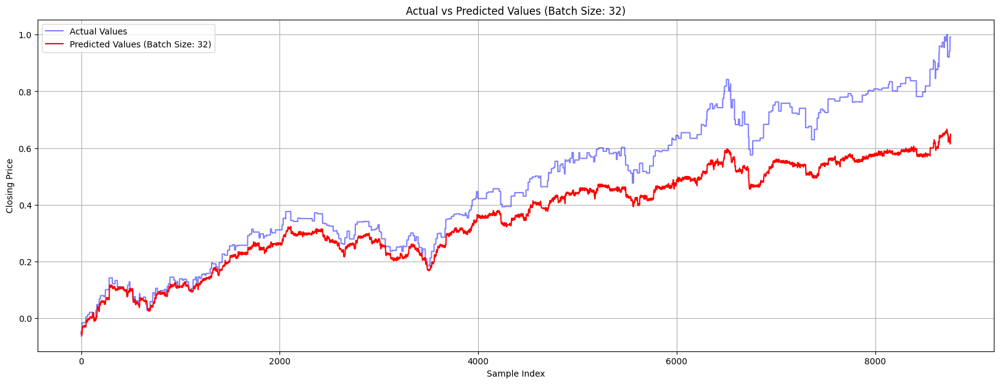

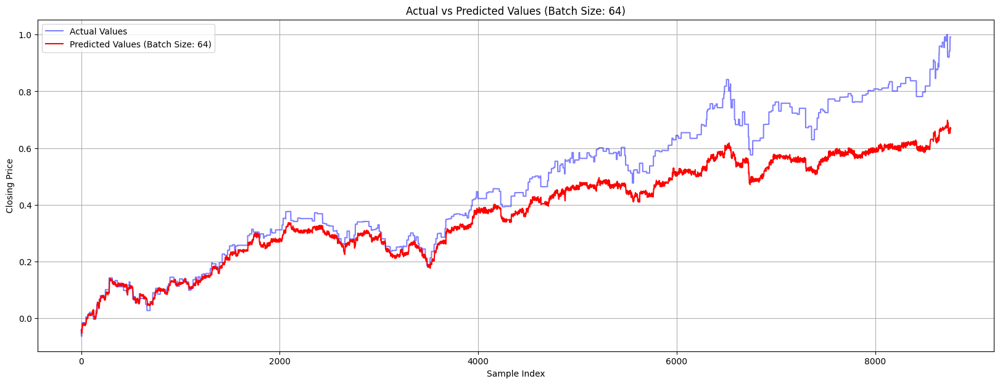

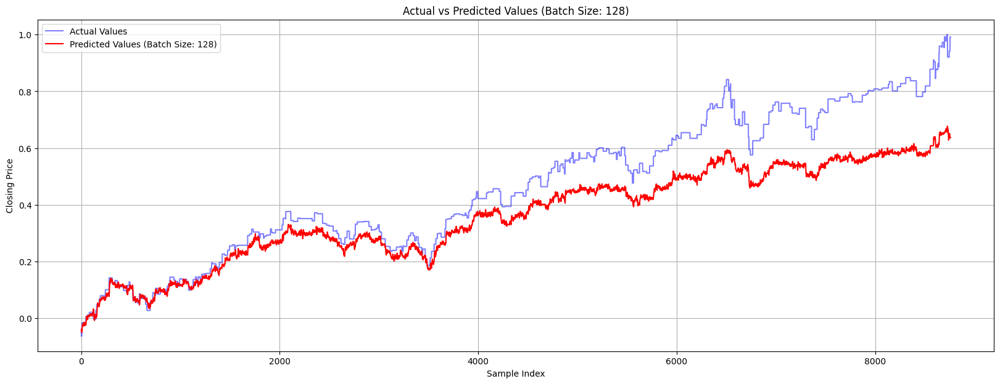

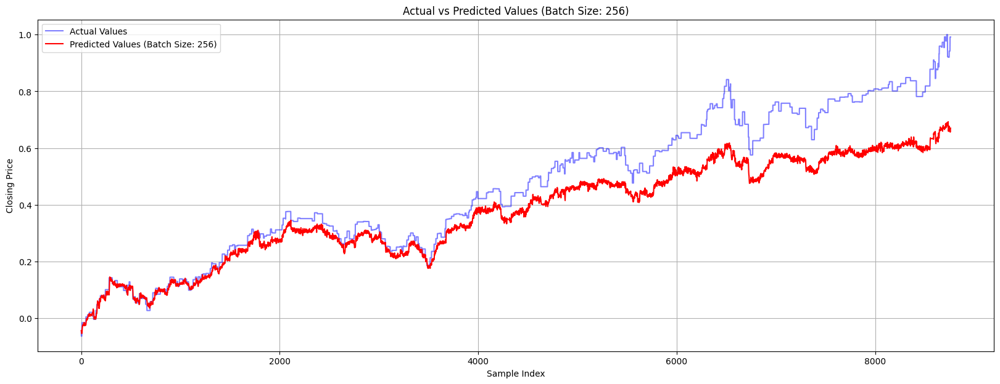

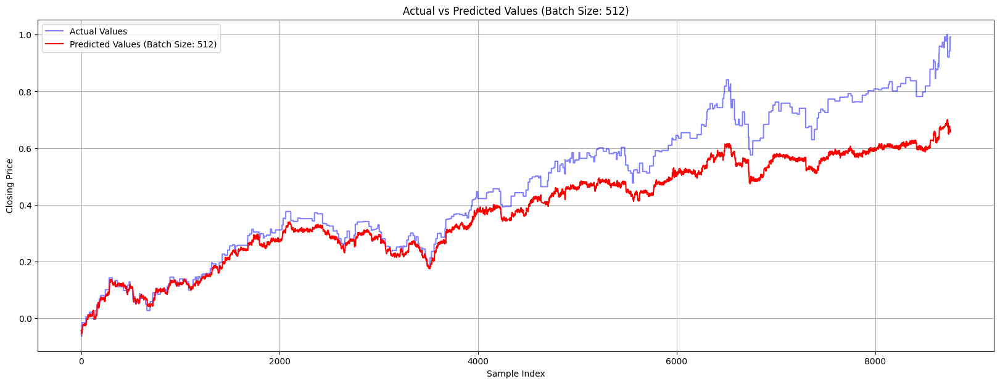

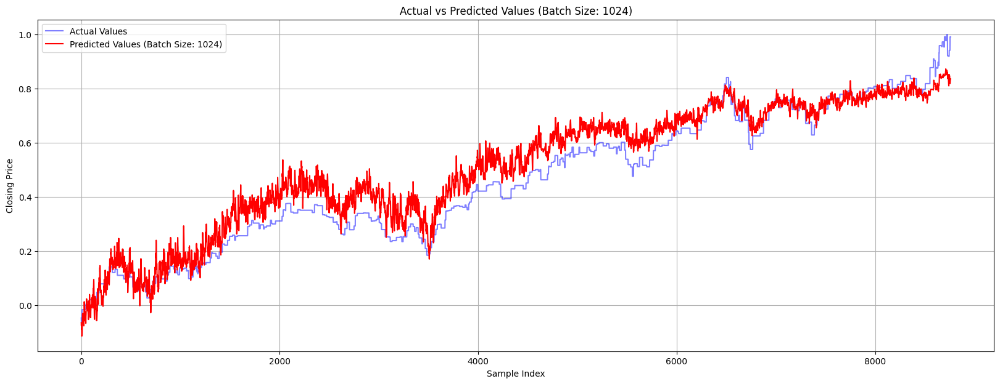

In [58]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

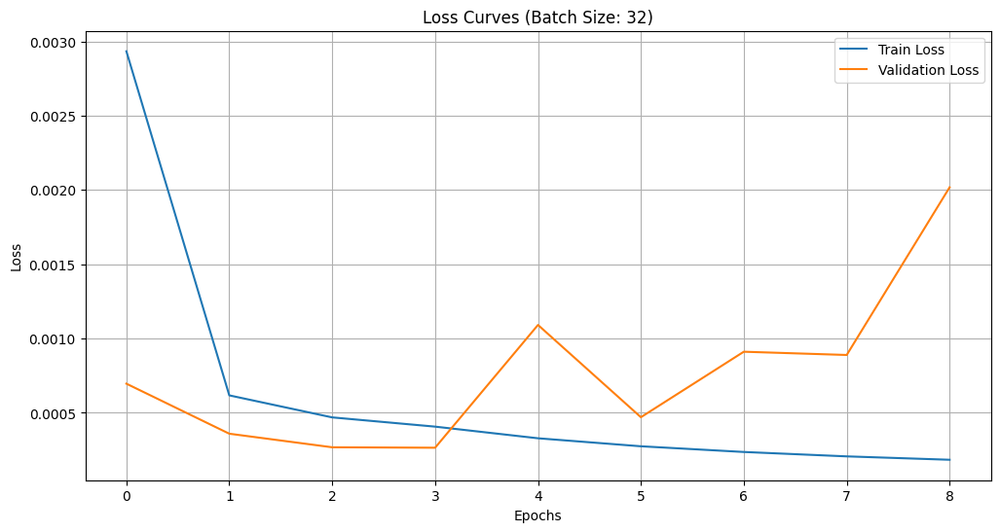

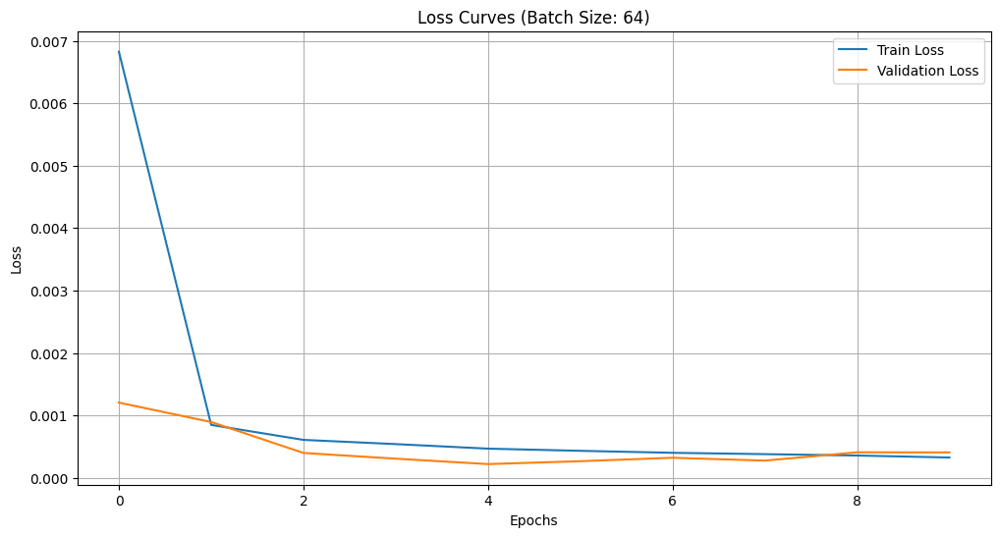

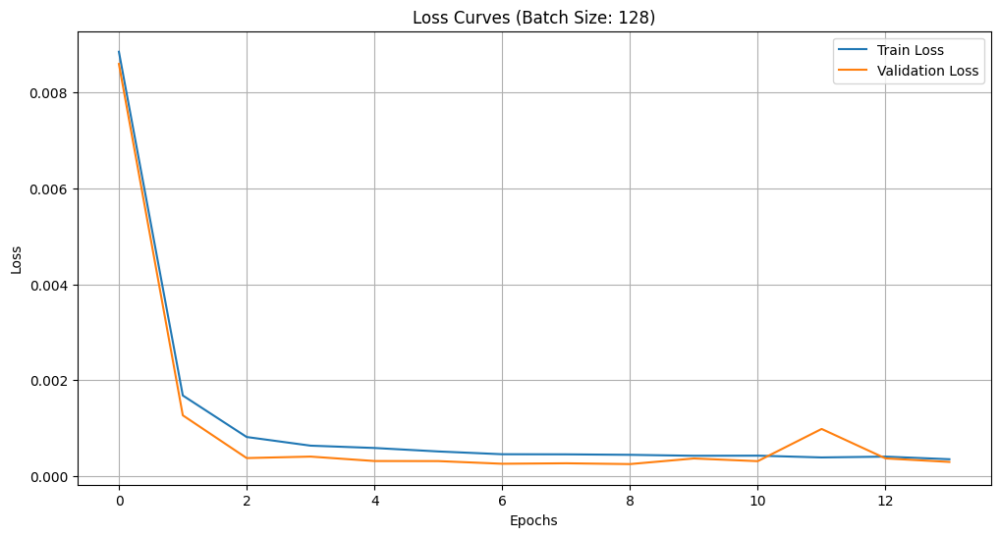

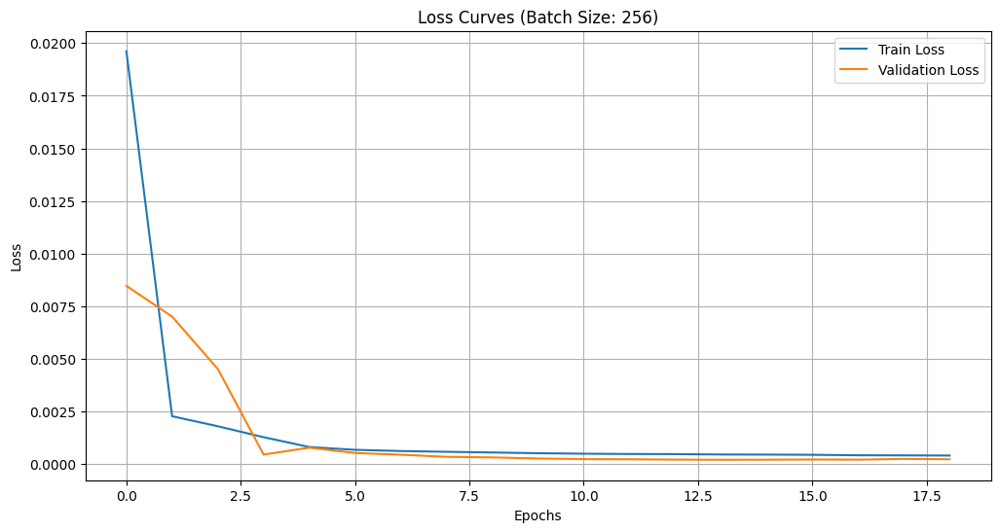

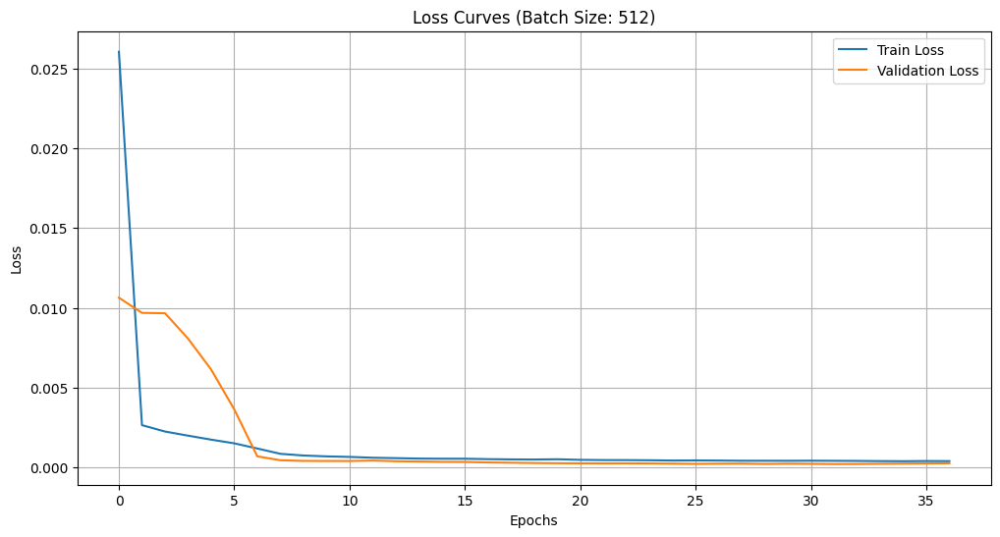

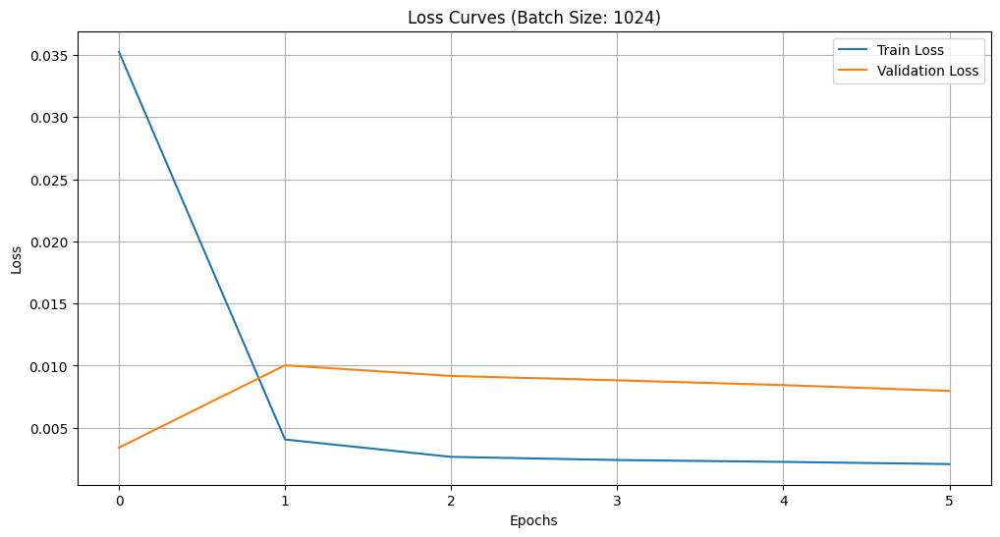

In [59]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

1024 batchsize 이후 시도

In [62]:
from sklearn.model_selection import train_test_split

X, y = create_dataset(df[nasdaq].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [63]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [1024, 2048, 4096]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
Batch Size: 1024, MSE: 0.002, RMSE: 0.047, R-squared: 0.963
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
Batch Size: 2048, MSE: 0.013, RMSE: 0.113, R-squared: 0.788
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
Batch Size: 4096, MSE: 0.012, RMSE: 0.107, R-squared: 0.809


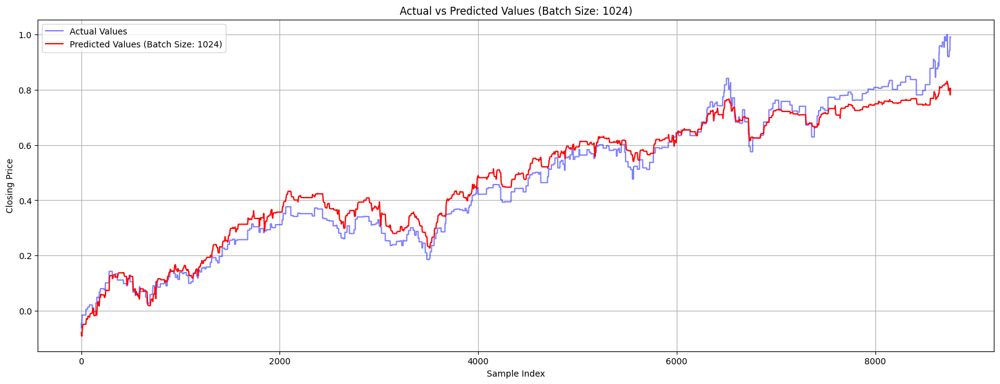

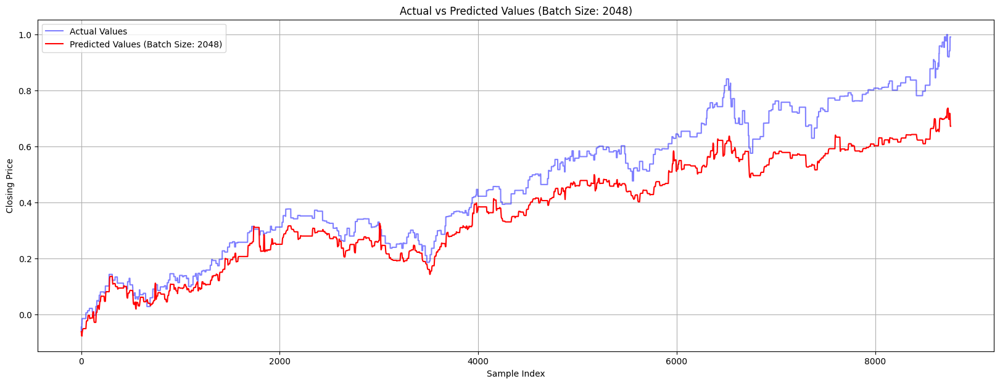

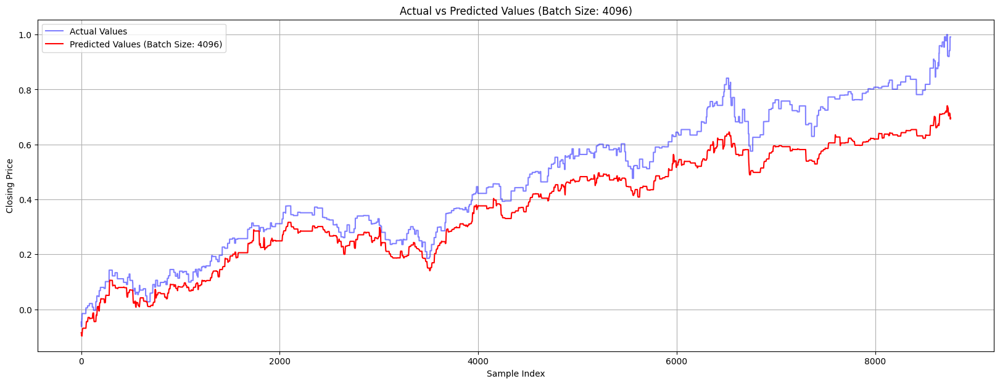

In [64]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

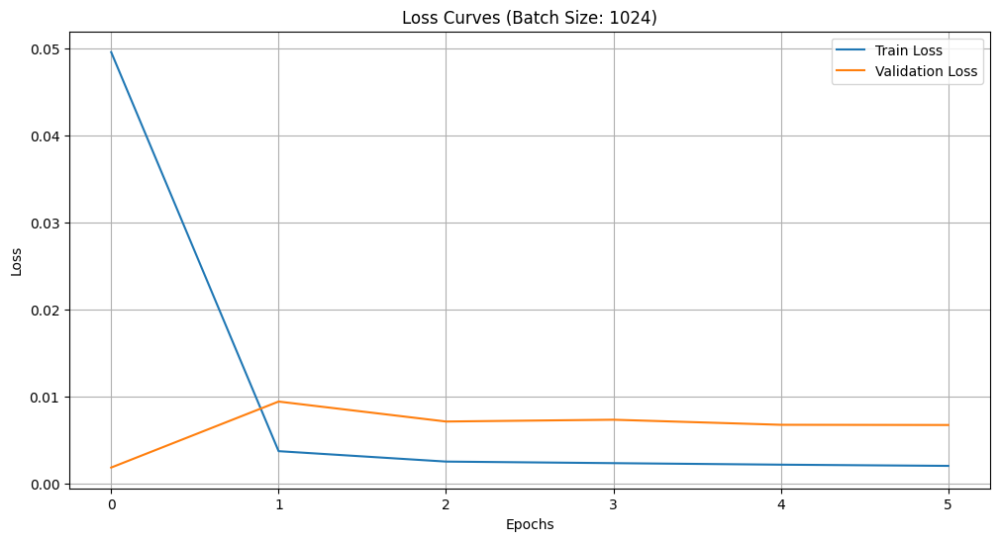

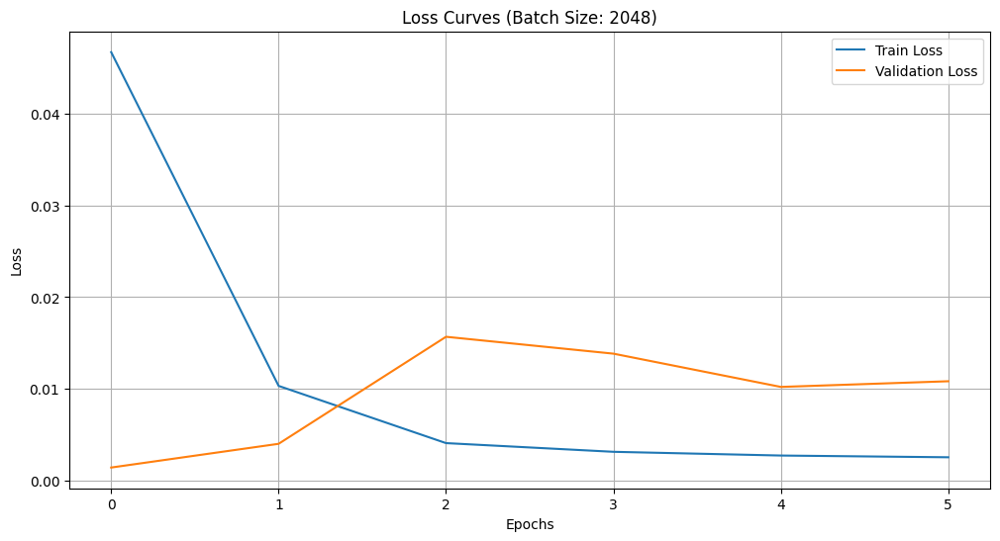

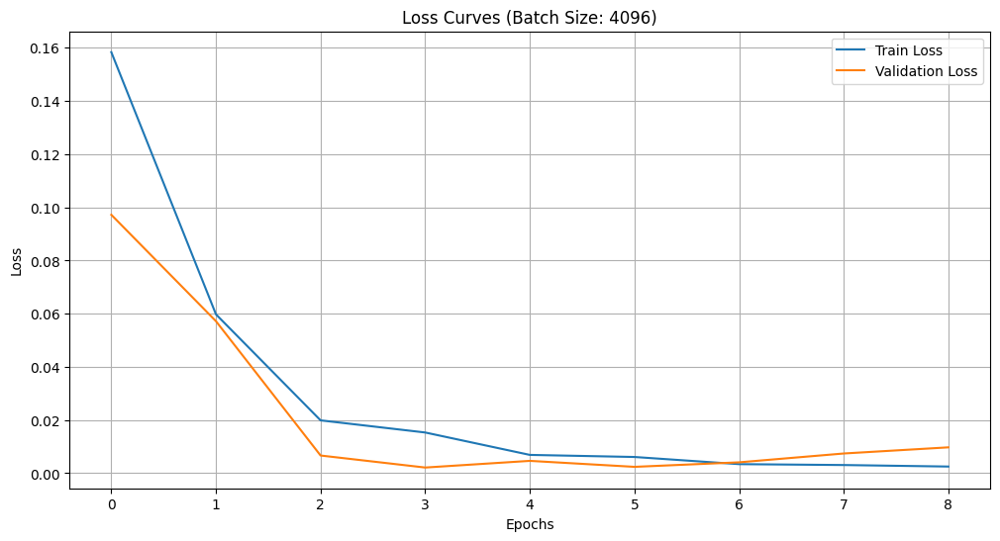

In [65]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

In [66]:
from sklearn.model_selection import train_test_split

X, y = create_dataset(df[past_nasdaq].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [67]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [1024, 2048, 4096]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step
Batch Size: 1024, MSE: 0.002, RMSE: 0.047, R-squared: 0.963
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step
Batch Size: 2048, MSE: 0.002, RMSE: 0.048, R-squared: 0.962
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step
Batch Size: 4096, MSE: 0.002, RMSE: 0.047, R-squared: 0.964


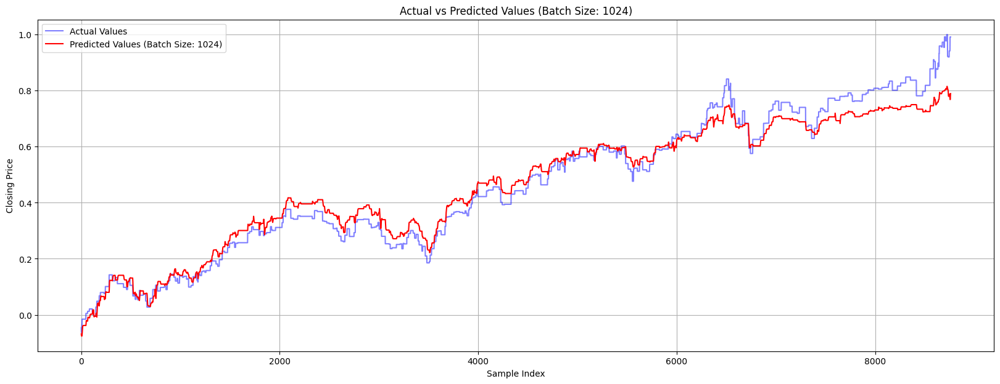

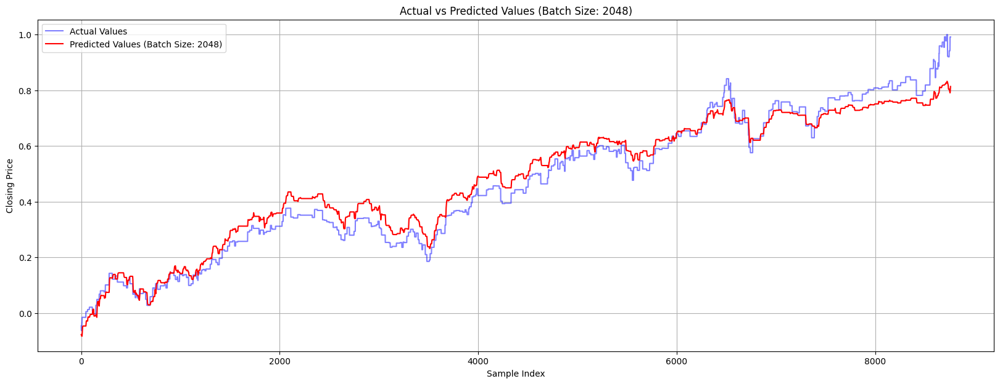

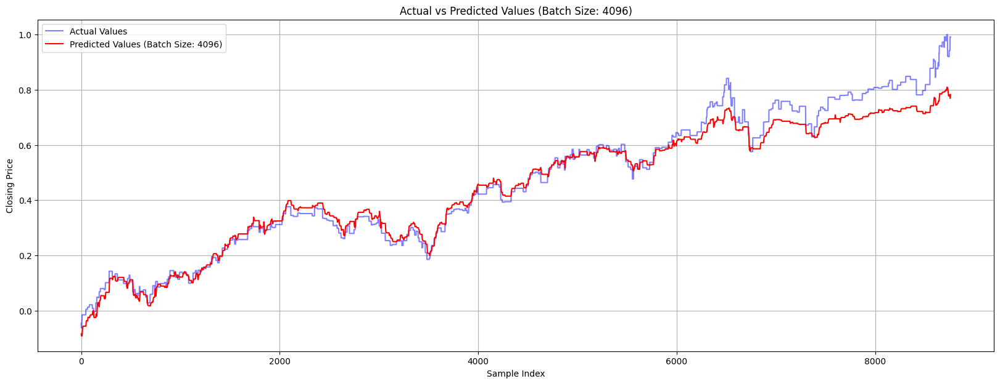

In [68]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

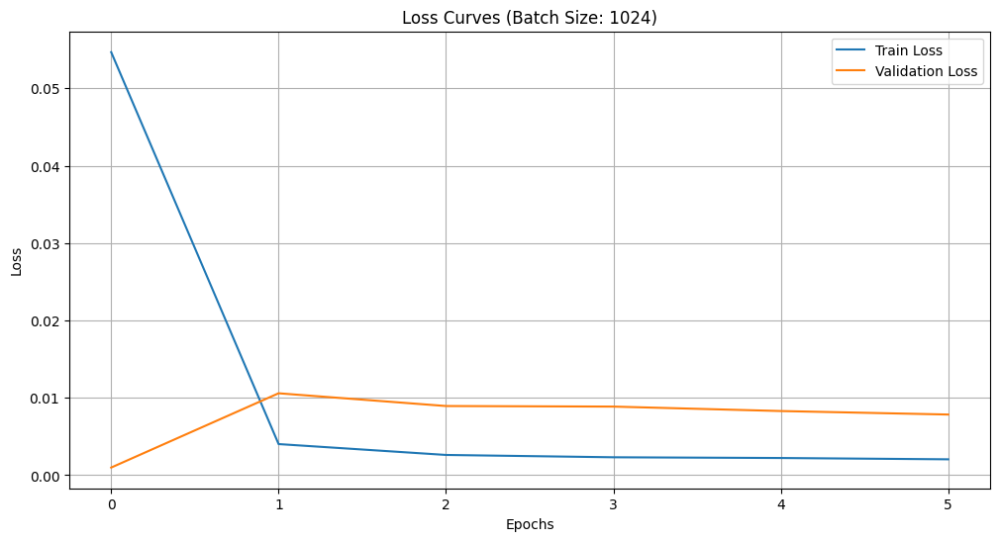

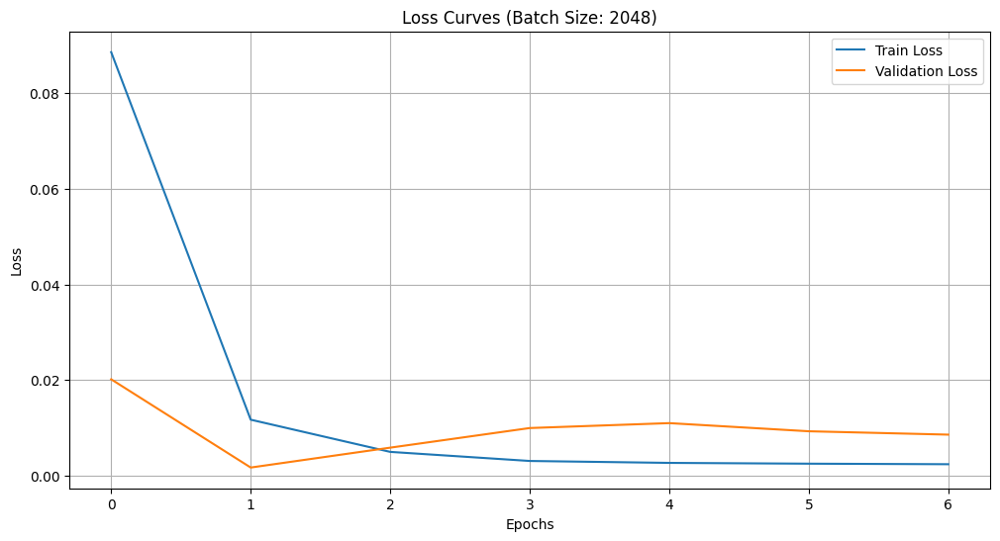

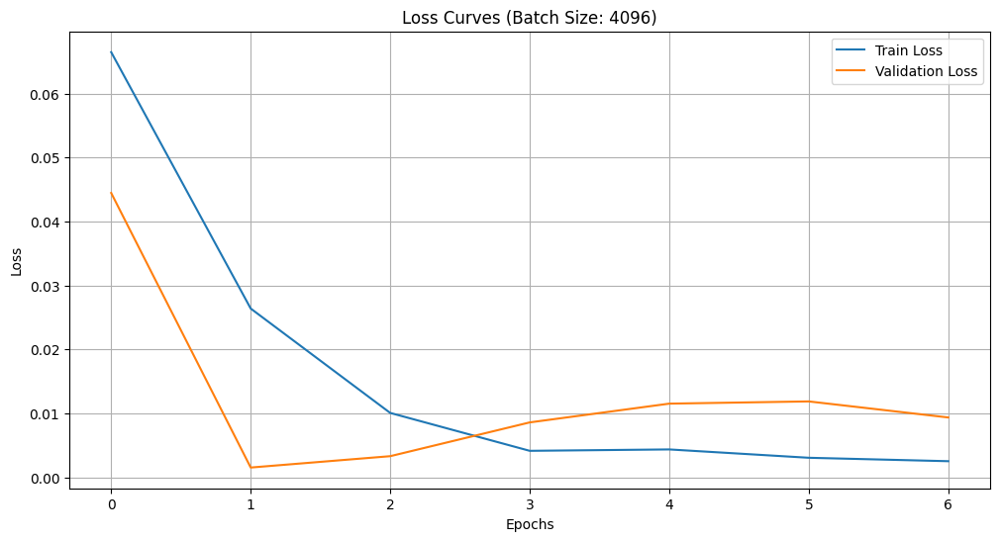

In [69]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

In [70]:
from sklearn.model_selection import train_test_split

X, y = create_dataset(df[past_nasdaq_vader].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [71]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [1024, 2048, 4096]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step
Batch Size: 1024, MSE: 0.011, RMSE: 0.104, R-squared: 0.820
274/274 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
Batch Size: 2048, MSE: 0.011, RMSE: 0.105, R-squared: 0.817
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
Batch Size: 4096, MSE: 0.004, RMSE: 0.063, R-squared: 0.935


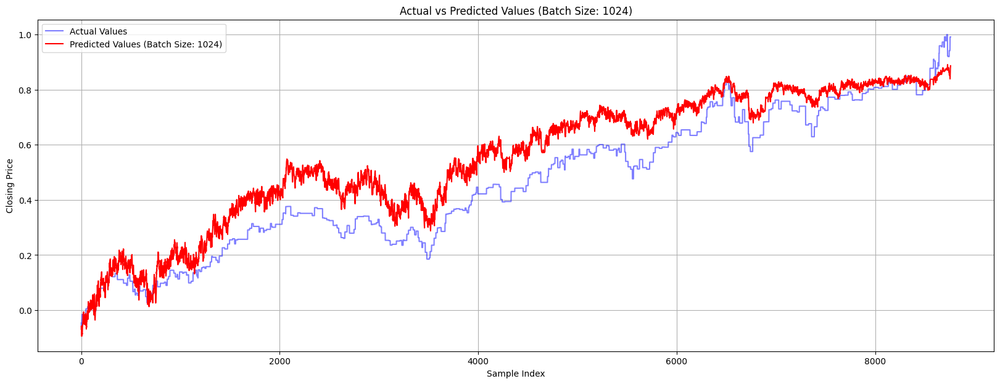

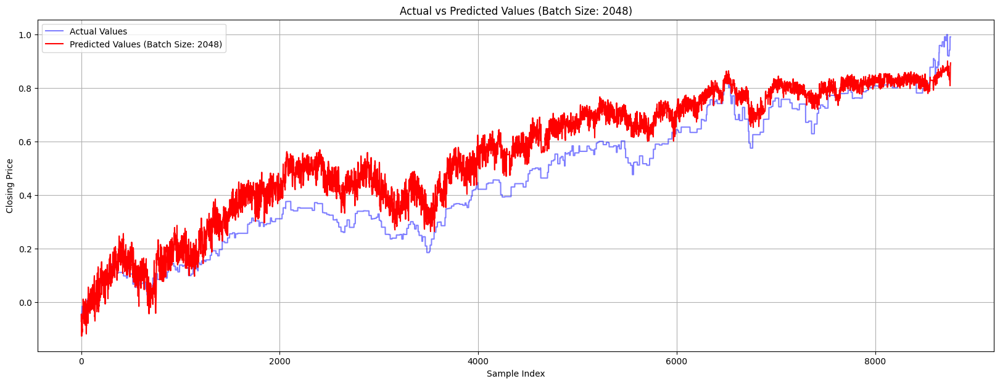

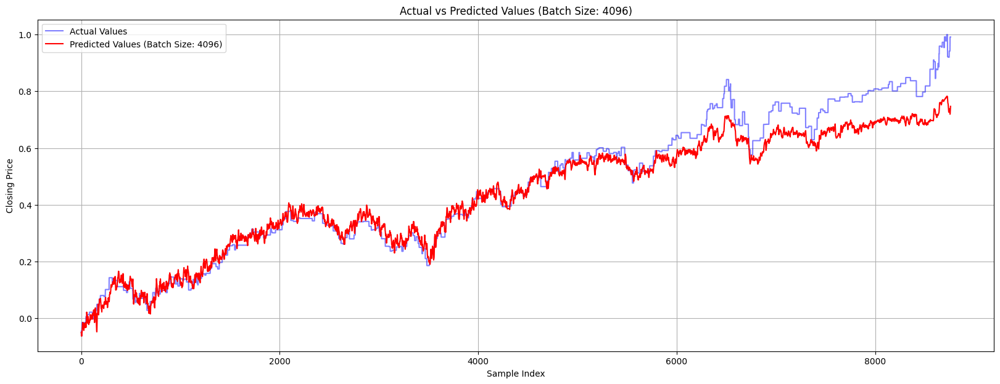

In [72]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

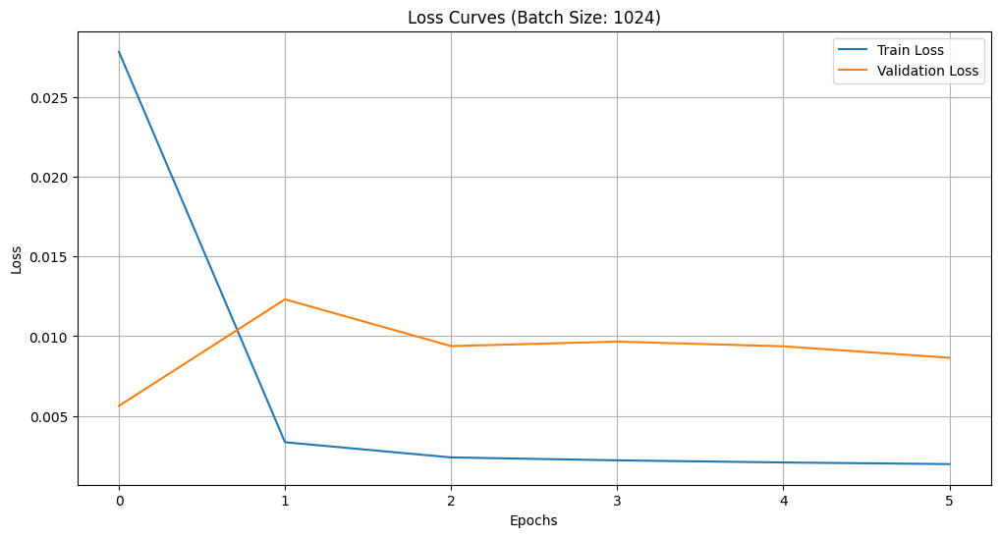

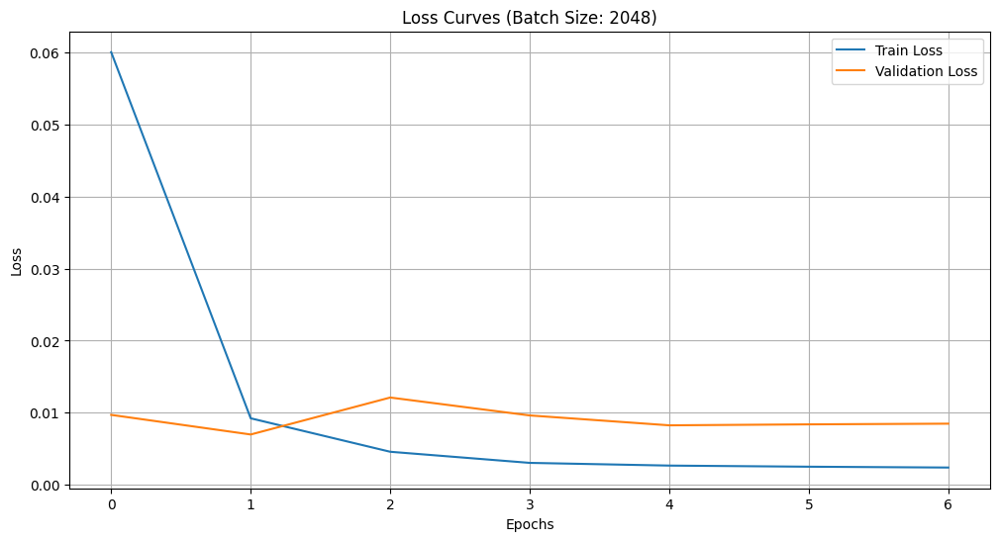

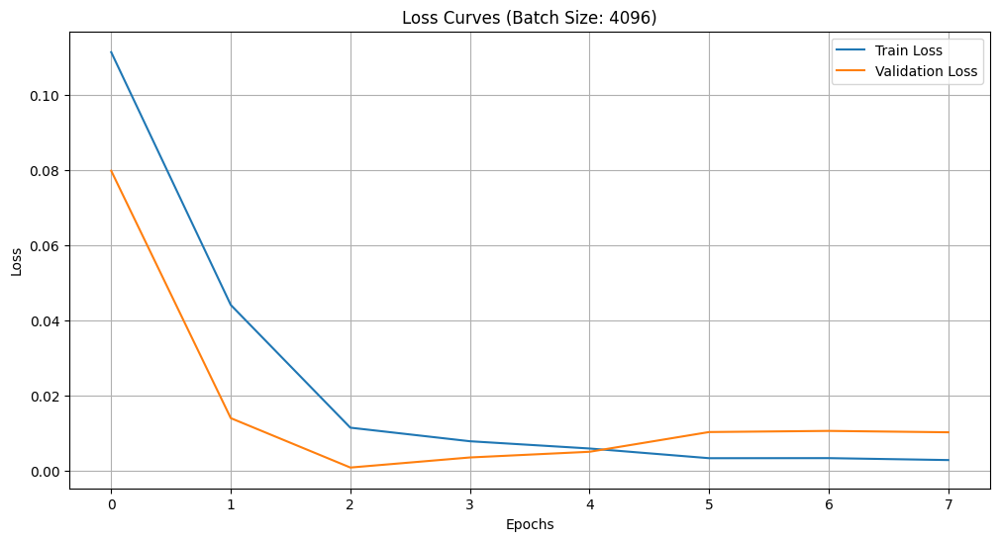

In [73]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

In [74]:
from sklearn.model_selection import train_test_split

X, y = create_dataset(df[past_nasdaq_roberta].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [75]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [1024, 2048, 4096]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step
Batch Size: 1024, MSE: 0.011, RMSE: 0.104, R-squared: 0.819
274/274 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step
Batch Size: 2048, MSE: 0.003, RMSE: 0.058, R-squared: 0.943
274/274 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step
Batch Size: 4096, MSE: 0.006, RMSE: 0.075, R-squared: 0.906


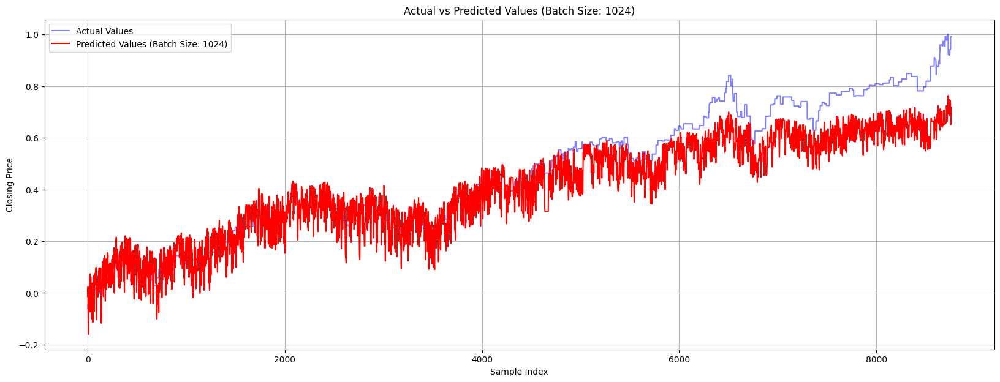

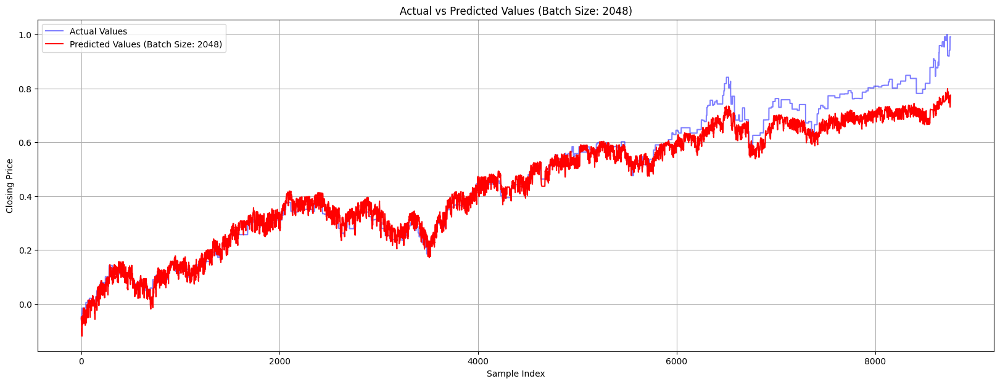

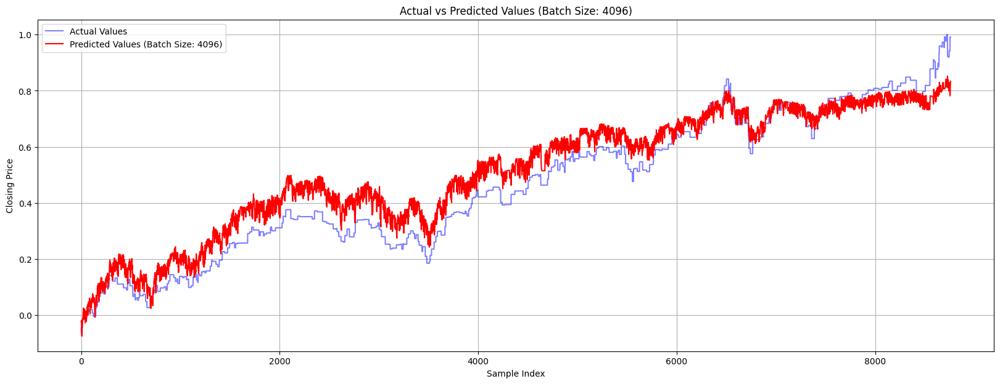

In [76]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

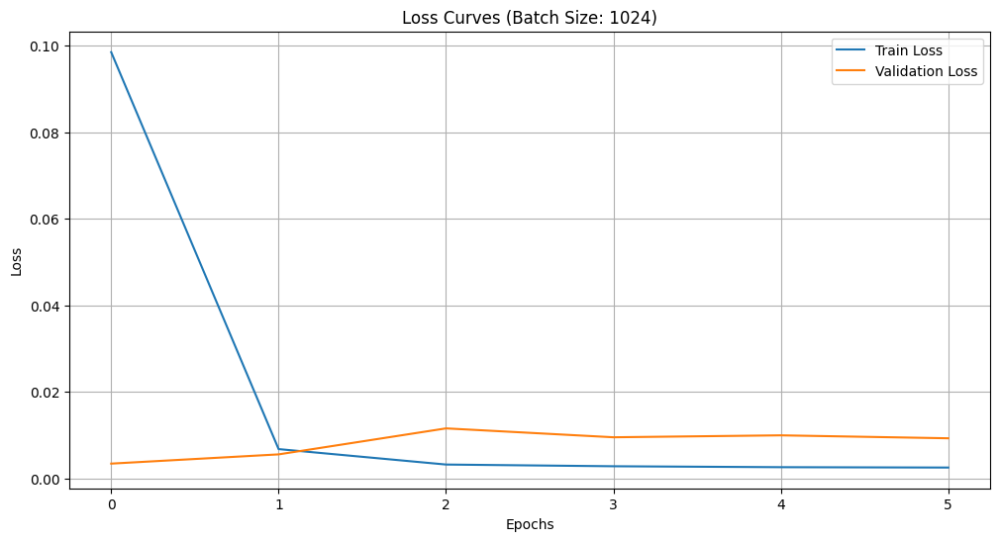

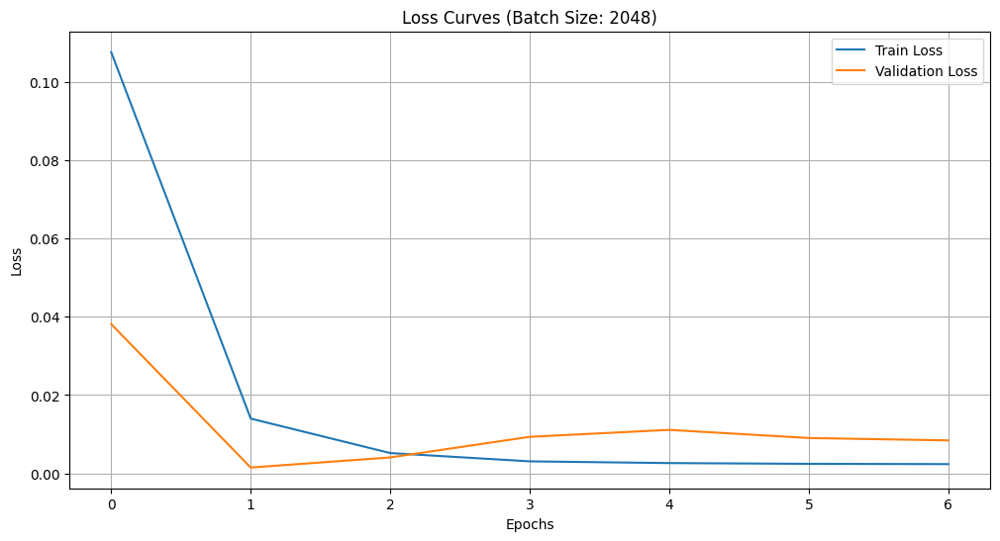

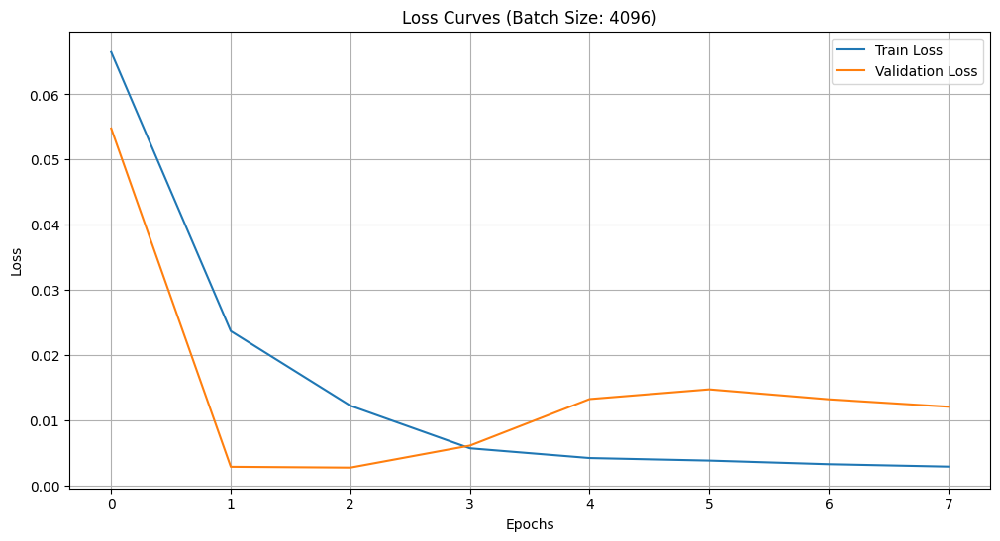

In [77]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

In [78]:
from sklearn.model_selection import train_test_split

X, y = create_dataset(df[past_nasdaq_sentiment].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [79]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [1024, 2048, 4096]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step
Batch Size: 1024, MSE: 0.007, RMSE: 0.087, R-squared: 0.876
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step
Batch Size: 2048, MSE: 0.010, RMSE: 0.102, R-squared: 0.827
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step
Batch Size: 4096, MSE: 0.005, RMSE: 0.070, R-squared: 0.920


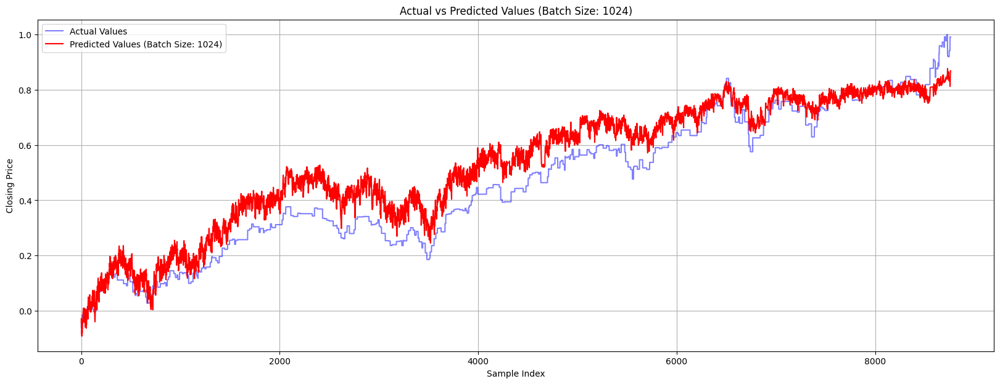

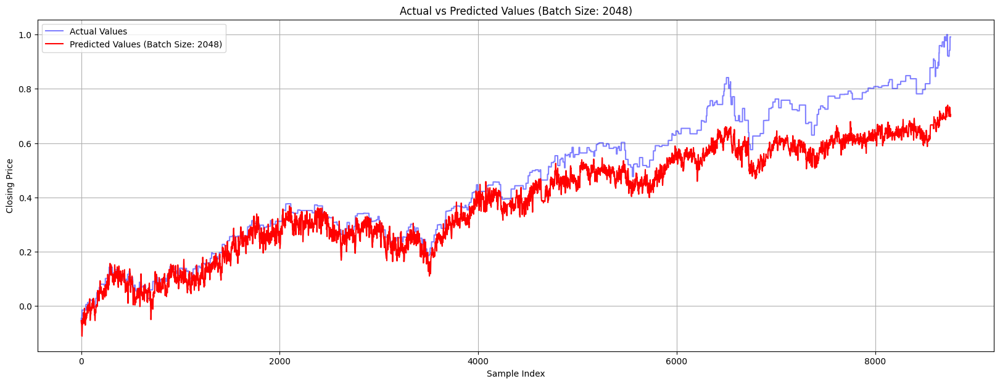

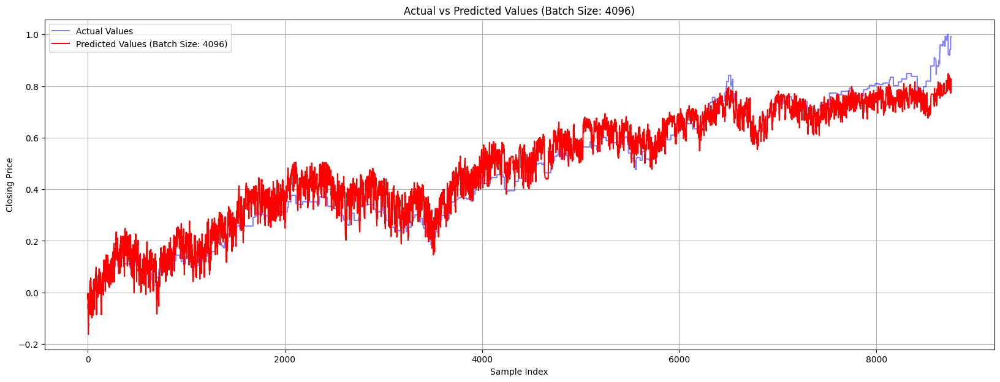

In [80]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

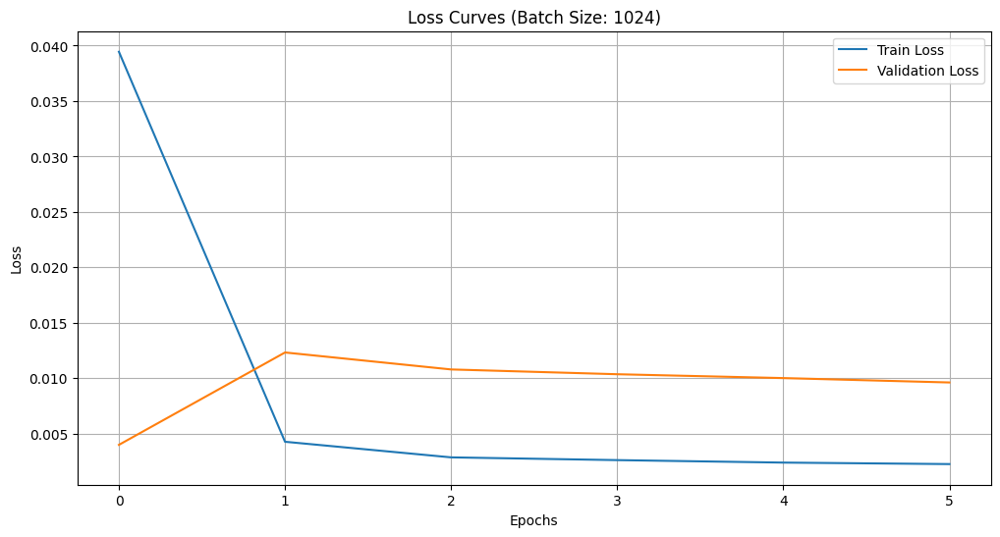

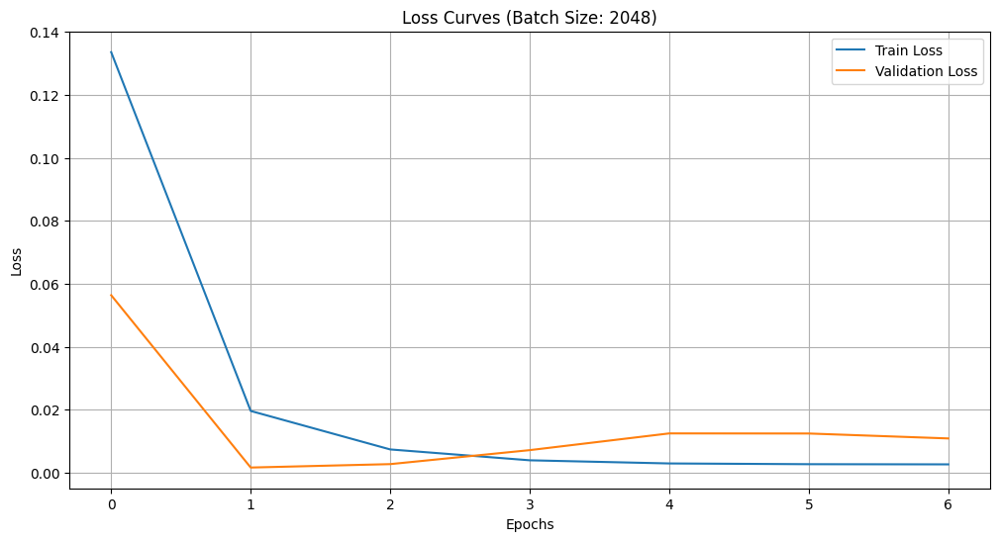

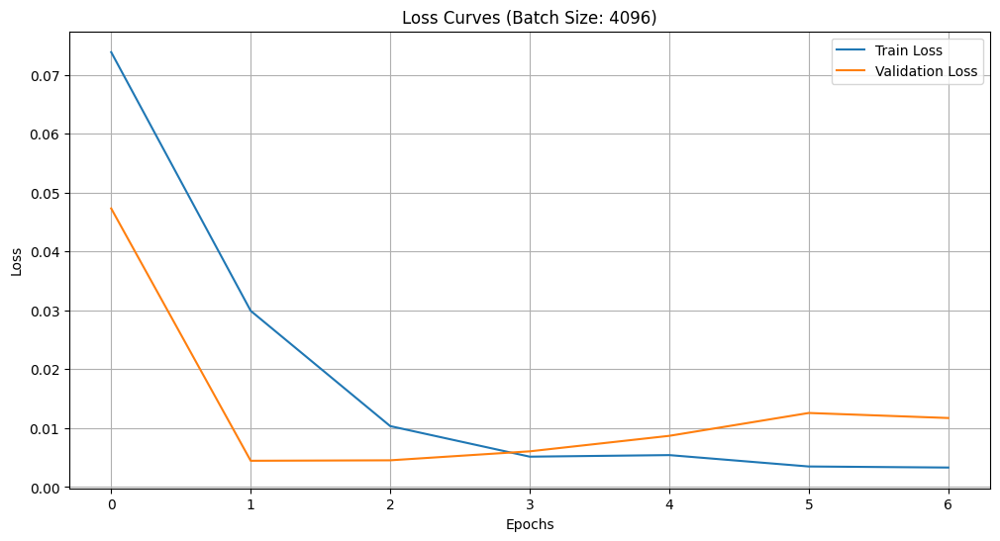

In [81]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

In [82]:
from sklearn.model_selection import train_test_split

X, y = create_dataset(df[nasdaq_sentiment].values, df['Adj Close'].values)

# 데이터셋을 train+validation, test 나누기 (8:2)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# train, validation (8:2)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.2, random_state = 42, shuffle = False)

In [83]:
# 다양한 배치 크기로 모델 학습
batch_sizes = [1024, 2048, 4096]
predictions_dict = {}  # 예측값 저장
history_dict = {}  # 손실 기록 저장

for batch_size in batch_sizes:
    model = create_model()
    history = model.fit(X_train, y_train, epochs=200, batch_size=batch_size, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stopping])
    
    # 손실 기록 저장
    history_dict[batch_size] = history.history

    # 예측 수행 및 평가
    mse, rmse, r_squared = evaluate_model(model, X_test, y_test)
    
    # 예측값 저장
    predictions_dict[batch_size] = model.predict(X_test).flatten()

    # 성능 출력
    print(f'Batch Size: {batch_size}, MSE: {mse:.3f}, RMSE: {rmse:.3f}, R-squared: {r_squared:.3f}')
    # r_squared = 회귀 모델의 성능을 평가하는 데 사용되는 지표, 모델이 종속 변수의 변동성을 얼마나 잘 설명하는지 나타냄.
    # 일반적으로 0.7 이상이면 좋은 모델. 0과 1 사이의 값을 가짐!
    # 음수값이면 모델이 평균값 예측하는 것보다 더 나쁜 성능... 모델이 데이터에 적합하지 않음..

274/274 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step
Batch Size: 1024, MSE: 0.003, RMSE: 0.056, R-squared: 0.948
274/274 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step
Batch Size: 2048, MSE: 0.003, RMSE: 0.056, R-squared: 0.948
274/274 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step
Batch Size: 4096, MSE: 0.009, RMSE: 0.093, R-squared: 0.857


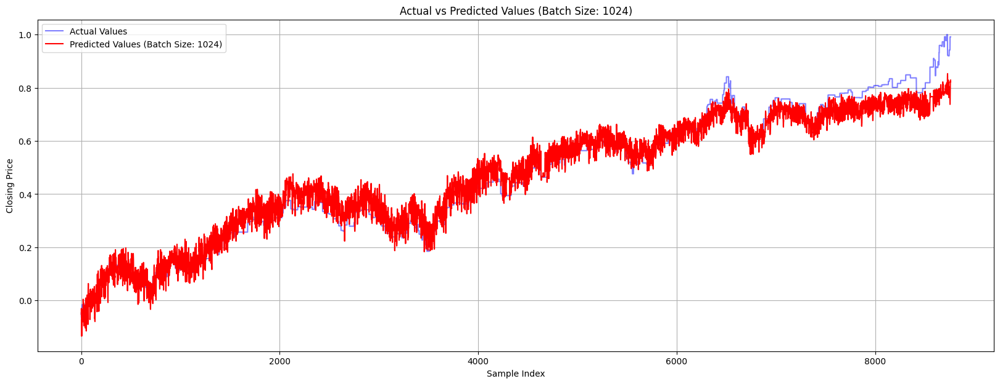

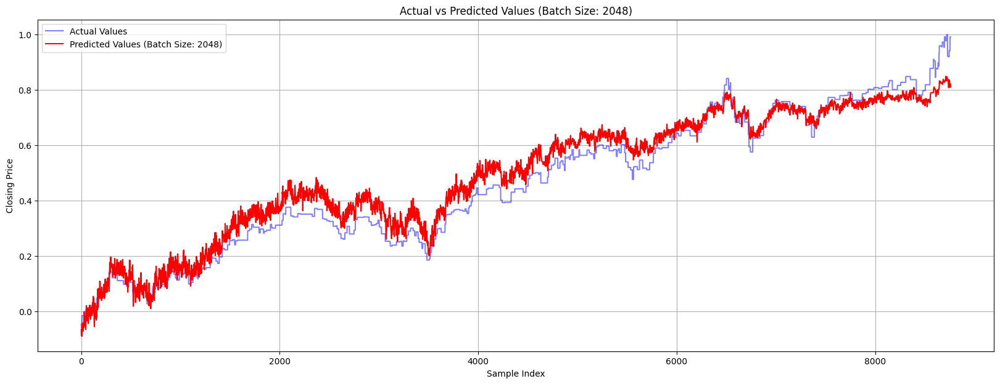

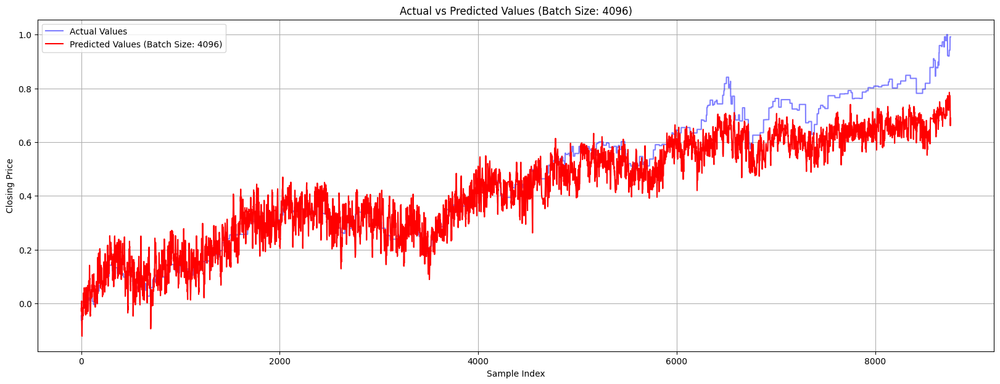

In [84]:
import matplotlib.pyplot as plt

for batch_size in batch_sizes:
    plt.figure(figsize=(20, 7))
    
    # Plot actual values
    plt.plot(y_test.flatten(), label='Actual Values', color='blue', alpha=0.5)
    
    # Plot predicted values
    plt.plot(predictions_dict[batch_size], label=f'Predicted Values (Batch Size: {batch_size})', color='red')
    
    plt.title(f'Actual vs Predicted Values (Batch Size: {batch_size})')
    plt.xlabel('Sample Index')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid()
    plt.show()

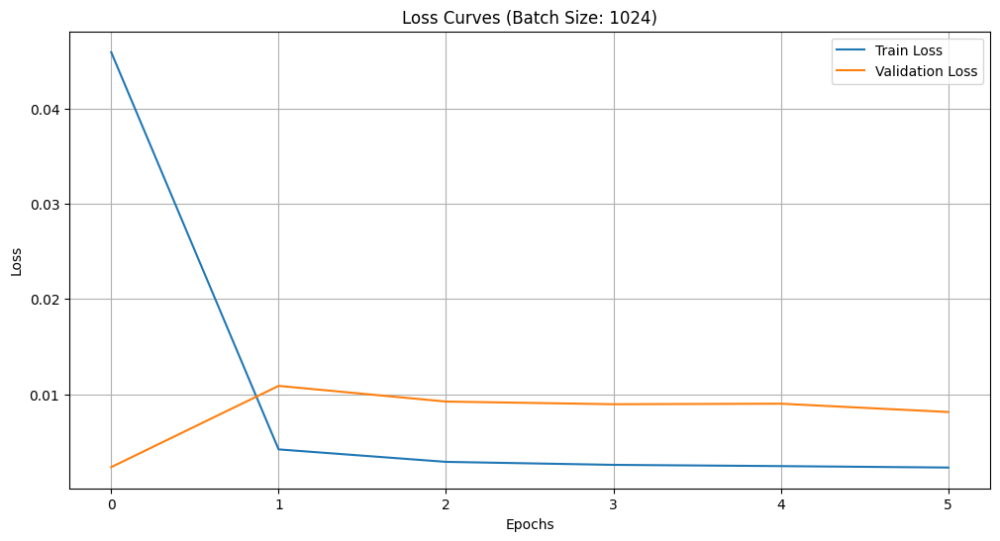

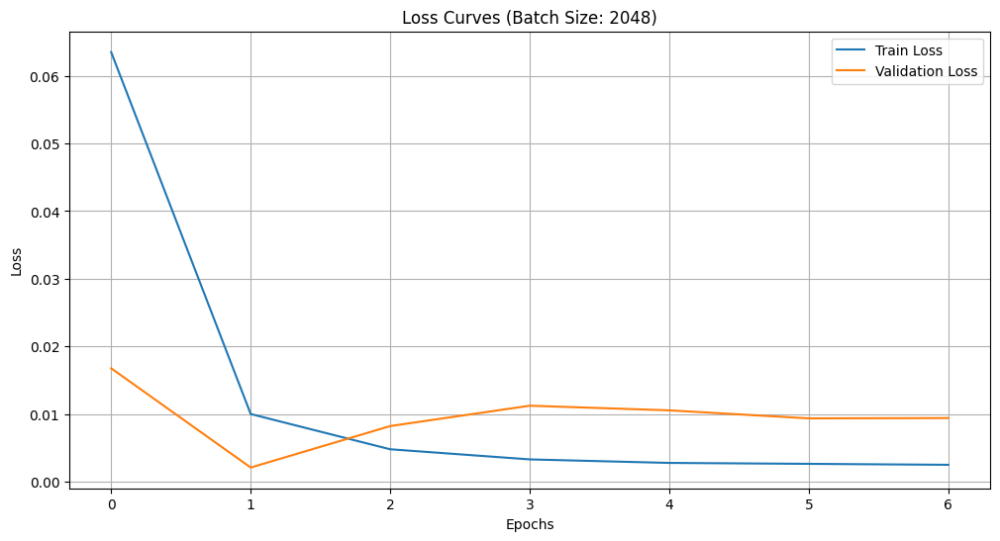

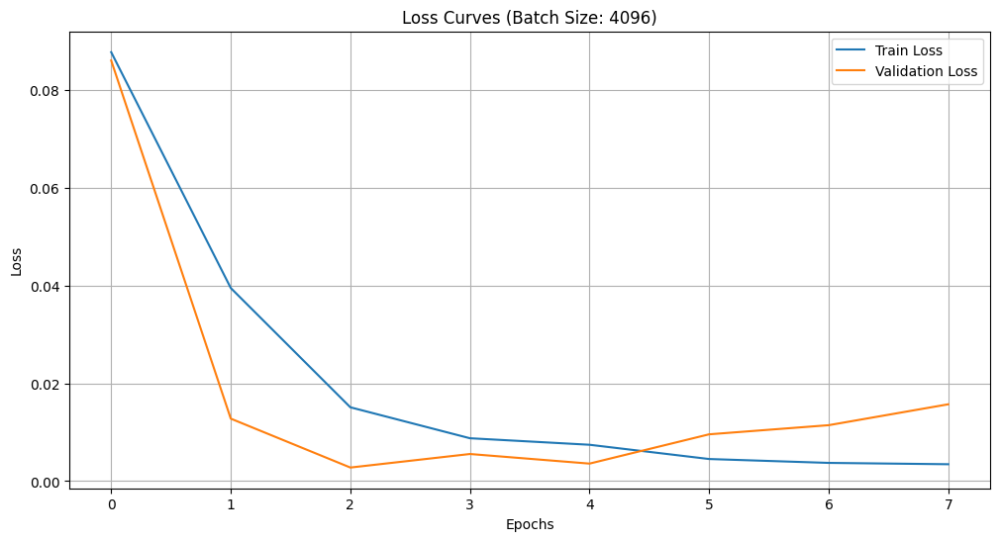

In [85]:
for batch_size in batch_sizes:
    plt.figure(figsize=(12, 6))
    plt.plot(history_dict[batch_size]['loss'], label='Train Loss')
    plt.plot(history_dict[batch_size]['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves (Batch Size: {batch_size})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()